<a href="https://colab.research.google.com/github/wenjunsun/Covid-19-analysis-with-uw-ubicomp/blob/master/analysis/correlational_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# This notebooks explores the correlation between various county metrics (like median house income) with people's behaviors (% of stay at home devices afte covid). Also explores the correlation between independent variables (median house income is related to % blacks in a community for example)

# 0. load data and packages.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
import numpy as np
import scipy as cp
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import glob
import os
import sys
import chardet
from datetime import datetime
from datetime import timedelta

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
cd drive/My\ Drive/analysis_with_demographics

/content/drive/My Drive/analysis_with_demographics


In [ ]:
ls

 2016_US_County_Level_Presidential_Results.csv
'2020 County Health Rankings Data - Additional Measure Data.csv'
'2020 County Health Rankings Data - Ranked Measure Data.csv'
 agg_social_dist
 county_data.csv
'new_Social Distancing vs. Demographics.ipynb'
 shelter_in_place_by_counties.csv
 shelter_in_place_by_states.csv
 state_data.csv
 us_states_governors.csv


# 1. prepare updated data sets about before and after covid/shelter in place using better data we have.

before = mean of each metric between days since -30 and -1 and after = mean metric between days 0 - 29.

In [ ]:
df_sip_county = pd.read_csv('shelter_in_place_by_counties.csv')
df_sip_county.head(1)

,Unnamed: 0,index,cnamelong,county_code,device_count_after_covid,device_count_after_sip,device_count_before,percent_completely_home_device_after_covid,percent_completely_home_device_after_sip,percent_completely_home_device_before,state,state_code
0,0,0,Aleutians East Borough,2013.0,73.792453,70.166667,36.930233,25.86397,27.506877,34.713127,2.0,AK


In [ ]:
df_sip_county.shape

(3226, 12)

In [ ]:
df_sip_state = pd.read_csv('shelter_in_place_by_states.csv')
df_sip_state.head(1)

,Unnamed: 0,index,state,state_code,device_count_before,percent_completely_home_device_before,device_count_after_covid,percent_completely_home_device_after_covid,device_count_after_sip,percent_completely_home_device_after_sip
0,0,0,1.0,AL,402474.883721,18.700837,405262.358491,29.676262,409230.861111,30.536431


In [ ]:
df_sip_state.shape

(56, 10)

notice there is only one column about before but 2 columns about after - after_covid and after_sip. For now we will just assume before means before shelter in place.

In [ ]:
data = pd.read_csv("agg_social_dist")

In [ ]:
data.drop(['date_range_start','date_range_end'],inplace=True, axis = 1)

In [ ]:
data.head(1)

,Unnamed: 0,state,state_code,cnamelong,county_code,days_since_first_case,days_since_shelter,candidate_device_count,device_count,completely_home_device_count,part_time_work_behavior_devices,full_time_work_behavior_devices,delivery_behavior_devices,median_home_dwell_time,median_non_home_dwell_time,median_percentage_time_home,distance_traveled_from_home
0,0,23.0,ME,Aroostook County,23003,-93.0,-91.0,0.0,56,20,5,7,0.0,477.0,NaN,NaN,22780.0


first let's make county data.

In [ ]:
# before_first_case_data = data[(data['days_since_first_case'] >= -30) & (data['days_since_first_case'] <= -1)]

In [ ]:
after_first_case_data = data[(data['days_since_first_case'] >= 0) & (data['days_since_first_case'] <= 29)]
after_first_case_data['percent_completely_home_device'] = after_first_case_data['completely_home_device_count'] / after_first_case_data['device_count']

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
before_sip_data = data[(data['days_since_shelter'] >= -30) & (data['days_since_shelter'] <= -1)]
before_sip_data['percent_completely_home_device'] = before_sip_data['completely_home_device_count'] / before_sip_data['device_count']

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
after_sip_data = data[(data['days_since_shelter'] >= 0) & (data['days_since_shelter'] <= 29)]
after_sip_data['percent_completely_home_device'] = after_sip_data['completely_home_device_count'] / after_sip_data['device_count']

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
after_first_case_data = after_first_case_data.groupby(['cnamelong','county_code','state','state_code']).agg(
    percent_completely_home_device_after_covid = ('percent_completely_home_device' ,'mean'),
    device_count_after_covid = ('device_count','mean')
).reset_index()

In [ ]:
after_first_case_data.head()

,cnamelong,county_code,state,state_code,percent_completely_home_device_after_covid,device_count_after_covid
0,Abbeville County,45001,45.0,SC,0.290856,1595.966667
1,Acadia Parish,22001,22.0,LA,0.277490,4169.500000
2,Accomack County,51001,51.0,VA,0.329359,1578.500000
3,Ada County,16001,16.0,ID,0.385269,21199.400000
4,Adair County,21001,21.0,KY,0.295031,723.615385


In [ ]:
before_sip_data = before_sip_data.groupby(['cnamelong','county_code','state','state_code']).agg(
    percent_completely_home_device_before = ('percent_completely_home_device' ,'mean'),
    device_count_before = ('device_count','mean')
).reset_index()

In [ ]:
after_sip_data = after_sip_data.groupby(['cnamelong','county_code','state','state_code']).agg(
    percent_completely_home_device_after_sip = ('percent_completely_home_device' ,'mean'),
    device_count_after_sip = ('device_count','mean')
).reset_index()

In [ ]:
merged_data = after_first_case_data.merge(before_sip_data, on=['cnamelong', 'county_code','state','state_code']).merge(after_sip_data, on=['cnamelong', 'county_code','state','state_code'])

In [ ]:
merged_data

,cnamelong,county_code,state,state_code,percent_completely_home_device_after_covid,device_count_after_covid,percent_completely_home_device_before,device_count_before,percent_completely_home_device_after_sip,device_count_after_sip
0,Abbeville County,45001,45.0,SC,0.290856,1595.966667,0.251283,1643.500000,0.289275,1622.033333
1,Acadia Parish,22001,22.0,LA,0.277490,4169.500000,0.196973,4547.500000,0.277490,4169.500000
2,Accomack County,51001,51.0,VA,0.329359,1578.500000,0.251292,1637.800000,0.337730,1608.633333
3,Ada County,16001,16.0,ID,0.385269,21199.400000,0.254269,22976.133333,0.406879,20765.800000
4,Adair County,21001,21.0,KY,0.295031,723.615385,0.234935,579.314815,0.299196,656.790698
...,...,...,...,...,...,...,...,...,...,...
2527,Yukon-Koyukuk Census Area,2290,2.0,AK,0.305974,57.933333,0.248405,58.666667,0.307165,56.200000
2528,Yuma County,4027,4.0,AZ,0.375288,7645.166667,0.308820,8294.161290,0.380388,7657.966667
2529,Yuma County,8125,8.0,CO,0.313485,603.766667,0.243436,624.733333,0.313770,606.966667
2530,Zapata County,48505,48.0,TX,0.333396,873.033333,0.230928,866.433333,0.340662,872.766667


don't know why merged_data only has 2532 rows now, the data we have before has 3100+ rows

In [ ]:
df_sip_county = merged_data

Now let's get the state data before and after first case and shelter in place

In [ ]:
after_first_case_data = data[(data['days_since_first_case'] >= 0) & (data['days_since_first_case'] <= 29)]
after_first_case_data['percent_completely_home_device'] = after_first_case_data['completely_home_device_count'] / after_first_case_data['device_count']

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
before_sip_data = data[(data['days_since_shelter'] >= -30) & (data['days_since_shelter'] <= -1)]
before_sip_data['percent_completely_home_device'] = before_sip_data['completely_home_device_count'] / before_sip_data['device_count']

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
after_sip_data = data[(data['days_since_shelter'] >= 0) & (data['days_since_shelter'] <= 29)]
after_sip_data['percent_completely_home_device'] = after_sip_data['completely_home_device_count'] / after_sip_data['device_count']

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
after_first_case_data = after_first_case_data.groupby(['state','state_code']).agg(
    percent_completely_home_device_after_covid = ('percent_completely_home_device' ,'mean'),
    device_count_after_covid = ('device_count','mean')
).reset_index()

In [ ]:
after_first_case_data.head()

,state,state_code,percent_completely_home_device_after_covid,device_count_after_covid
0,1.0,AL,0.285957,5419.659973
1,2.0,AK,0.369185,1867.387863
2,4.0,AZ,0.338725,19535.914815
3,6.0,CA,0.360097,28157.604794
4,8.0,CO,0.368620,4698.749259


In [ ]:
before_sip_data = before_sip_data.groupby(['state','state_code']).agg(
    percent_completely_home_device_before = ('percent_completely_home_device' ,'mean'),
    device_count_before = ('device_count','mean')
).reset_index()

In [ ]:
after_sip_data = after_sip_data.groupby(['state','state_code']).agg(
    percent_completely_home_device_after_sip = ('percent_completely_home_device' ,'mean'),
    device_count_after_sip = ('device_count','mean')
).reset_index()

In [ ]:
merged_data = after_first_case_data.merge(before_sip_data, on=['state','state_code']).merge(after_sip_data, on=['state','state_code'])

In [ ]:
merged_data.head()

,state,state_code,percent_completely_home_device_after_covid,device_count_after_covid,percent_completely_home_device_before,device_count_before,percent_completely_home_device_after_sip,device_count_after_sip
0,1.0,AL,0.285957,5419.659973,0.224034,5541.522919,0.284029,5519.678962
1,2.0,AK,0.369185,1867.387863,0.268757,1690.695556,0.373567,1590.420000
2,4.0,AZ,0.338725,19535.914815,0.280979,19898.166045,0.358653,18347.794444
3,6.0,CA,0.360097,28157.604794,0.250445,27082.176536,0.416449,24233.619883
4,8.0,CO,0.368620,4698.749259,0.269605,4734.396667,0.386002,4240.335000


In [ ]:
merged_data.shape

(47, 8)

again, here we only have 47 states rather than 56 as in original data. Don't know why? - because some states didn't have shelter in place orders at all, those data are excluded.

In [ ]:
df_sip_state = merged_data

save these aggregate data about counties and states. 

In [ ]:
df_sip_county.to_csv("county_data.csv", index=False)

In [ ]:
df_sip_state.to_csv("state_data.csv", index=False)

# 2. Run past correlation analysis on new data

In [ ]:
#df_chr_1 = pd.read_csv(DATA_DIR+'/demobraphics/CHR/2020 County Health Rankings Data - Ranked Measure Data.csv')
#df_chr_2 = pd.read_csv(DATA_DIR+'/demobraphics/CHR/2020 County Health Rankings Data - Additional Measure Data.csv')
#df_sip_county = pd.read_csv(DATA_DIR+'/safegraph/social-distancing/shelter_in_place_by_counties.csv')
#df_sip_state = pd.read_csv(DATA_DIR+'/safegraph/social-distancing/shelter_in_place_by_states.csv')
df_chr_1 = pd.read_csv('2020 County Health Rankings Data - Ranked Measure Data.csv')
df_chr_2 = pd.read_csv('2020 County Health Rankings Data - Additional Measure Data.csv')
# df_sip_county = pd.read_csv('shelter_in_place_by_counties.csv')
df_sip_county['diff_after_covid'] = df_sip_county.apply(lambda x: x['percent_completely_home_device_after_covid'] - x['percent_completely_home_device_before'], axis=1)
df_sip_county['diff_after_sip'] = df_sip_county.apply(lambda x: x['percent_completely_home_device_after_sip'] - x['percent_completely_home_device_before'], axis=1)
# df_sip_state = pd.read_csv('shelter_in_place_by_states.csv')
df_sip_state['diff_after_covid'] = df_sip_state.apply(lambda x: x['percent_completely_home_device_after_covid'] - x['percent_completely_home_device_before'], axis=1)
df_sip_state['diff_after_sip'] = df_sip_state.apply(lambda x: x['percent_completely_home_device_after_sip'] - x['percent_completely_home_device_before'], axis=1)
df_governors = pd.read_csv('us_states_governors.csv', encoding='latin-1')
df_election = pd.read_csv('2016_US_County_Level_Presidential_Results.csv')

In [ ]:
df_election['political_party'] = df_election.apply(lambda x: 'Republican' if x['per_gop'] > x['per_dem'] else 'Democratic', axis=1)
df_election['political_diff'] = df_election.apply(lambda x: x['per_dem'] - x['per_gop'], axis=1)

In [ ]:
df_election

,Unnamed: 0,votes_dem,votes_gop,total_votes,per_dem,per_gop,diff,per_point_diff,state_abbr,county_name,combined_fips,political_party,political_diff
0,0,93003.0,130413.0,246588.0,0.377159,0.528870,"37,410",15.17%,AK,Alaska,2013,Republican,-0.151711
1,1,93003.0,130413.0,246588.0,0.377159,0.528870,"37,410",15.17%,AK,Alaska,2016,Republican,-0.151711
2,2,93003.0,130413.0,246588.0,0.377159,0.528870,"37,410",15.17%,AK,Alaska,2020,Republican,-0.151711
3,3,93003.0,130413.0,246588.0,0.377159,0.528870,"37,410",15.17%,AK,Alaska,2050,Republican,-0.151711
4,4,93003.0,130413.0,246588.0,0.377159,0.528870,"37,410",15.17%,AK,Alaska,2060,Republican,-0.151711
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3136,3136,3233.0,12153.0,16661.0,0.194046,0.729428,"8,920",53.54%,WY,Sweetwater County,56037,Republican,-0.535382
3137,3137,7313.0,3920.0,12176.0,0.600608,0.321945,"3,393",27.87%,WY,Teton County,56039,Democratic,0.278663
3138,3138,1202.0,6154.0,8053.0,0.149261,0.764187,"4,952",61.49%,WY,Uinta County,56041,Republican,-0.614926
3139,3139,532.0,2911.0,3715.0,0.143203,0.783580,"2,379",64.04%,WY,Washakie County,56043,Republican,-0.640377


In [ ]:
df_sip_county

,cnamelong,county_code,state,state_code,percent_completely_home_device_after_covid,device_count_after_covid,percent_completely_home_device_before,device_count_before,percent_completely_home_device_after_sip,device_count_after_sip,diff_after_covid,diff_after_sip
0,Abbeville County,45001,45.0,SC,0.290856,1595.966667,0.251283,1643.500000,0.289275,1622.033333,0.039574,0.037992
1,Acadia Parish,22001,22.0,LA,0.277490,4169.500000,0.196973,4547.500000,0.277490,4169.500000,0.080516,0.080516
2,Accomack County,51001,51.0,VA,0.329359,1578.500000,0.251292,1637.800000,0.337730,1608.633333,0.078066,0.086438
3,Ada County,16001,16.0,ID,0.385269,21199.400000,0.254269,22976.133333,0.406879,20765.800000,0.131000,0.152610
4,Adair County,21001,21.0,KY,0.295031,723.615385,0.234935,579.314815,0.299196,656.790698,0.060096,0.064261
...,...,...,...,...,...,...,...,...,...,...,...,...
2527,Yukon-Koyukuk Census Area,2290,2.0,AK,0.305974,57.933333,0.248405,58.666667,0.307165,56.200000,0.057569,0.058760
2528,Yuma County,4027,4.0,AZ,0.375288,7645.166667,0.308820,8294.161290,0.380388,7657.966667,0.066468,0.071569
2529,Yuma County,8125,8.0,CO,0.313485,603.766667,0.243436,624.733333,0.313770,606.966667,0.070049,0.070334
2530,Zapata County,48505,48.0,TX,0.333396,873.033333,0.230928,866.433333,0.340662,872.766667,0.102468,0.109734


In [ ]:
df_chr = df_chr_1.merge(df_chr_2, on=['FIPS', 'State', 'County'])
columns = ['FIPS', 'State', 'County', 'Population_y', 'Years of Potential Life Lost Rate', '% Fair or Poor Health', 
           'Average Number of Physically Unhealthy Days', 'Average Number of Mentally Unhealthy Days',
           '% Low Birthweight', '% Smokers', '% Adults with Obesity', 'Food Environment Index', 
           '% Physically Inactive', '% With Access to Exercise Opportunities', '% Excessive Drinking',
           '% Driving Deaths with Alcohol Involvement', 'Chlamydia Rate', 'Teen Birth Rate', '% Uninsured_x',
           'Primary Care Physicians Rate', 'Primary Care Physicians Ratio', 
           'Dentist Rate', 'Dentist Ratio', 'Mental Health Provider Rate', 'Mental Health Provider Ratio',
           'Preventable Hospitalization Rate', '% With Annual Mammogram', '% Vaccinated',
           'High School Graduation Rate', '% Some College', '% Unemployed', '% Children in Poverty',
           'Income Ratio', '% Single-Parent Households', 'Social Association Rate', 'Violent Crime Rate',
           'Injury Death Rate', 'Average Daily PM2.5', 'Presence of Water Violation', '% Severe Housing Problems',
           '% Drive Alone to Work', '% Long Commute - Drives Alone',
           'Life Expectancy', 'Age-Adjusted Death Rate', 'Child Mortality Rate',
           'Infant Mortality Rate', '% Frequent Physical Distress', '% Frequent Mental Distress',
           '% Adults with Diabetes', 'HIV Prevalence Rate', 
           '% Food Insecure', '% Limited Access to Healthy Foods',
           'Drug Overdose Mortality Rate', 'Motor Vehicle Mortality Rate',
           '% Insufficient Sleep', '% Uninsured_y', '% Uninsured.1',
           'Other Primary Care Provider Rate', 'Other Primary Care Provider Ratio','% Disconnected Youth',
           'Average Grade Performance', 'Average Grade Performance.1', 'Median Household Income', 
           '% Enrolled in Free or Reduced Lunch', 'Segregation index', 'Segregation Index', 'Homicide Rate',
           'Suicide Rate (Age-Adjusted)', 'Firearm Fatalities Rate',
           'Juvenile Arrest Rate', 'Average Traffic Volume per Meter of Major Roadways',
           '% Homeowners', '% Severe Housing Cost Burden', '% less than 18 years of age', '% 65 and over',
           '% Black', '% American Indian & Alaska Native', '% Asian', '% Native Hawaiian/Other Pacific Islander',
           '% Hispanic', '% Non-Hispanic White', '% Not Proficient in English', '% Female', '% Rural'
          ]
df_chr = df_chr[columns]

In [ ]:
df_chr_1.head()

,FIPS,State,County,Deaths,Years of Potential Life Lost Rate,95% CI - Low,95% CI - High,Quartile,YPLL Rate (AIAN),YPLL Rate (AIAN) 95% CI - Low,YPLL Rate (AIAN) 95% CI - High,YPLL Rate (Asian),YPLL Rate (Asian) 95% CI - Low,YPLL Rate (Asian) 95% CI - High,YPLL Rate (Black),YPLL Rate (Black) 95% CI - Low,YPLL Rate (Black) 95% CI - High,YPLL Rate (Hispanic),YPLL Rate (Hispanic) 95% CI - Low,YPLL Rate (Hispanic) 95% CI - High,YPLL Rate (White),YPLL Rate (White) 95% CI - Low,YPLL Rate (White) 95% CI - High,% Fair or Poor Health,95% CI - Low.1,95% CI - High.1,Quartile.1,Average Number of Physically Unhealthy Days,95% CI - Low.2,95% CI - High.2,Quartile.2,Average Number of Mentally Unhealthy Days,95% CI - Low.3,95% CI - High.3,Quartile.3,Unreliable,% Low Birthweight,95% CI - Low.4,95% CI - High.4,Quartile.4,...,Presence of Water Violation,Quartile.31,% Severe Housing Problems,95% CI - Low.16,95% CI - High.16,Severe Housing Cost Burden,Severe Housing Cost Burden 95% CI - Low,Severe Housing Cost Burden 95% CI - High,Overcrowding,Overcrowding 95% CI - Low,Overcrowding 95% CI - High,Inadequate Facilities,Inadequate Facilities 95% CI - Low,Inadequate Facilities 95% CI - High,Quartile.32,% Drive Alone to Work,95% CI - Low.17,95% CI - High.17,Quartile.33,% Drive Alone (AIAN),% Drive Alone (AIAN) 95% CI - Low,% Drive Alone (AIAN) 95% CI - High,% Drive Alone (Asian),% Drive Alone (Asian) 95% CI - Low,% Drive Alone (Asian) 95% CI - High,% Drive Alone (Black),% Drive Alone (Black) 95% CI - Low,% Drive Alone (Black) 95% CI - High,% Drive Alone (Hispanic),% Drive Alone (Hispanic) 95% CI - Low,% Drive Alone (Hispanic) 95% CI - High,% Drive Alone (White),% Drive Alone (White) 95% CI - Low,% Drive Alone (White) 95% CI - High,# Workers who Drive Alone,% Long Commute - Drives Alone,95% CI - Low.18,95% CI - High.18,Quartile.34,Unnamed: 240
0,1000,Alabama,NaN,81791.0,9943.0,9841.0,10045.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22,21,23,NaN,4.9,4.6,5.2,NaN,4.9,4.6,5.3,NaN,NaN,10.0,10.0,10.0,NaN,...,NaN,NaN,14,14,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,86.0,86.0,86.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2051445.0,34.0,34.0,35.0,NaN,NaN
1,1001,Alabama,Autauga,791.0,8129.0,7283.0,8974.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,10201.0,8124.0,12279.0,NaN,NaN,NaN,7886.0,6924.0,8848.0,21,20,21,1.0,4.7,4.6,4.9,2.0,4.7,4.5,4.8,1.0,NaN,9.0,8.0,9.0,1.0,...,No,1.0,15,12,17,13.0,10.0,15.0,1.0,1.0,2.0,1.0,0.0,2.0,3.0,87.0,85.0,88.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,82.0,76.0,89.0,NaN,NaN,NaN,84.0,80.0,89.0,24428.0,40.0,36.0,43.0,3.0,NaN
2,1003,Alabama,Baldwin,2967.0,7354.0,6919.0,7790.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,9891.0,8389.0,11392.0,3570.0,2373.0,5160.0,7436.0,6940.0,7931.0,18,17,18,1.0,4.2,4.1,4.4,1.0,4.3,4.1,4.5,1.0,NaN,8.0,8.0,9.0,1.0,...,No,1.0,14,12,15,12.0,11.0,14.0,1.0,1.0,2.0,0.0,0.0,1.0,3.0,84.0,83.0,86.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,83.0,91.0,68.0,56.0,81.0,83.0,81.0,85.0,91420.0,42.0,39.0,44.0,3.0,NaN
3,1005,Alabama,Barbour,472.0,10254.0,8782.0,11725.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,12422.0,10131.0,14713.0,NaN,NaN,NaN,8140.0,6329.0,9951.0,30,29,30,4.0,5.4,5.3,5.6,4.0,5.2,5.0,5.4,4.0,NaN,11.0,10.0,13.0,3.0,...,No,1.0,15,12,17,13.0,11.0,16.0,2.0,1.0,2.0,1.0,0.0,1.0,3.0,83.0,81.0,86.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,81.0,76.0,87.0,NaN,NaN,NaN,87.0,85.0,90.0,8538.0,32.0,27.0,37.0,2.0,NaN
4,1007,Alabama,Bibb,471.0,11978.0,10344.0,13611.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,13085.0,9431.0,17687.0,NaN,NaN,NaN,12241.0,10344.0,14139.0,19,19,20,1.0,4.6,4.4,4.8,1.0,4.6,4.4,4.7,1.0,NaN,10.0,9.0,12.0,3.0,...,No,1.0,10,7,14,10.0,6.0,14.0,0.0,0.0,1.0,1.0,0.0,2.0,1.0,85.0,80.0,90.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7946.0,50.0,42.0,58.0,4.0,NaN


In [ ]:
df_merged = df_sip_county.merge(df_governors, how='left', left_on='state_code', right_on='State Code')
df_merged = df_merged.merge(df_chr, left_on='county_code', right_on='FIPS')
df_merged = df_merged.merge(df_election, left_on='county_code', right_on='combined_fips')
df_merged

,cnamelong,county_code,state,state_code,percent_completely_home_device_after_covid,device_count_after_covid,percent_completely_home_device_before,device_count_before,percent_completely_home_device_after_sip,device_count_after_sip,diff_after_covid,diff_after_sip,State Code,State Name,Governor,Party,Date,Shelter at home begins,Shelter in place ends,Reopen,FIPS,State,County,Population_y,Years of Potential Life Lost Rate,% Fair or Poor Health,Average Number of Physically Unhealthy Days,Average Number of Mentally Unhealthy Days,% Low Birthweight,% Smokers,% Adults with Obesity,Food Environment Index,% Physically Inactive,% With Access to Exercise Opportunities,% Excessive Drinking,% Driving Deaths with Alcohol Involvement,Chlamydia Rate,Teen Birth Rate,% Uninsured_x,Primary Care Physicians Rate,...,Other Primary Care Provider Rate,Other Primary Care Provider Ratio,% Disconnected Youth,Average Grade Performance,Average Grade Performance.1,Median Household Income,% Enrolled in Free or Reduced Lunch,Segregation index,Segregation Index,Homicide Rate,Suicide Rate (Age-Adjusted),Firearm Fatalities Rate,Juvenile Arrest Rate,Average Traffic Volume per Meter of Major Roadways,% Homeowners,% Severe Housing Cost Burden,% less than 18 years of age,% 65 and over,% Black,% American Indian & Alaska Native,% Asian,% Native Hawaiian/Other Pacific Islander,% Hispanic,% Non-Hispanic White,% Not Proficient in English,% Female,% Rural,Unnamed: 0,votes_dem,votes_gop,total_votes,per_dem,per_gop,diff,per_point_diff,state_abbr,county_name,combined_fips,political_party,political_diff
0,Abbeville County,45001,45.0,SC,0.290856,1595.966667,0.251283,1643.500000,0.289275,1622.033333,0.039574,0.037992,SC,South Carolina,Henry McMaster,Republican,24-Jan-17,4/7/2020,5/4/2020,5/9/2020,45001,South Carolina,Abbeville,24541,9533.0,20,4.3,4.8,9.0,17,37,7.8,29,59.0,16,30.0,647.2,28.0,13.0,57.0,...,65.0,1534:1,11.0,3.2,3.7,42412.0,75.0,28.0,26.0,9.0,18.0,20.0,NaN,12,76,16.0,20.1,21.8,27.5,0.3,0.4,0.0,1.5,68.9,0,51.6,78.6,2315,3712.0,6742.0,10724.0,0.346140,0.628683,"3,030",28.25%,SC,Abbeville County,45001,Republican,-0.282544
1,Acadia Parish,22001,22.0,LA,0.277490,4169.500000,0.196973,4547.500000,0.277490,4169.500000,0.080516,0.080516,LA,Louisiana,John Bel Edwards,Democratic,11-Jan-16,3/23/2020,5/15/2020,5/11/2020,22001,Louisiana,Acadia,62190,9742.0,21,4.8,5.0,10.0,22,38,7.8,35,43.0,20,27.0,576.8,47.0,11.0,37.0,...,27.0,3658:1,16.0,3.0,3.0,40484.0,46.0,48.0,45.0,11.0,16.0,20.0,NaN,64,71,10.0,25.8,15.3,17.9,0.4,0.3,0.0,2.7,77.3,1,51.2,51.7,1112,5638.0,21159.0,27386.0,0.205872,0.772621,"15,521",56.67%,LA,Acadia Parish,22001,Republican,-0.566749
2,Accomack County,51001,51.0,VA,0.329359,1578.500000,0.251292,1637.800000,0.337730,1608.633333,0.078066,0.086438,VA,Virginia,Ralph Northam,Democratic,10-Jan-18,3/30/2020,NaN,4/27/2020,51001,Virginia,Accomack,32412,9630.0,20,4.2,4.2,10.0,18,36,7.9,36,37.0,15,36.0,648.3,31.0,17.0,49.0,...,62.0,1621:1,NaN,2.9,2.9,42879.0,67.0,21.0,19.0,10.0,15.0,16.0,20.0,60,68,12.0,20.5,23.6,28.0,0.7,0.8,0.2,9.3,60.0,4,51.2,100.0,2805,6737.0,8582.0,15755.0,0.427610,0.544716,"1,845",11.71%,VA,Accomack County,51001,Republican,-0.117106
3,Ada County,16001,16.0,ID,0.385269,21199.400000,0.254269,22976.133333,0.406879,20765.800000,0.131000,0.152610,ID,Idaho,Brad Little,Republican,2019,3/25/2020,5/1/2020,5/7/2020,16001,Idaho,Ada,469966,5088.0,11,3.2,3.5,7.0,12,26,8.1,15,89.0,18,29.0,448.7,13.0,9.0,94.0,...,155.0,644:1,5.0,3.2,3.1,66827.0,31.0,49.0,21.0,1.0,20.0,13.0,NaN,277,68,12.0,23.8,14.4,1.2,0.8,2.8,0.2,8.3,84.5,1,49.9,5.5,649,75676.0,93748.0,195587.0,0.386917,0.479316,"18,072",9.24%,ID,Ada County,16001,Republican,-0.092399
4,Adair County,21001,21.0,KY,0.295031,723.615385,0.234935,579.314815,0.299196,656.790698,0.060096,0.064261,KY,Kentucky,Andy Beshear,Democratic,10-Dec-19,3/26/2020,NaN,5/4/2020,21001,Kentucky,Adair,19215,10222.0,23,5.0,5.1,8.0,23,41,7.4,33,60.0,16,19.0,272.0,25.0,7.0,36.0,...,83.0,1201:1,NaN,3.0,3.0,37392.0,69.0,54.0,51.0,NaN,15.0,12.0,N

In [ ]:
df_merged.to_csv("merged_data.csv", index=False)

Now let's see how independent variables (% asians, median income) affect response variables (% completely at home devices)

In [ ]:
corr_columns = [
    'Population_y', 'Years of Potential Life Lost Rate', '% Fair or Poor Health', 
    'Average Number of Physically Unhealthy Days', 'Average Number of Mentally Unhealthy Days',
    '% Low Birthweight', '% Smokers', '% Adults with Obesity', 'Food Environment Index', 
    '% Physically Inactive', '% With Access to Exercise Opportunities', '% Excessive Drinking',
    '% Driving Deaths with Alcohol Involvement', 'Chlamydia Rate', 'Teen Birth Rate', '% Uninsured_x',
    'Primary Care Physicians Rate', 
    'Dentist Rate', 'Mental Health Provider Rate', 
    'Preventable Hospitalization Rate', '% With Annual Mammogram', '% Vaccinated',
    'High School Graduation Rate', '% Some College', '% Unemployed', '% Children in Poverty',
    'Income Ratio', '% Single-Parent Households', 'Social Association Rate', 'Violent Crime Rate',
    'Injury Death Rate', 'Average Daily PM2.5', '% Severe Housing Problems',
    '% Drive Alone to Work', '% Long Commute - Drives Alone',
    'Life Expectancy', 'Age-Adjusted Death Rate', 'Child Mortality Rate',
    'Infant Mortality Rate', '% Frequent Physical Distress', '% Frequent Mental Distress',
    '% Adults with Diabetes', 'HIV Prevalence Rate', 
    '% Food Insecure', '% Limited Access to Healthy Foods',
    'Drug Overdose Mortality Rate', 'Motor Vehicle Mortality Rate',
    '% Insufficient Sleep', '% Uninsured_y', '% Uninsured.1',
    'Other Primary Care Provider Rate', '% Disconnected Youth',
    'Average Grade Performance', 'Average Grade Performance.1', 'Median Household Income', 
    '% Enrolled in Free or Reduced Lunch', 'Segregation index', 'Segregation Index', 'Homicide Rate',
    'Suicide Rate (Age-Adjusted)', 'Firearm Fatalities Rate',
    'Juvenile Arrest Rate', 'Average Traffic Volume per Meter of Major Roadways',
    '% Homeowners', '% Severe Housing Cost Burden', '% less than 18 years of age', '% 65 and over',
    '% Black', '% American Indian & Alaska Native', '% Asian', '% Native Hawaiian/Other Pacific Islander',
    '% Hispanic', '% Non-Hispanic White', '% Not Proficient in English', '% Female', '% Rural', 'political_diff'
]

======= Preventable Hospitalization Rate
Since COVID19 (03/15), normality 144.10926, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.17589, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.21662, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 317.18350, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.24949, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.29287, 0.00000 SIGNIFICANT


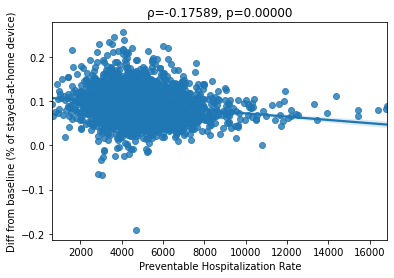

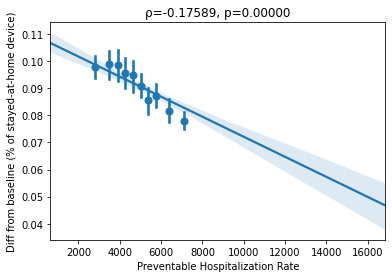

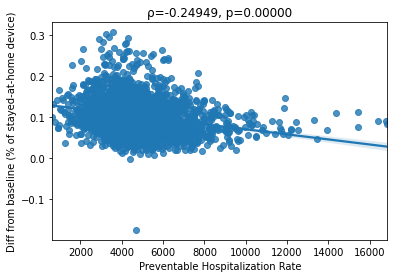

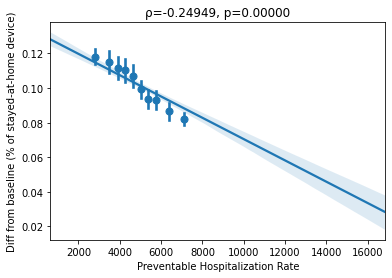

======= % Driving Deaths with Alcohol Involvement
Since COVID19 (03/15), normality 143.65220, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.08616, 0.00002 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.10505, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 316.84464, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.09671, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.13429, 0.00000 SIGNIFICANT


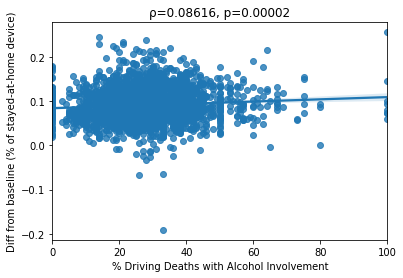

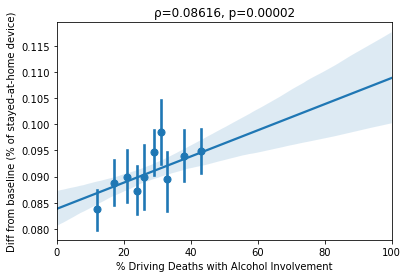

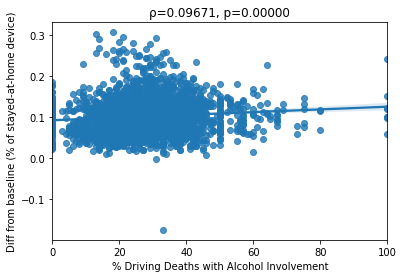

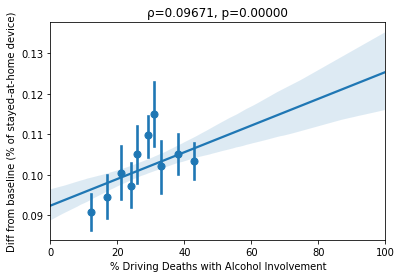

======= % Low Birthweight
Since COVID19 (03/15), normality 143.08913, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.32991, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.38962, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 316.42627, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.36951, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.42539, 0.00000 SIGNIFICANT


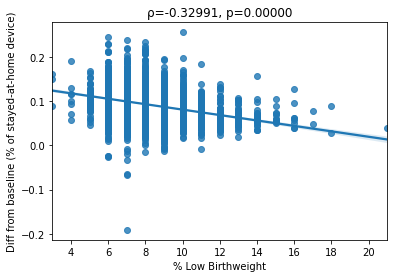

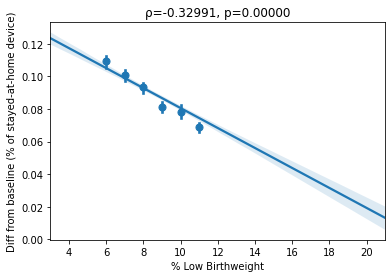

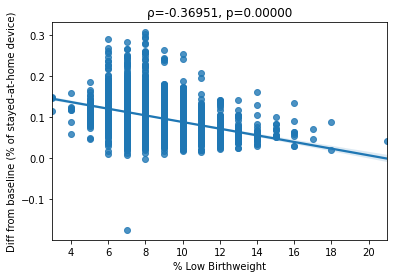

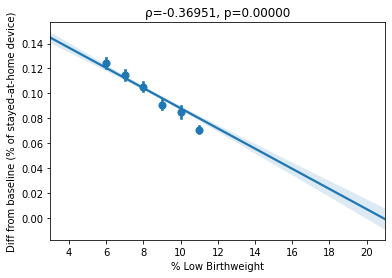

======= Life Expectancy
Since COVID19 (03/15), normality 142.52898, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.35624, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.42254, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.18895, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.52903, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.57124, 0.00000 SIGNIFICANT


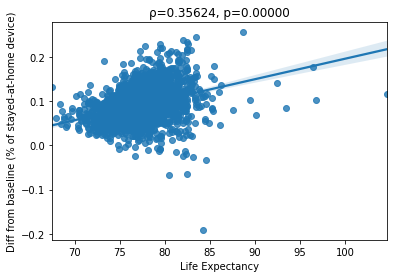

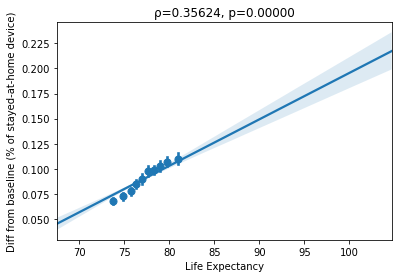

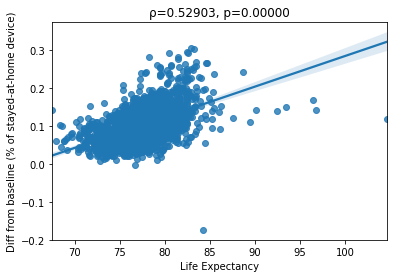

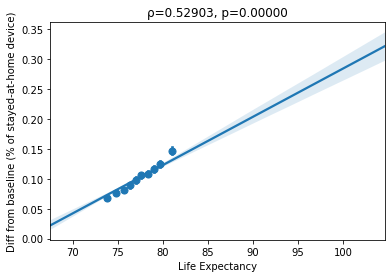

======= % With Annual Mammogram
Since COVID19 (03/15), normality 141.88446, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.28076, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.29238, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 316.36356, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.29533, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.32283, 0.00000 SIGNIFICANT


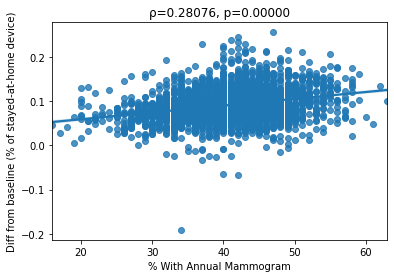

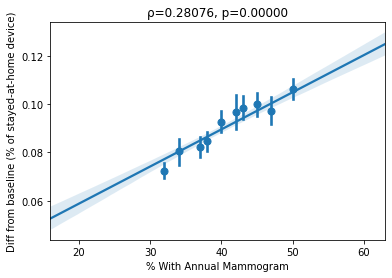

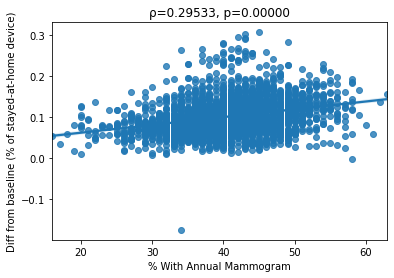

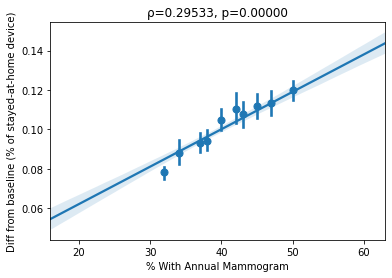

======= % Vaccinated
Since COVID19 (03/15), normality 141.88446, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.29139, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.32915, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 316.36356, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.34158, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.37407, 0.00000 SIGNIFICANT


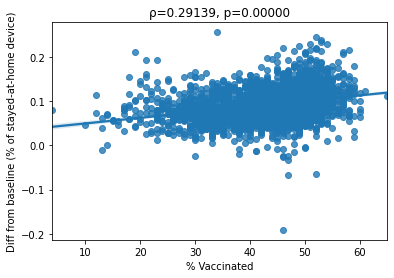

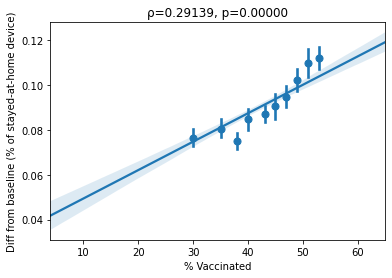

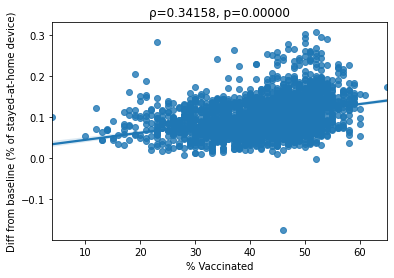

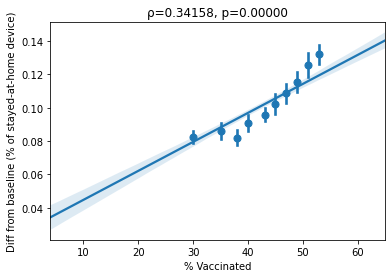

======= % With Access to Exercise Opportunities
Since COVID19 (03/15), normality 141.81101, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.33350, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.35235, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 316.72998, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.49793, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.51295, 0.00000 SIGNIFICANT


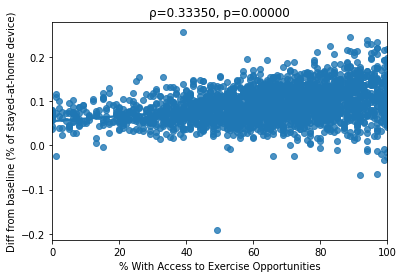

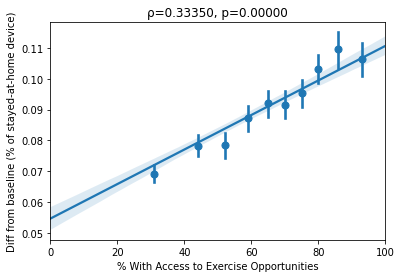

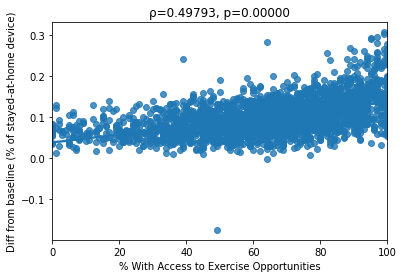

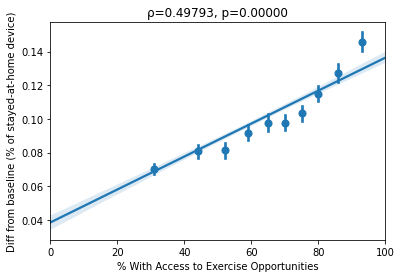

======= % Rural
Since COVID19 (03/15), normality 141.81101, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.22380, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.23089, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 316.72998, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.41587, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.38449, 0.00000 SIGNIFICANT


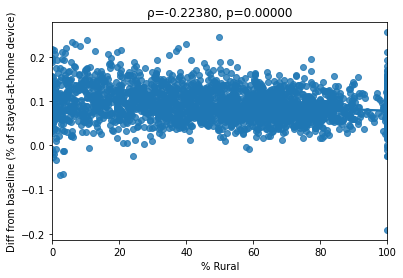

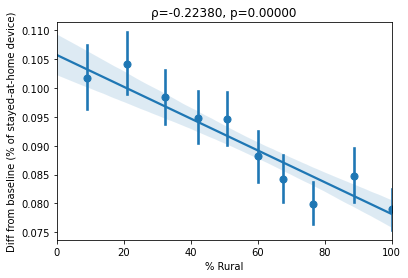

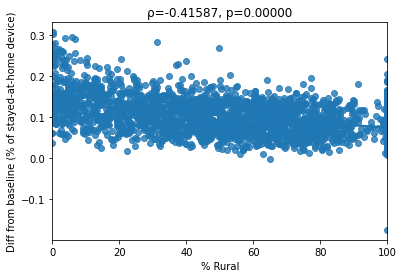

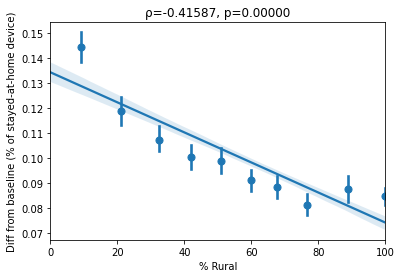

======= Population_y
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.04598, 0.02271 
Since COVID19 (03/15), spearmanr 0.27529, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.33823, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.41887, 0.00000 SIGNIFICANT


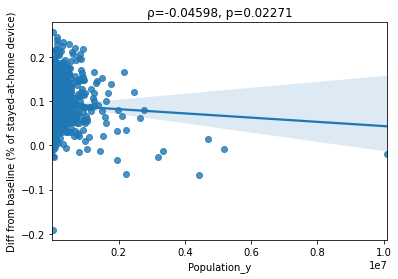

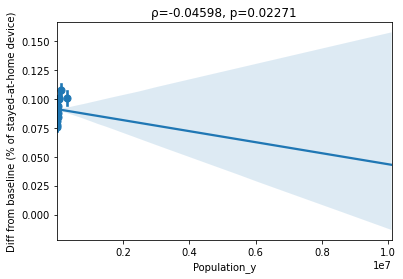

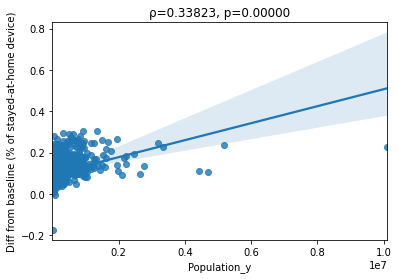

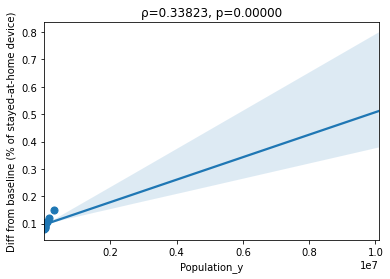

======= % Fair or Poor Health
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.42042, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.50623, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.53002, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.61624, 0.00000 SIGNIFICANT


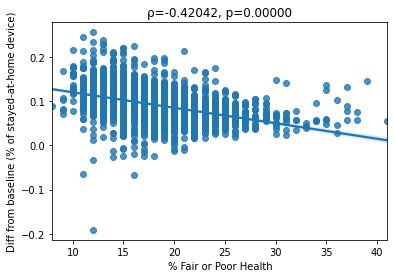

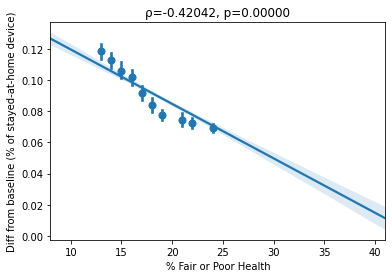

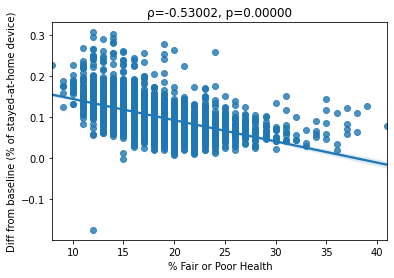

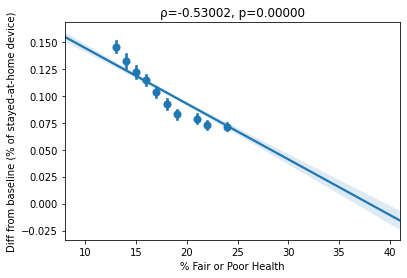

======= Average Number of Physically Unhealthy Days
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.34479, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.39204, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.48152, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.51092, 0.00000 SIGNIFICANT


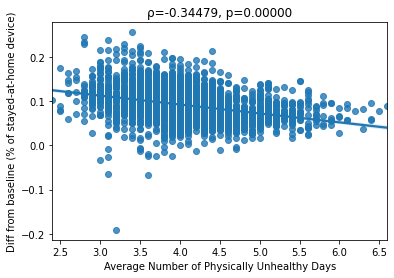

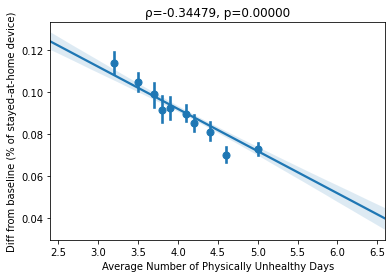

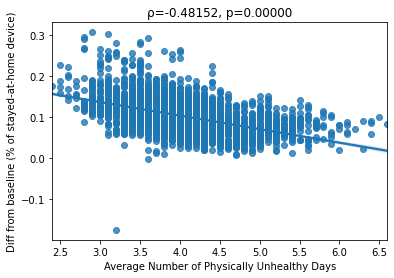

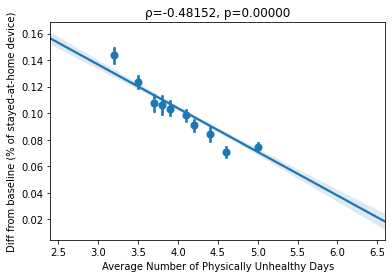

======= Average Number of Mentally Unhealthy Days
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.26617, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.29100, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.39989, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.40544, 0.00000 SIGNIFICANT


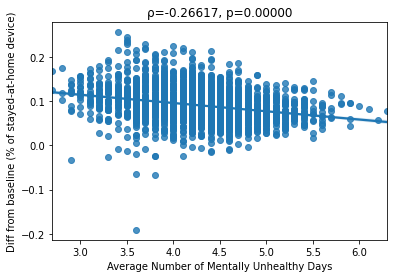

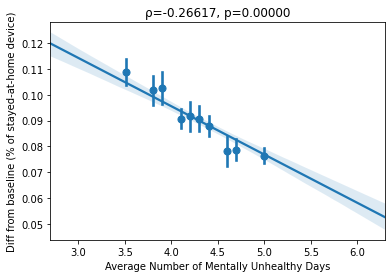

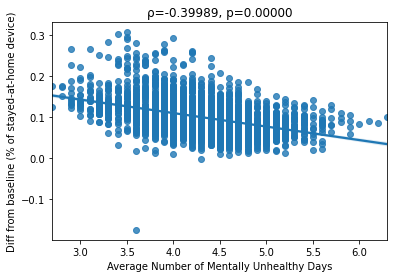

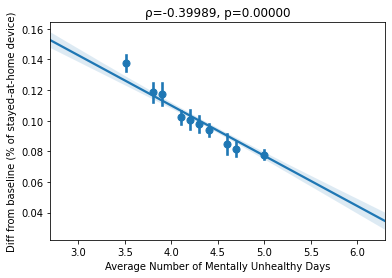

======= % Smokers
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.27737, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.30948, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.46178, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.45148, 0.00000 SIGNIFICANT


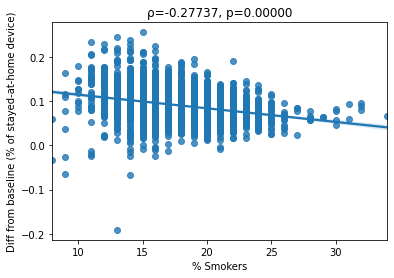

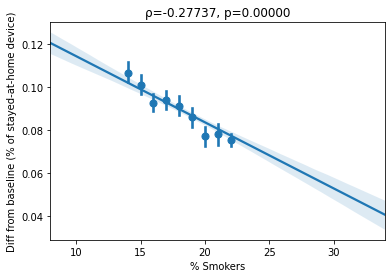

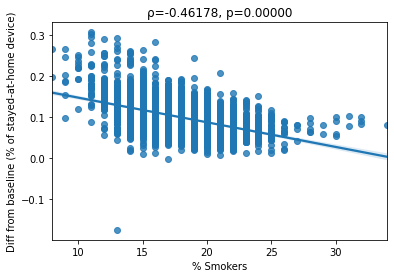

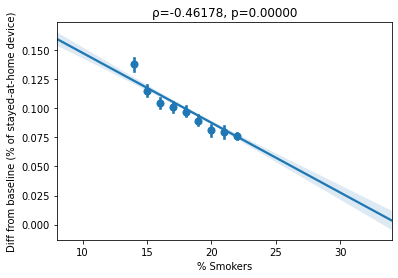

======= % Adults with Obesity
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.16588, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.17577, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.36825, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.33012, 0.00000 SIGNIFICANT


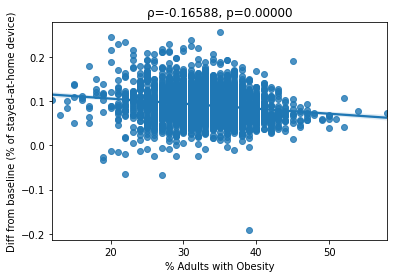

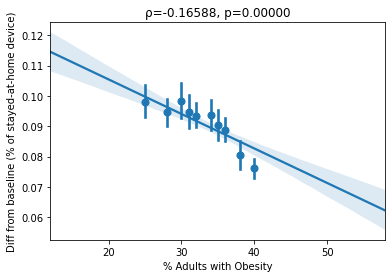

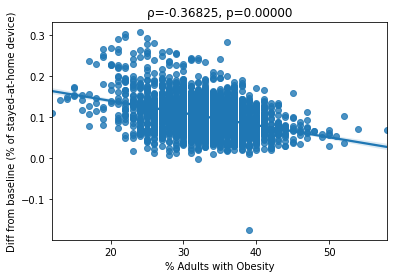

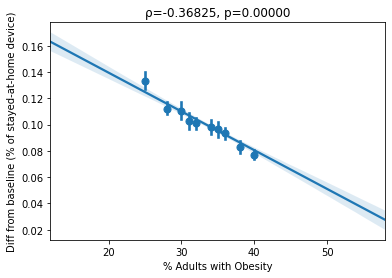

======= % Physically Inactive
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.31748, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.35784, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.50098, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.51667, 0.00000 SIGNIFICANT


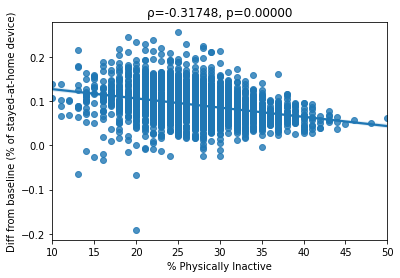

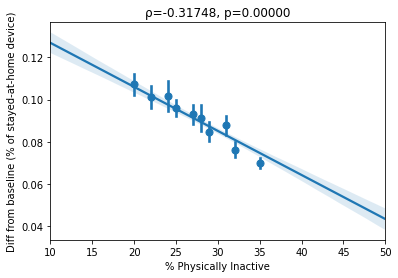

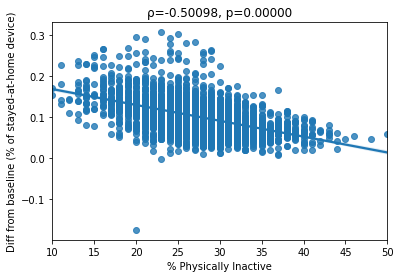

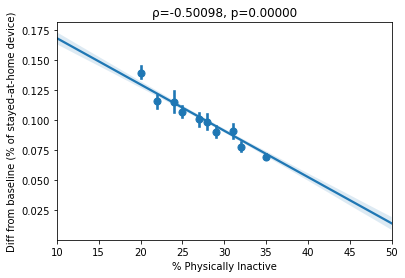

======= % Excessive Drinking
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.40613, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.46951, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.49779, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.56714, 0.00000 SIGNIFICANT


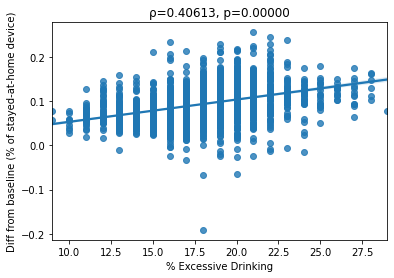

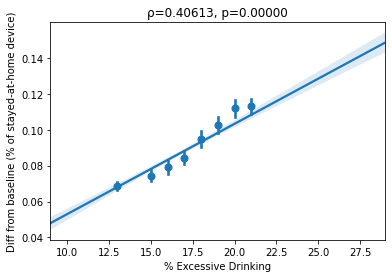

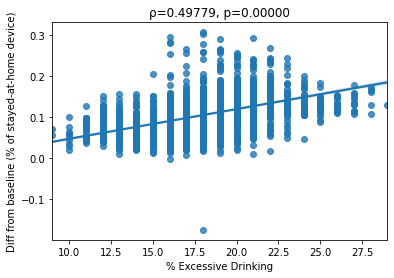

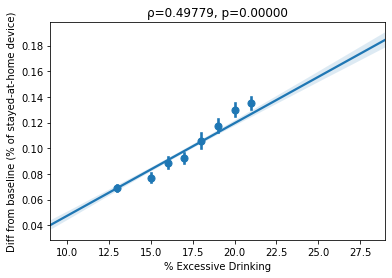

======= % Uninsured_x
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.49135, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.60073, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.53961, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.65323, 0.00000 SIGNIFICANT


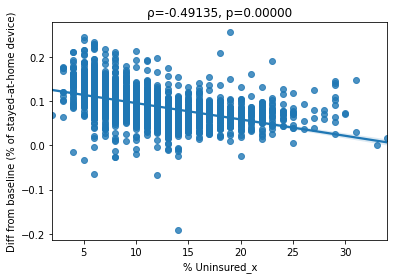

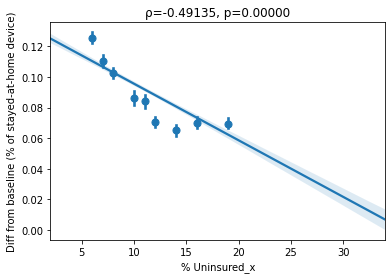

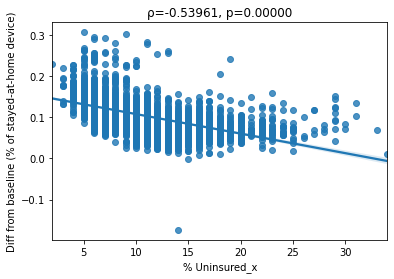

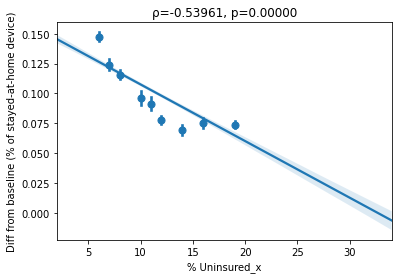

======= % Some College
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.38233, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.41254, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.54294, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.56165, 0.00000 SIGNIFICANT


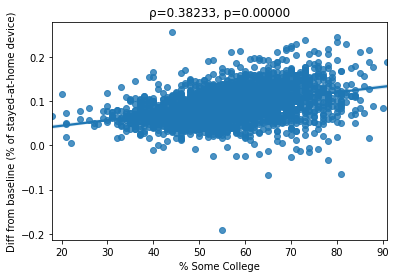

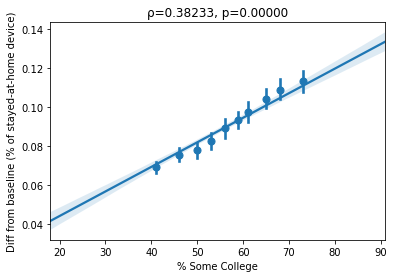

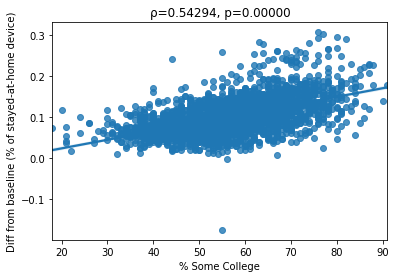

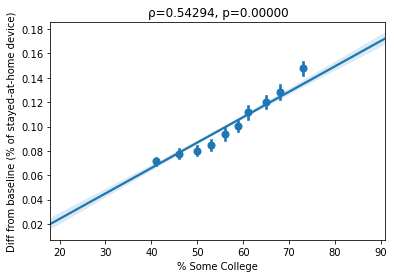

======= % Unemployed
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.01815, 0.36864 
Since COVID19 (03/15), spearmanr -0.03893, 0.05375 
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.09299, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.10628, 0.00000 SIGNIFICANT


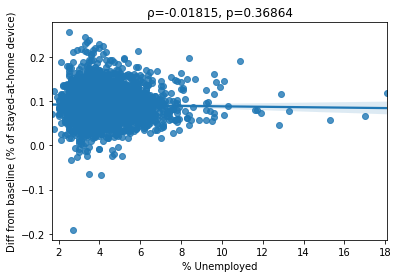

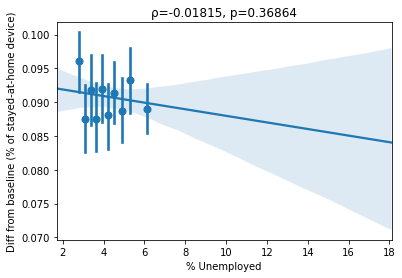

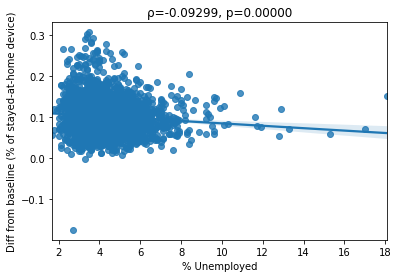

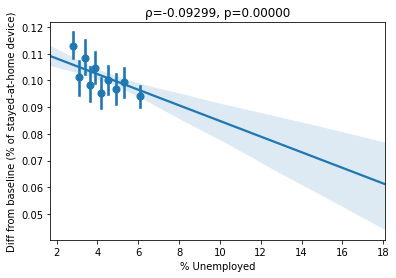

======= % Children in Poverty
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.44122, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.49557, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.53841, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.58513, 0.00000 SIGNIFICANT


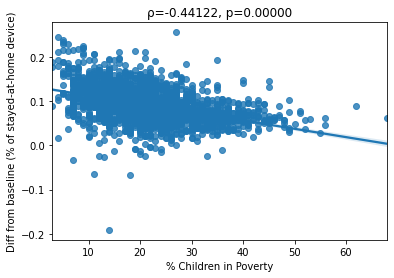

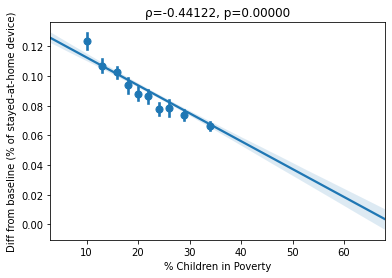

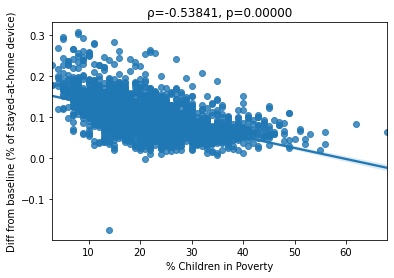

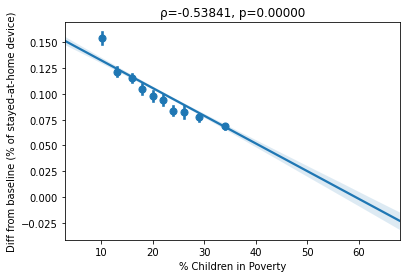

======= % Single-Parent Households
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.26825, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.26191, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.30431, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.28079, 0.00000 SIGNIFICANT


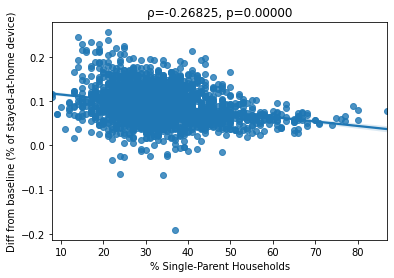

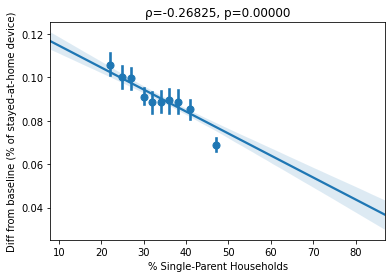

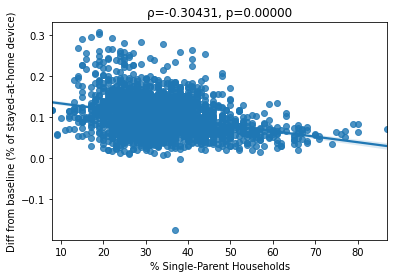

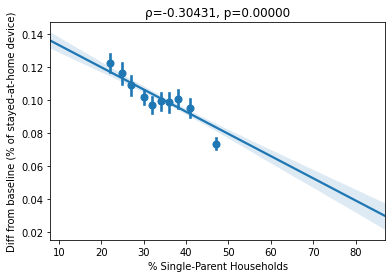

======= Social Association Rate
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.03380, 0.09410 
Since COVID19 (03/15), spearmanr 0.05862, 0.00367 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.02969, 0.14141 
Since shelter in place (04/01), spearmanr -0.00986, 0.62519 


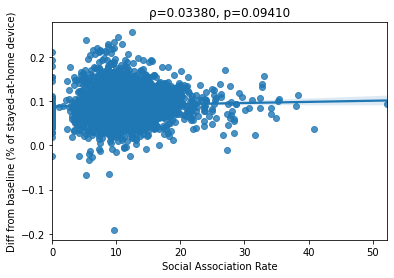

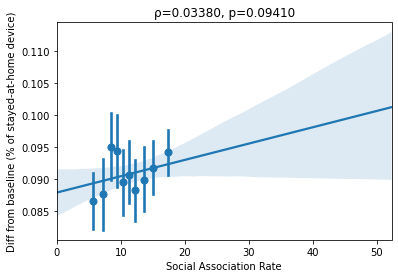

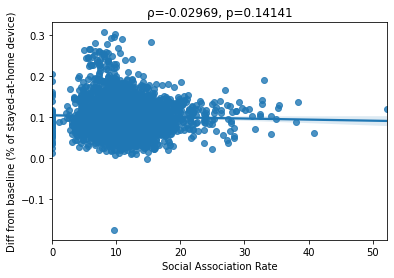

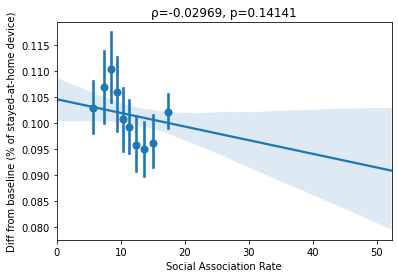

======= % Severe Housing Problems
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.03156, 0.11801 
Since COVID19 (03/15), spearmanr -0.08107, 0.00006 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.12370, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.02178, 0.28068 


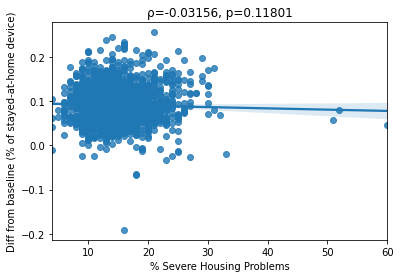

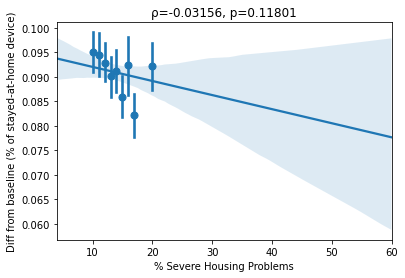

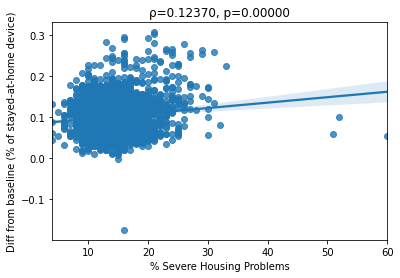

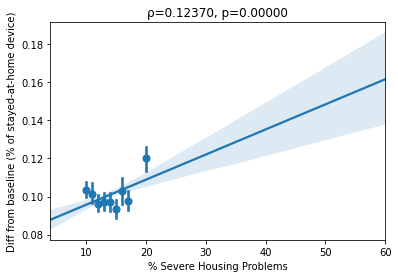

======= % Frequent Physical Distress
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.37496, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.43498, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.50197, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.54495, 0.00000 SIGNIFICANT


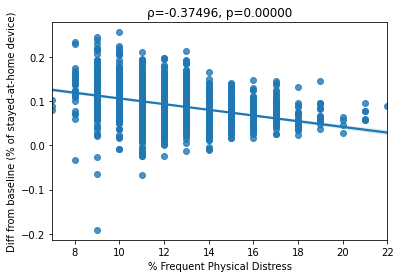

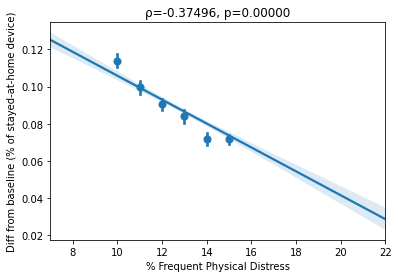

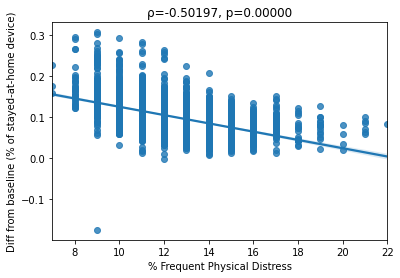

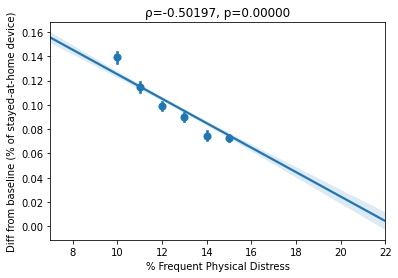

======= % Frequent Mental Distress
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.32760, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.36858, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.45667, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.47646, 0.00000 SIGNIFICANT


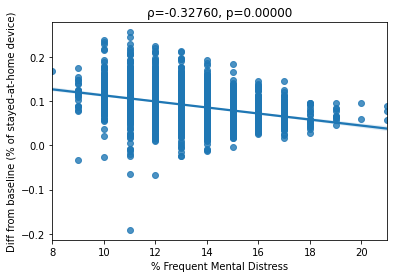

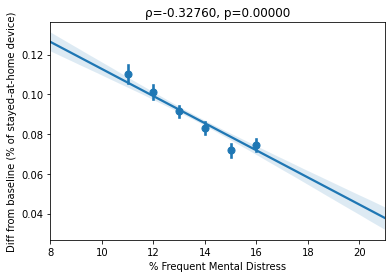

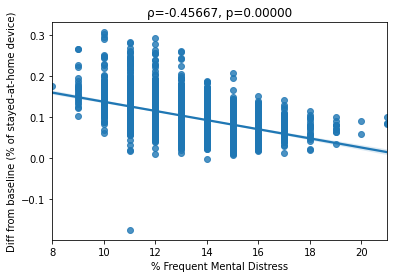

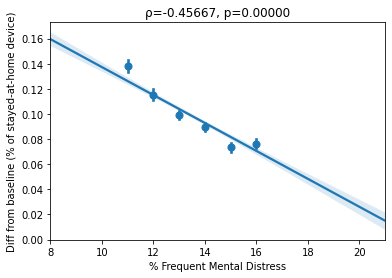

======= % Adults with Diabetes
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.25260, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.27996, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.38803, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.41680, 0.00000 SIGNIFICANT


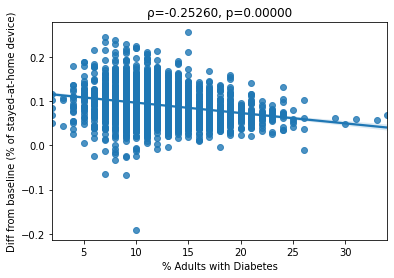

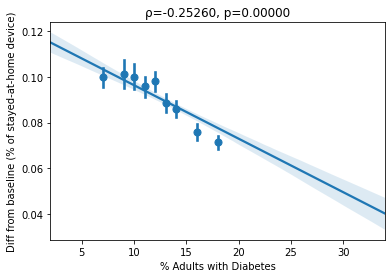

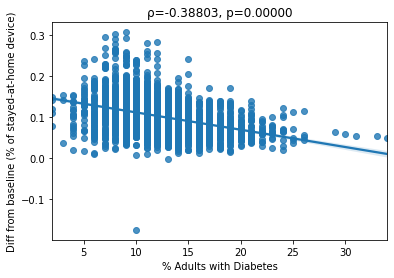

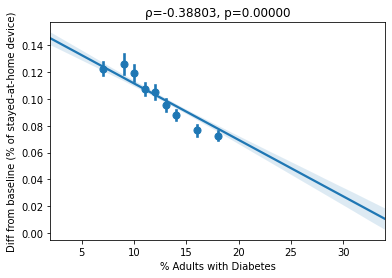

======= % Food Insecure
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.39940, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.45263, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.48093, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.52341, 0.00000 SIGNIFICANT


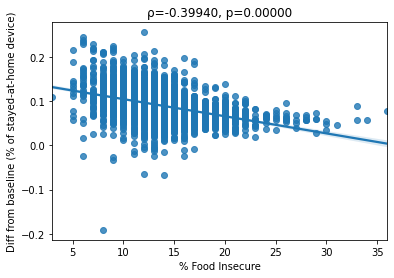

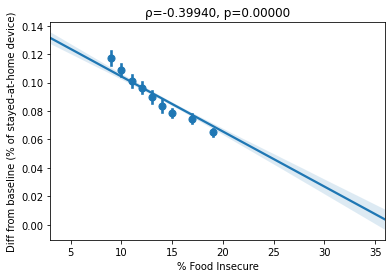

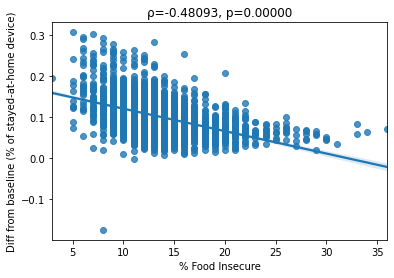

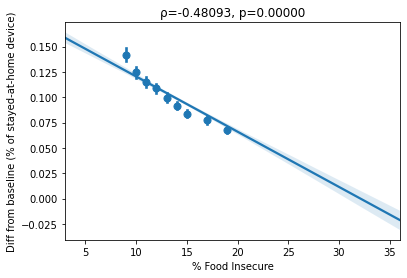

======= % Insufficient Sleep
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.15217, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.18333, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.20028, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.23523, 0.00000 SIGNIFICANT


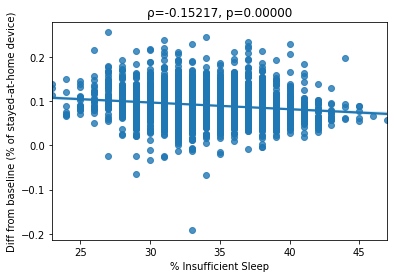

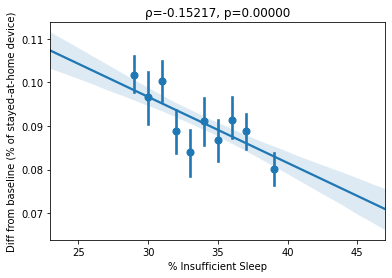

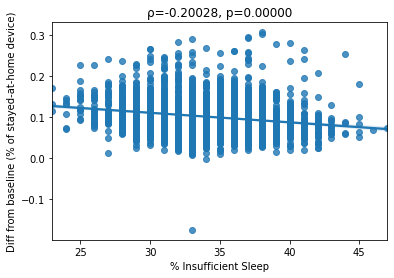

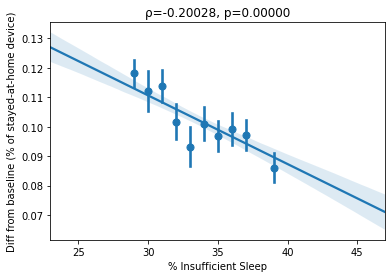

======= % Uninsured_y
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.49981, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.60937, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.54844, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.66096, 0.00000 SIGNIFICANT


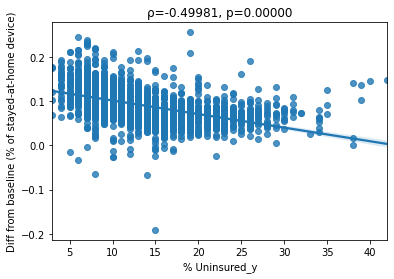

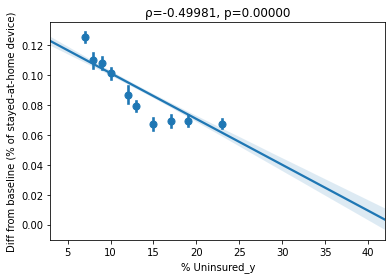

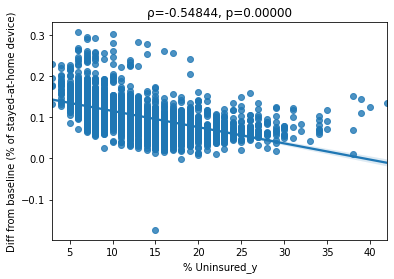

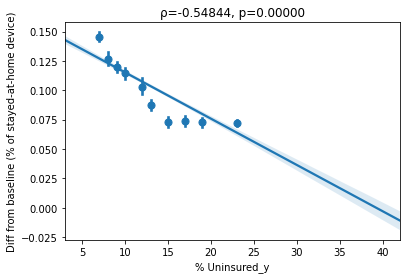

======= % Uninsured.1
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.31555, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.40592, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.35562, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.45547, 0.00000 SIGNIFICANT


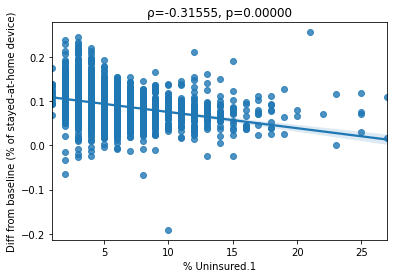

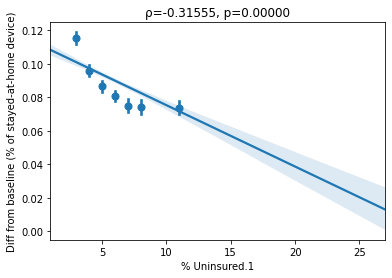

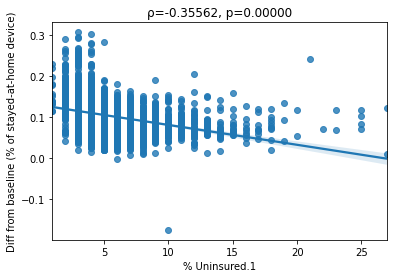

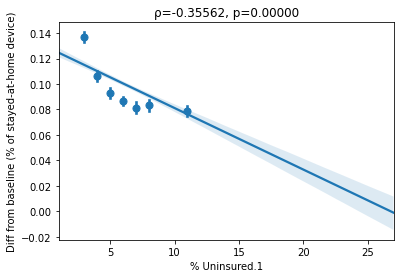

======= Median Household Income
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.41200, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.47728, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.62678, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.60804, 0.00000 SIGNIFICANT


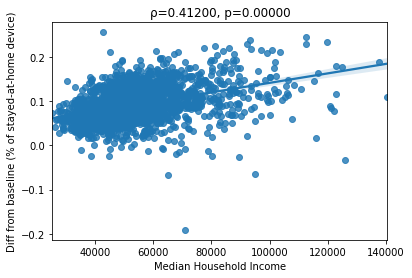

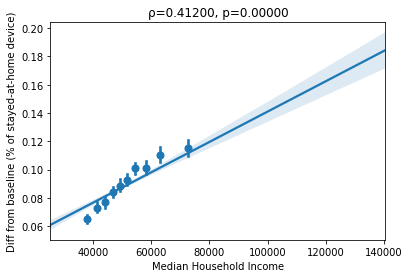

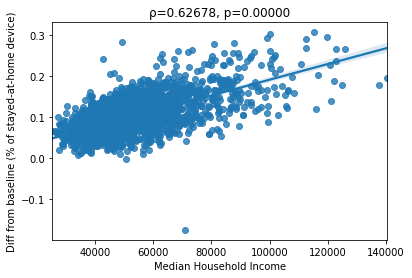

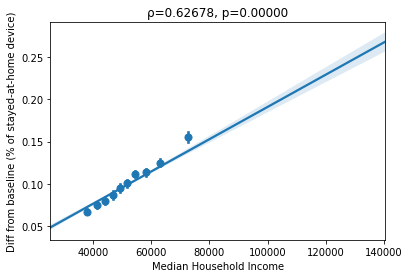

======= Average Traffic Volume per Meter of Major Roadways
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.09735, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.28351, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.43130, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.43433, 0.00000 SIGNIFICANT


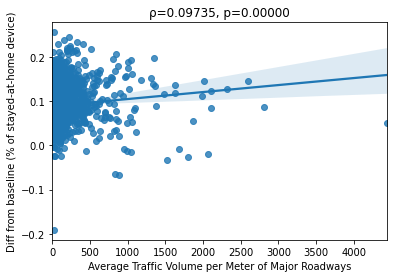

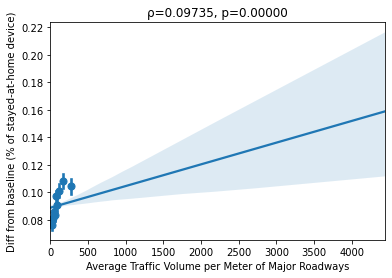

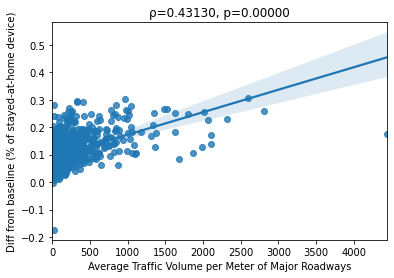

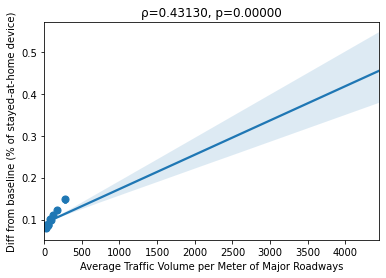

======= % Homeowners
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.10220, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.09805, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.04680, 0.02039 
Since shelter in place (04/01), spearmanr 0.00320, 0.87424 


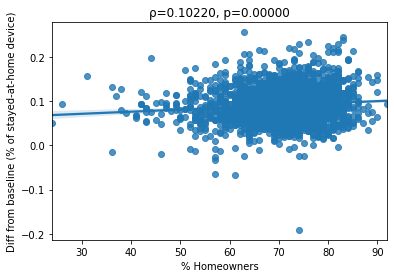

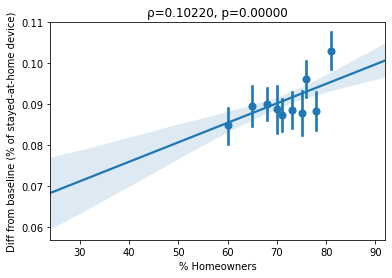

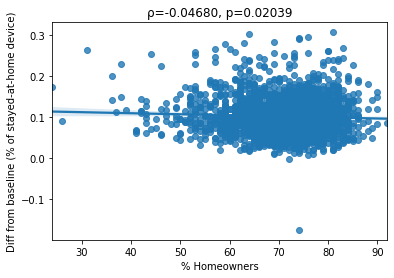

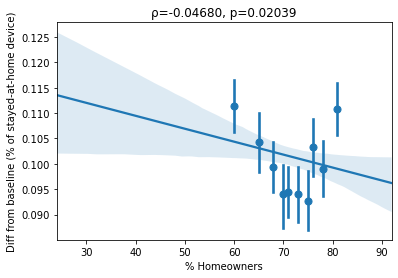

======= % less than 18 years of age
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.04610, 0.02237 
Since COVID19 (03/15), spearmanr -0.06433, 0.00143 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.05921, 0.00334 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.08518, 0.00002 SIGNIFICANT


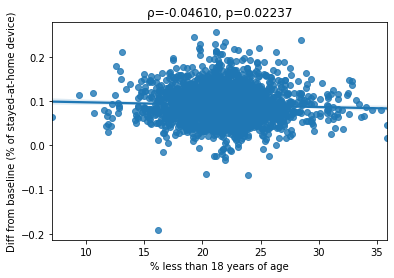

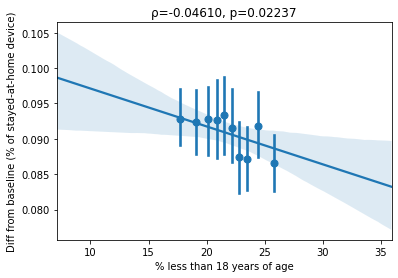

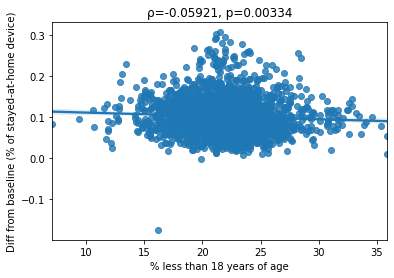

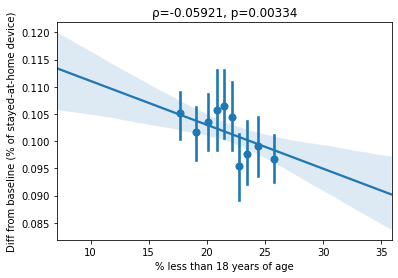

======= % 65 and over
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.05845, 0.00377 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.05109, 0.01134 
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.13350, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.12036, 0.00000 SIGNIFICANT


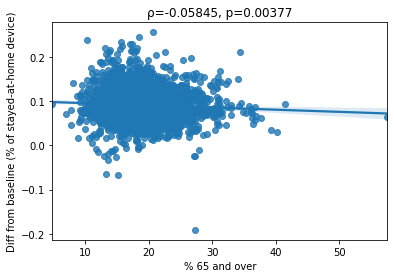

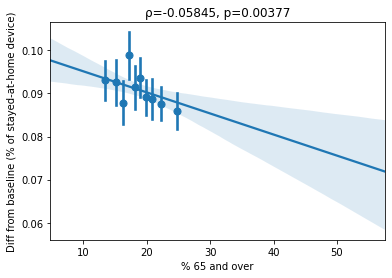

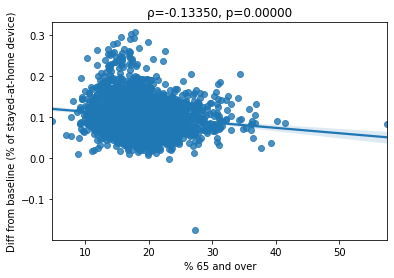

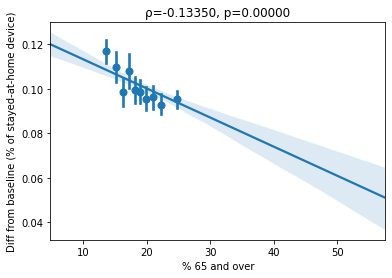

======= % Black
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.27386, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.26999, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.26891, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.24023, 0.00000 SIGNIFICANT


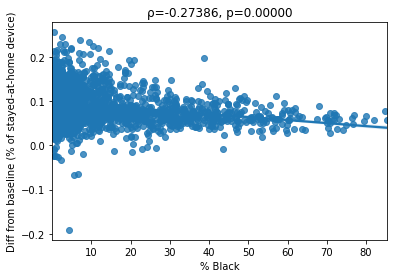

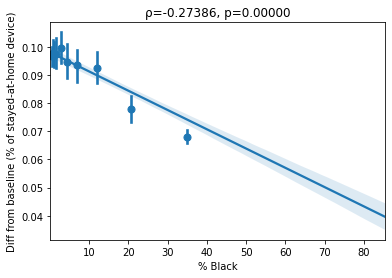

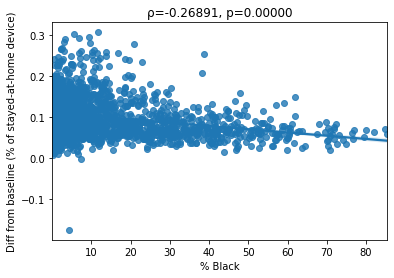

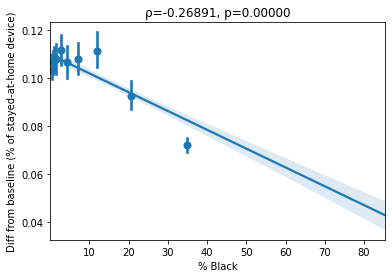

======= % American Indian & Alaska Native
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.03447, 0.08769 
Since COVID19 (03/15), spearmanr -0.09442, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.03776, 0.06137 
Since shelter in place (04/01), spearmanr -0.05030, 0.01269 


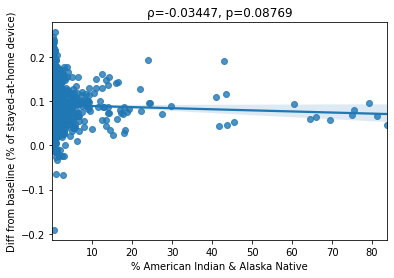

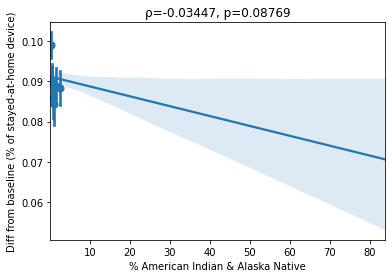

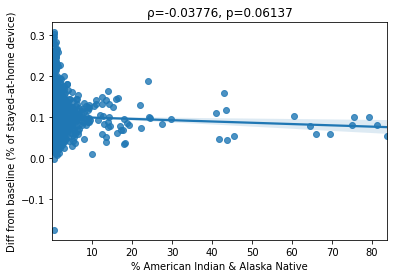

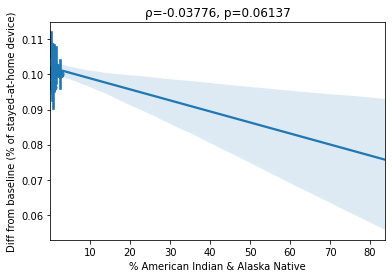

======= % Asian
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.13180, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.23968, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.46154, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.40936, 0.00000 SIGNIFICANT


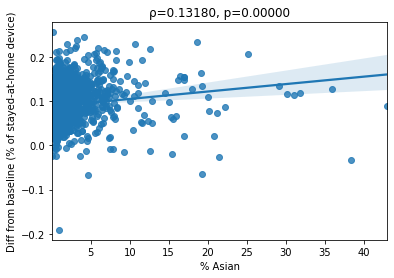

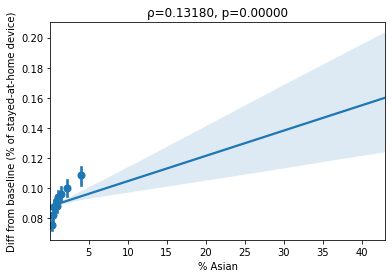

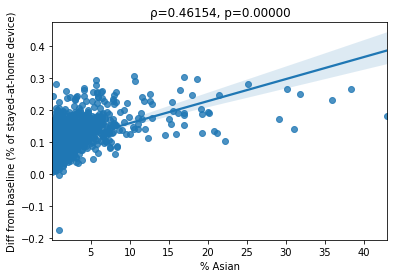

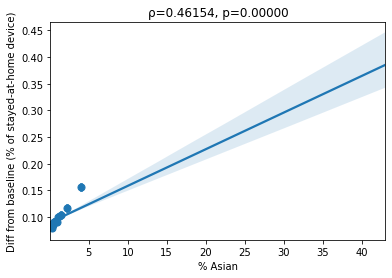

======= % Native Hawaiian/Other Pacific Islander
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.00896, 0.65727 
Since COVID19 (03/15), spearmanr -0.04701, 0.01985 
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.06983, 0.00054 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.03373, 0.09473 


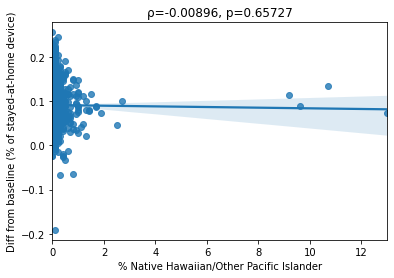

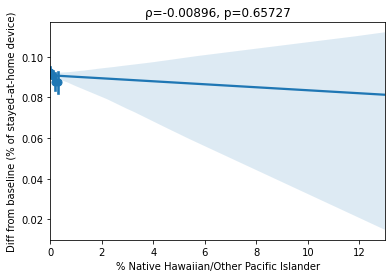

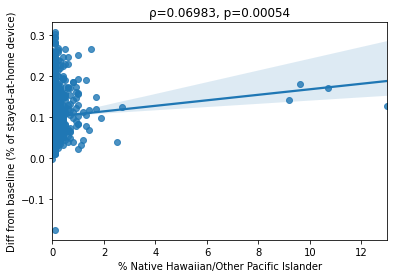

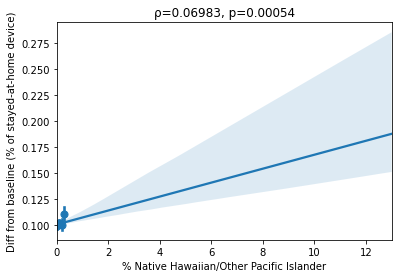

======= % Hispanic
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.05927, 0.00331 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.03657, 0.07001 
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.04082, 0.04314 
Since shelter in place (04/01), spearmanr 0.08466, 0.00003 SIGNIFICANT


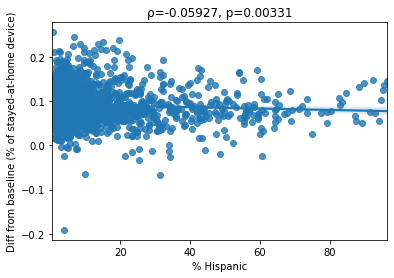

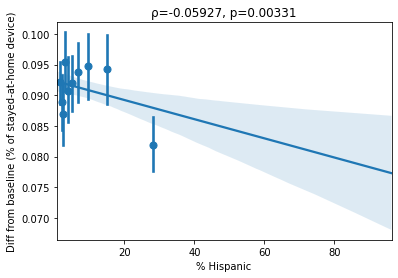

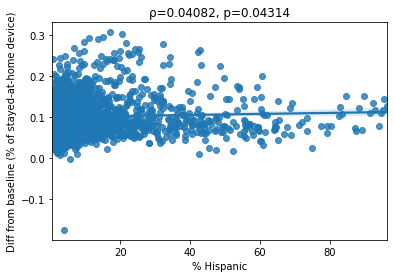

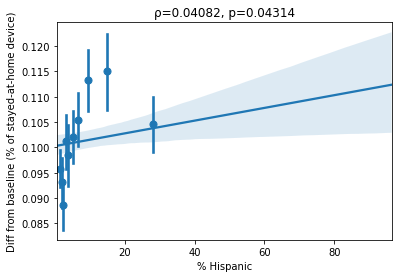

======= % Non-Hispanic White
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.23056, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.26082, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.10437, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.16652, 0.00000 SIGNIFICANT


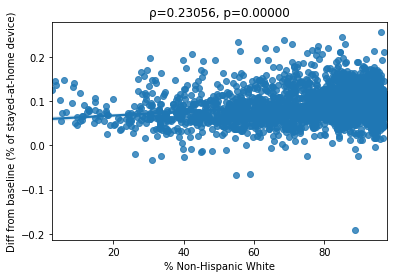

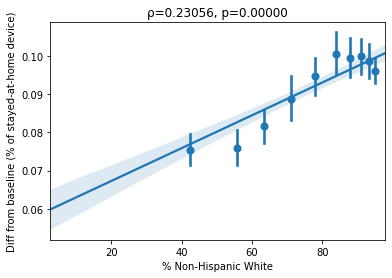

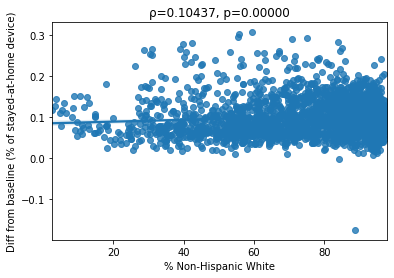

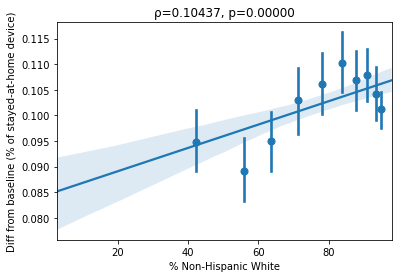

======= % Not Proficient in English
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.02389, 0.23673 
Since COVID19 (03/15), spearmanr -0.03302, 0.10187 
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.13821, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.10088, 0.00000 SIGNIFICANT


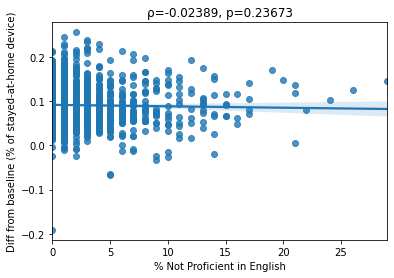

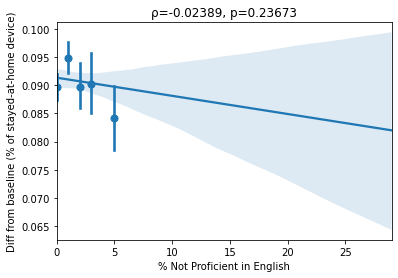

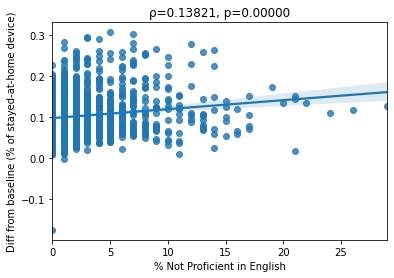

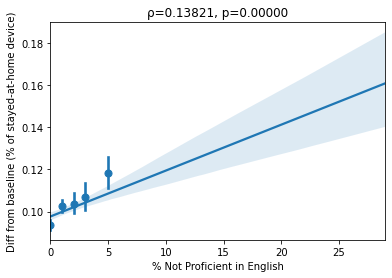

======= % Female
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.02476, 0.22009 
Since COVID19 (03/15), spearmanr -0.10039, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.06386, 0.00155 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.06118, 0.00243 SIGNIFICANT


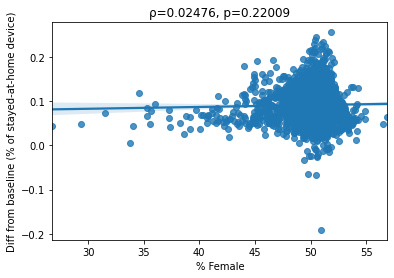

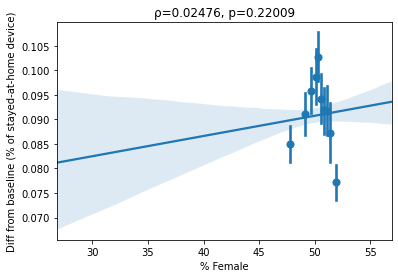

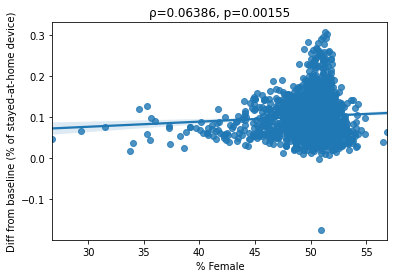

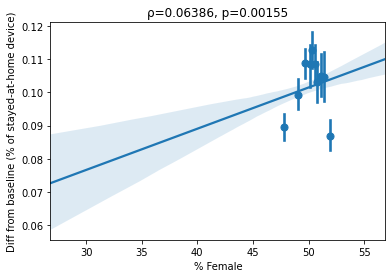

======= political_diff
Since COVID19 (03/15), normality 141.52900, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.17176, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.23426, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.49648, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.37657, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.39089, 0.00000 SIGNIFICANT


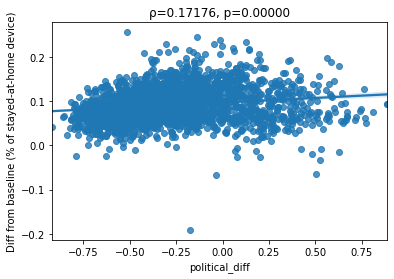

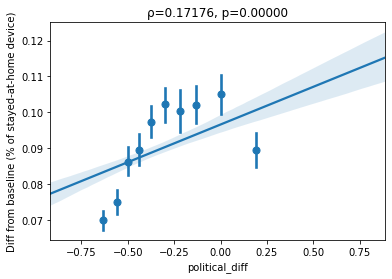

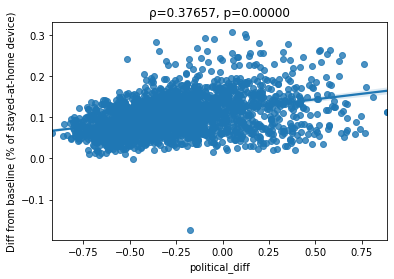

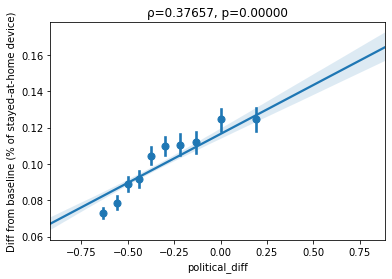

======= % Drive Alone to Work
Since COVID19 (03/15), normality 141.28451, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.04721, 0.01934 
Since COVID19 (03/15), spearmanr -0.07463, 0.00022 SIGNIFICANT
Since shelter in place (04/01), normality 315.01360, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.19945, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.20120, 0.00000 SIGNIFICANT


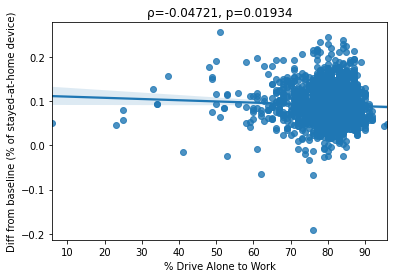

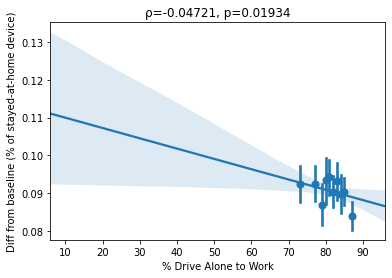

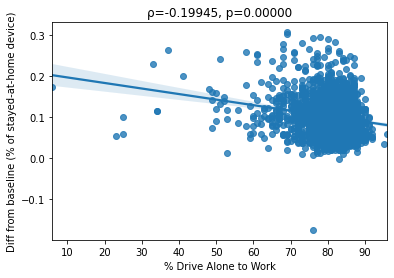

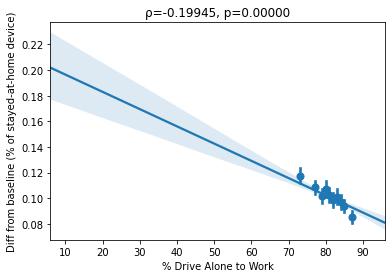

======= % Long Commute - Drives Alone
Since COVID19 (03/15), normality 141.28451, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.05100, 0.01152 
Since COVID19 (03/15), spearmanr -0.07320, 0.00028 SIGNIFICANT
Since shelter in place (04/01), normality 315.01360, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.01014, 0.61574 
Since shelter in place (04/01), spearmanr -0.04440, 0.02783 


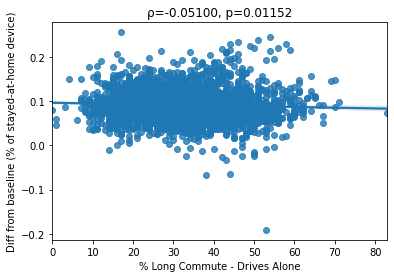

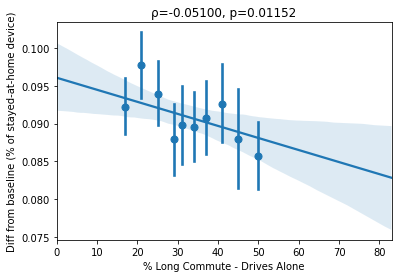

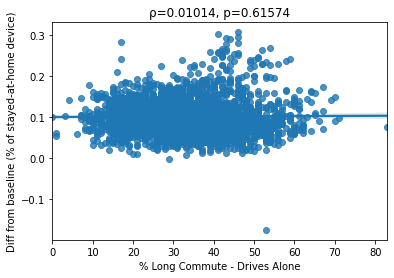

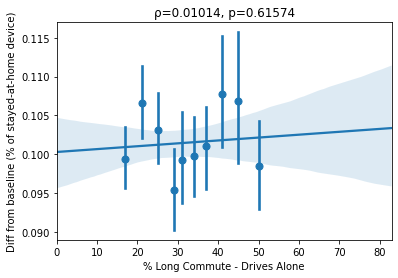

======= % Severe Housing Cost Burden
Since COVID19 (03/15), normality 141.28451, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.00539, 0.78963 
Since COVID19 (03/15), spearmanr -0.01310, 0.51645 
Since shelter in place (04/01), normality 315.01360, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.16909, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.09680, 0.00000 SIGNIFICANT


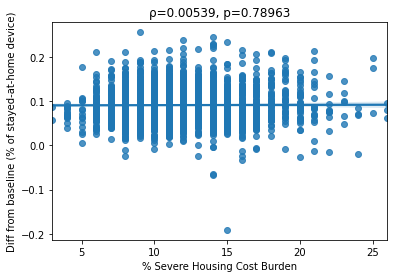

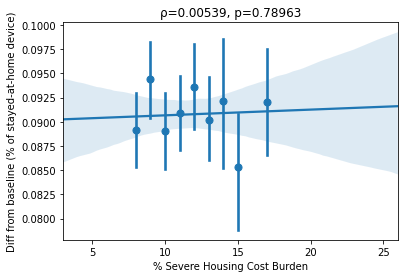

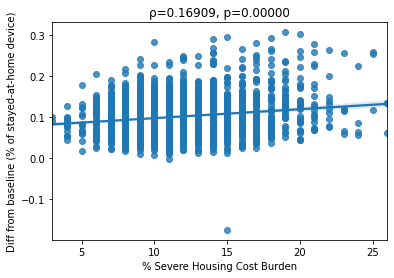

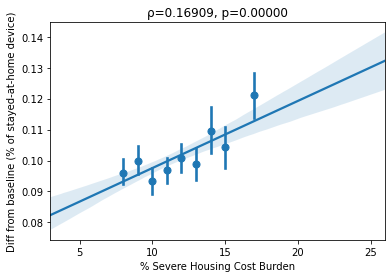

======= Income Ratio
Since COVID19 (03/15), normality 141.23870, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.21980, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.26792, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 315.98510, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.18242, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.26496, 0.00000 SIGNIFICANT


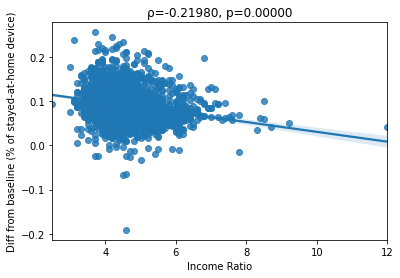

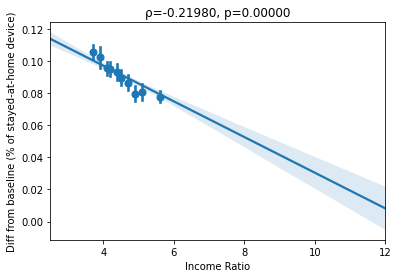

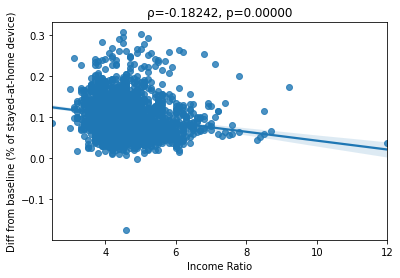

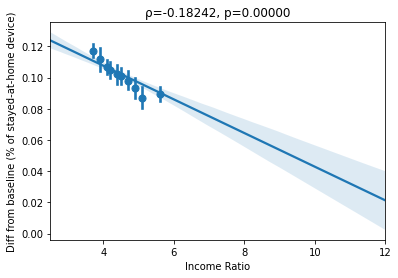

======= Food Environment Index
Since COVID19 (03/15), normality 140.81816, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.35027, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.40551, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 314.38894, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.42584, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.46838, 0.00000 SIGNIFICANT


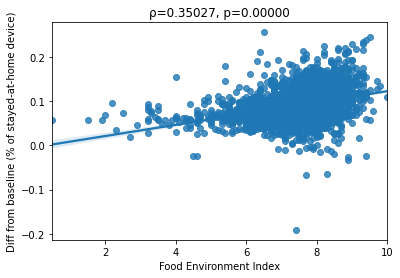

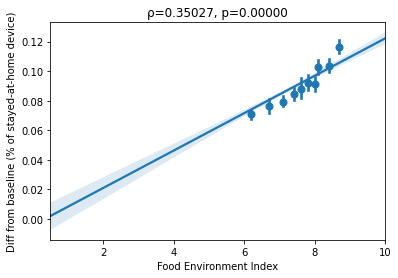

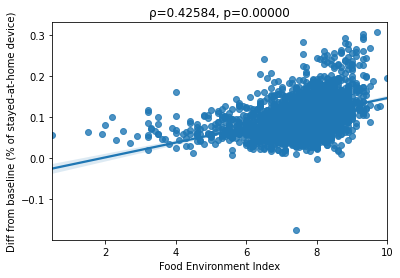

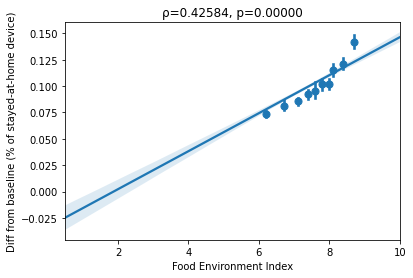

======= % Limited Access to Healthy Foods
Since COVID19 (03/15), normality 140.81816, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.12913, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.11438, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 314.38894, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.16298, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.13852, 0.00000 SIGNIFICANT


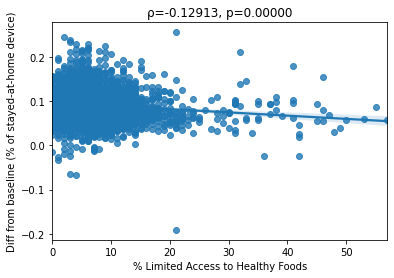

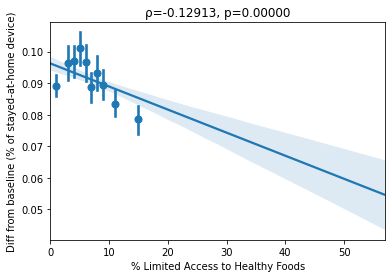

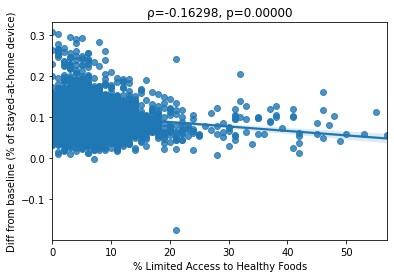

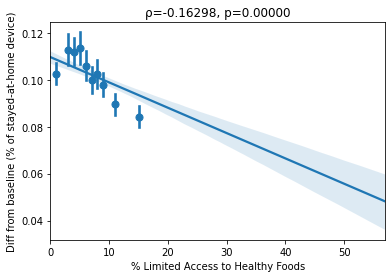

======= Average Daily PM2.5
Since COVID19 (03/15), normality 140.50205, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.02859, 0.15823 
Since COVID19 (03/15), spearmanr 0.00844, 0.67701 
Since shelter in place (04/01), normality 316.72313, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.00176, 0.93082 
Since shelter in place (04/01), spearmanr -0.04748, 0.01907 


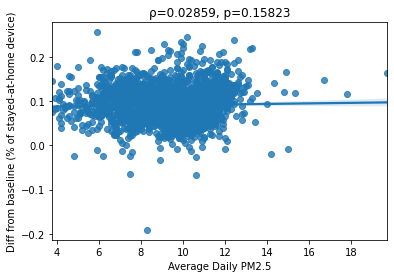

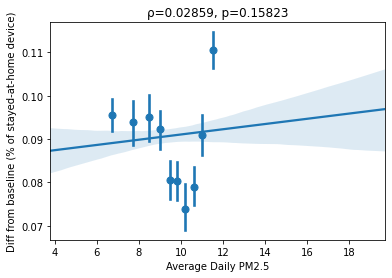

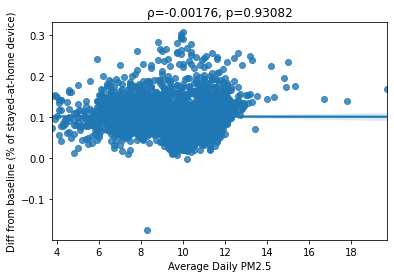

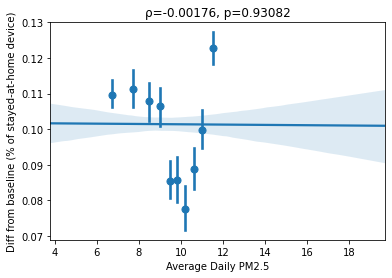

======= High School Graduation Rate
Since COVID19 (03/15), normality 138.93875, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.02393, 0.23764 
Since COVID19 (03/15), spearmanr 0.01115, 0.58214 
Since shelter in place (04/01), normality 314.20058, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.03634, 0.07280 
Since shelter in place (04/01), spearmanr -0.07106, 0.00045 SIGNIFICANT


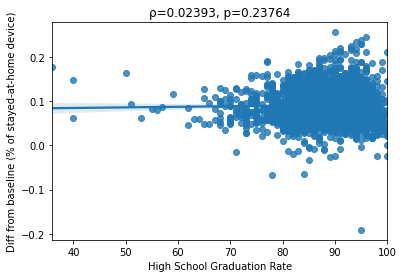

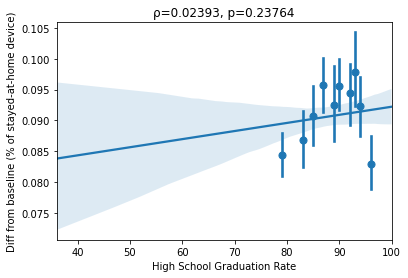

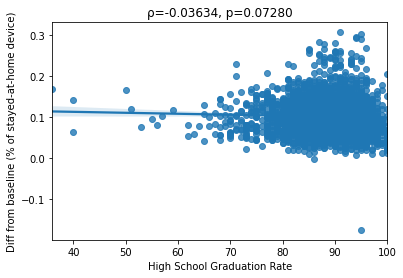

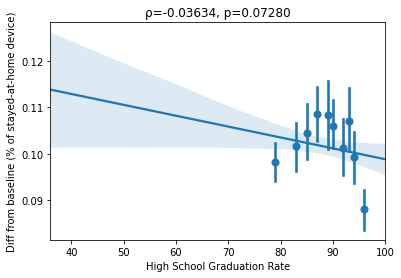

======= Primary Care Physicians Rate
Since COVID19 (03/15), normality 137.65153, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.18584, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.22543, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 297.24141, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.34258, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.36137, 0.00000 SIGNIFICANT


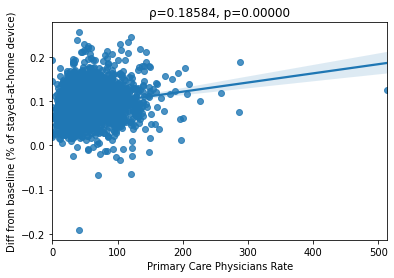

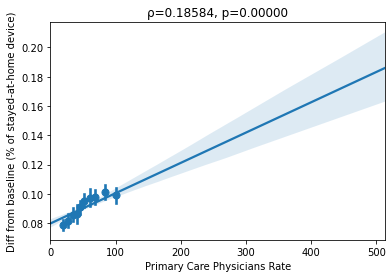

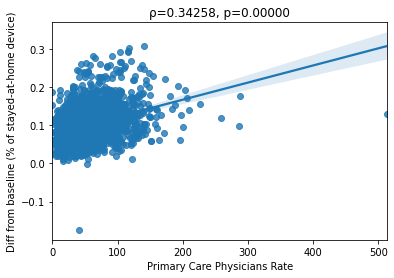

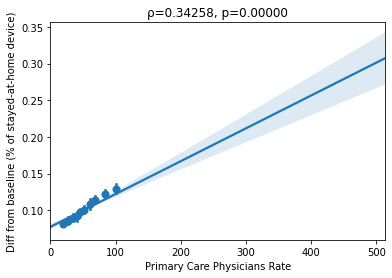

======= Dentist Rate
Since COVID19 (03/15), normality 137.01292, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.21506, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.30546, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 305.47949, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.38200, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.45113, 0.00000 SIGNIFICANT


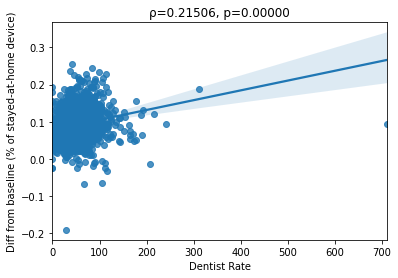

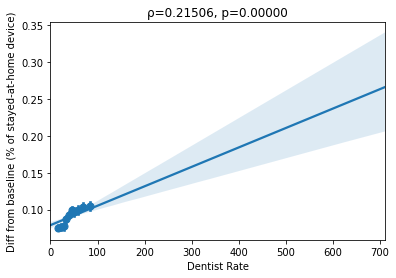

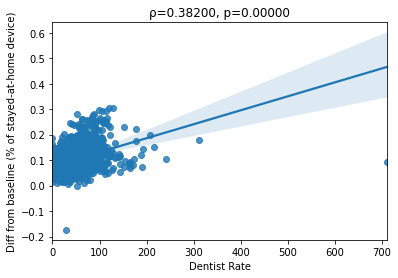

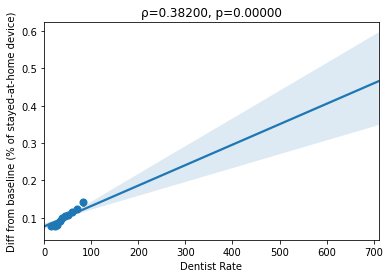

======= Teen Birth Rate
Since COVID19 (03/15), normality 136.52447, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.43119, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.47871, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 317.12586, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.56273, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.60858, 0.00000 SIGNIFICANT


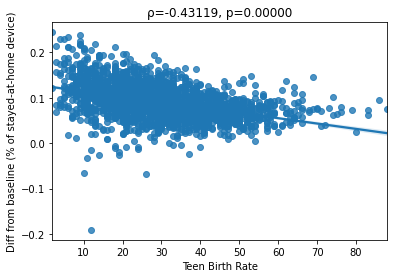

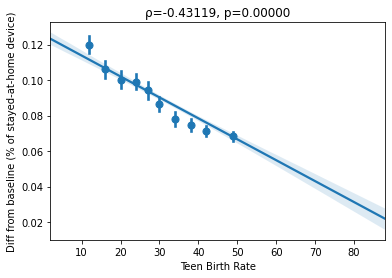

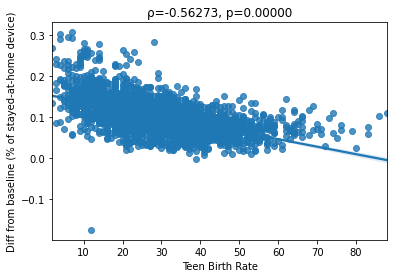

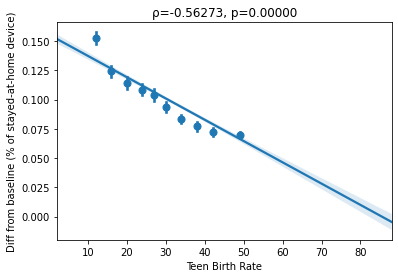

======= Injury Death Rate
Since COVID19 (03/15), normality 134.01308, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.24996, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.27442, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 312.23654, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.36150, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.36956, 0.00000 SIGNIFICANT


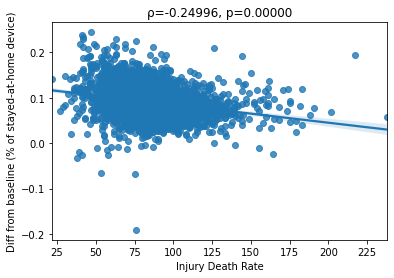

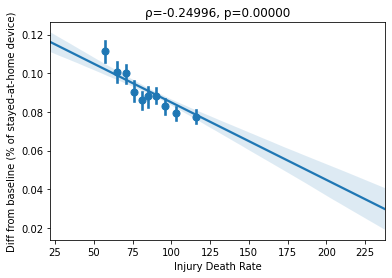

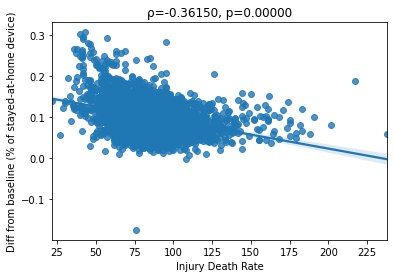

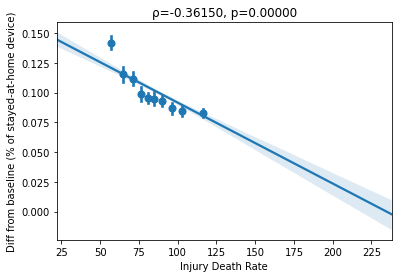

======= Segregation Index
Since COVID19 (03/15), normality 133.92589, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.13877, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.15657, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 299.54054, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.19080, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.20306, 0.00000 SIGNIFICANT


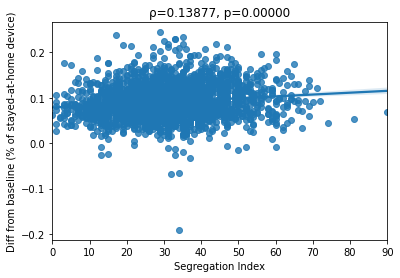

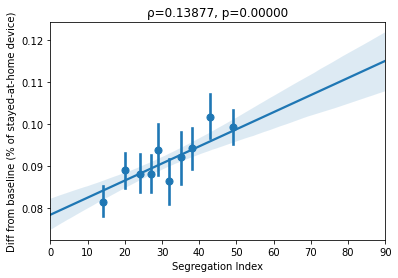

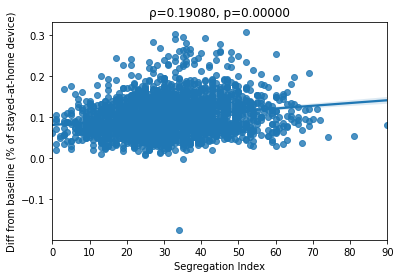

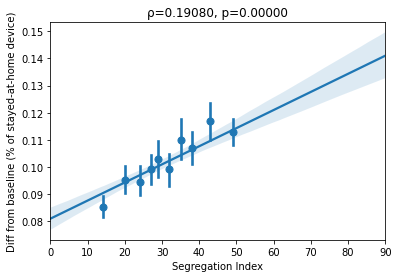

======= Age-Adjusted Death Rate
Since COVID19 (03/15), normality 133.58984, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.39981, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.46886, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 313.96087, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.56163, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.61431, 0.00000 SIGNIFICANT


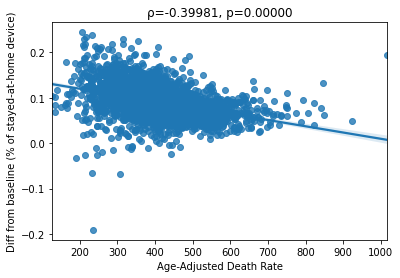

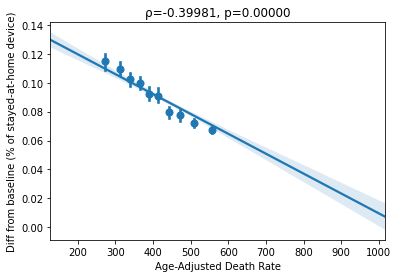

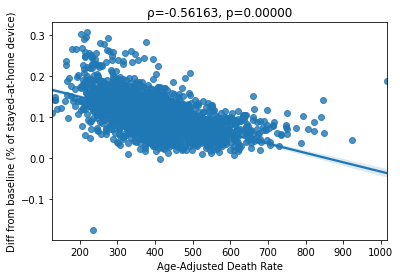

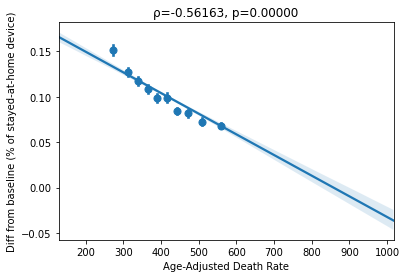

======= Chlamydia Rate
Since COVID19 (03/15), normality 133.09327, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.19870, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.22339, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 311.17134, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.14307, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.16719, 0.00000 SIGNIFICANT


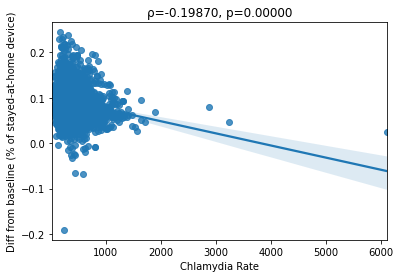

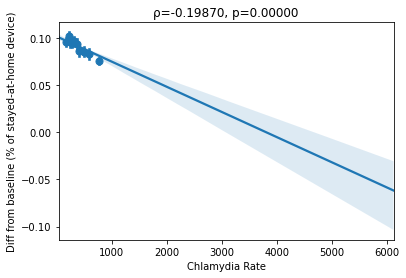

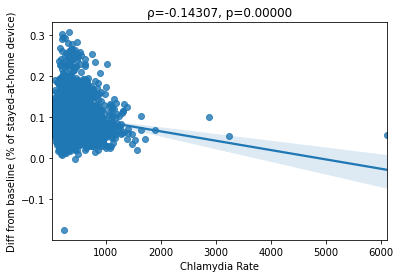

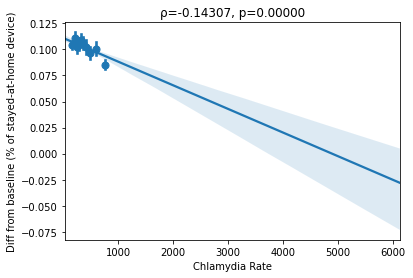

======= Violent Crime Rate
Since COVID19 (03/15), normality 130.82101, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.18405, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.21559, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 297.62667, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.12825, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.16890, 0.00000 SIGNIFICANT


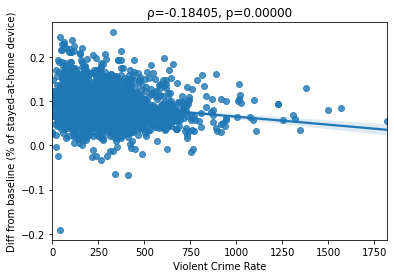

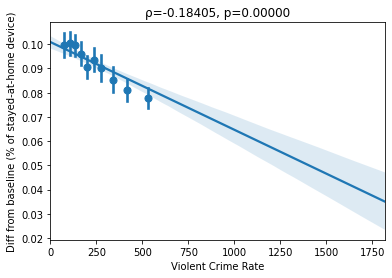

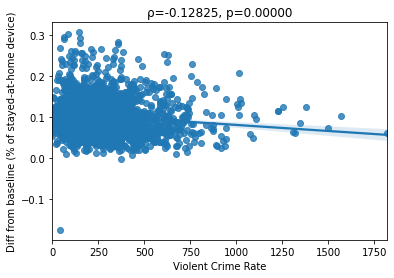

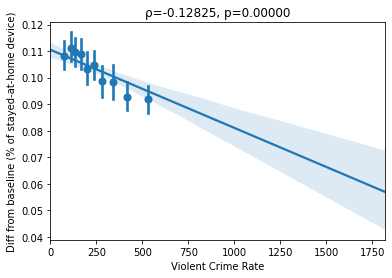

======= Mental Health Provider Rate
Since COVID19 (03/15), normality 130.17713, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.16307, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.31071, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 297.41538, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.28981, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.44437, 0.00000 SIGNIFICANT


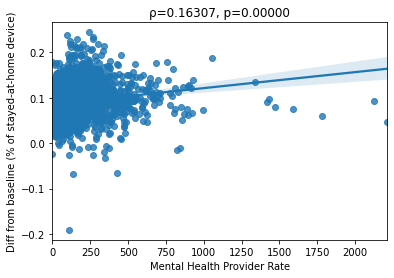

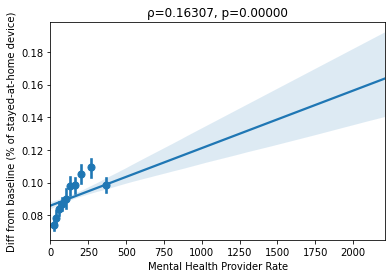

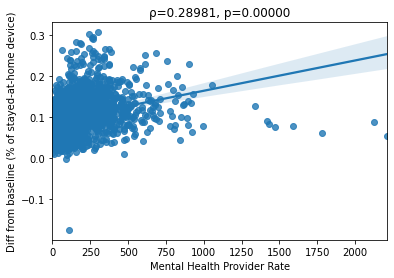

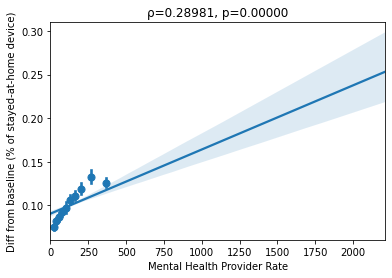

======= % Enrolled in Free or Reduced Lunch
Since COVID19 (03/15), normality 127.46992, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.46829, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.50729, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 286.88493, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.54069, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.57024, 0.00000 SIGNIFICANT


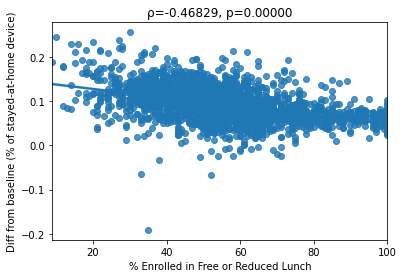

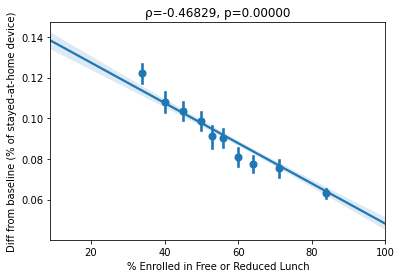

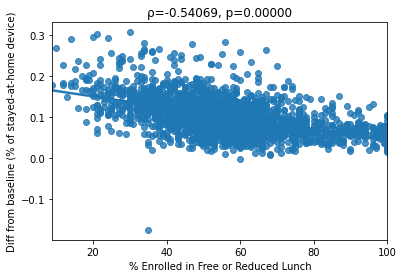

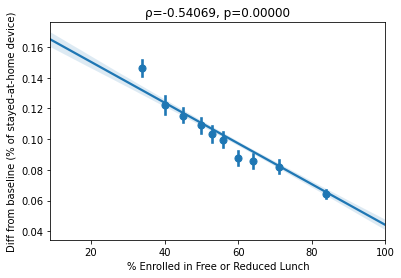

======= Segregation index
Since COVID19 (03/15), normality 127.18024, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.28982, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.34938, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 259.30159, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.34537, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.40405, 0.00000 SIGNIFICANT


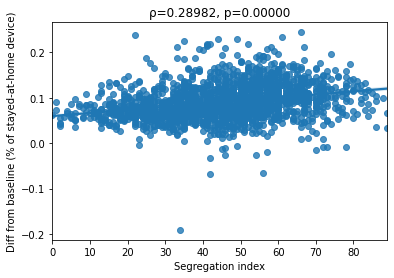

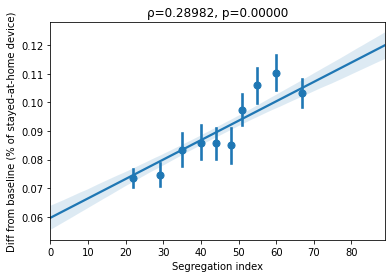

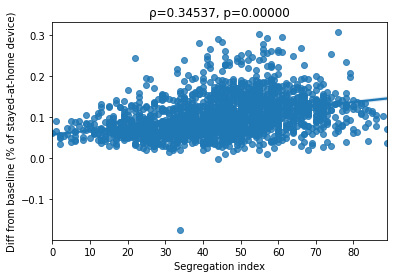

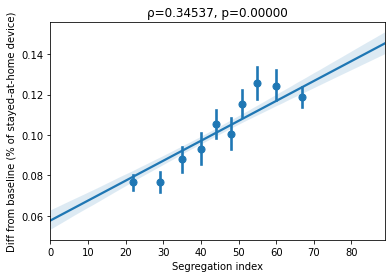

======= Average Grade Performance
Since COVID19 (03/15), normality 113.96339, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.27022, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.28188, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 126.30438, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.30668, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.32011, 0.00000 SIGNIFICANT


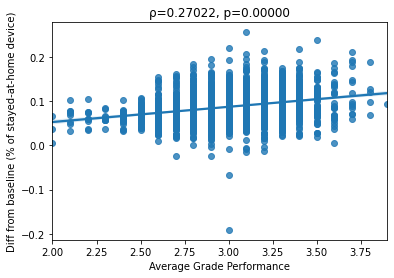

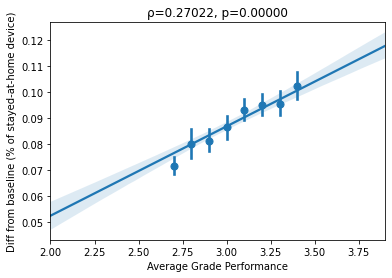

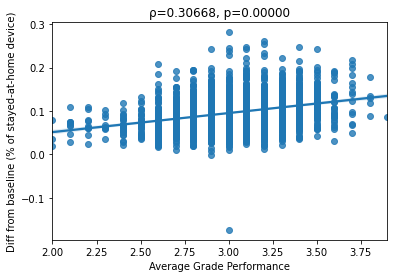

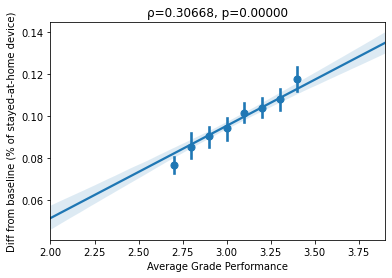

======= Other Primary Care Provider Rate
Since COVID19 (03/15), normality 112.15175, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.02102, 0.29962 
Since COVID19 (03/15), spearmanr 0.04069, 0.04460 
Since shelter in place (04/01), normality 328.67963, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.06763, 0.00083 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.10918, 0.00000 SIGNIFICANT


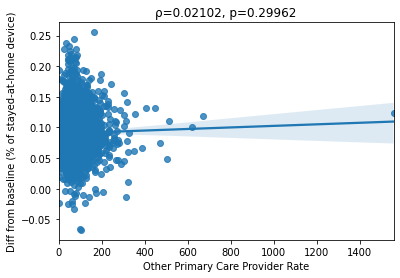

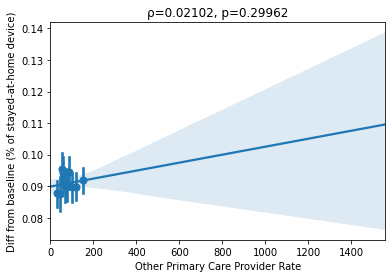

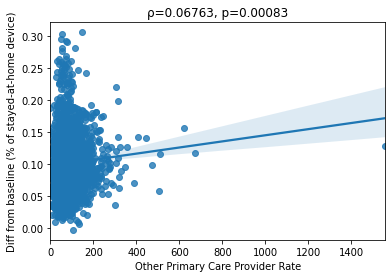

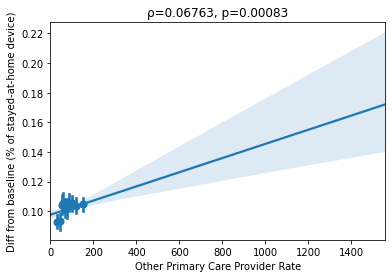

======= Average Grade Performance.1
Since COVID19 (03/15), normality 105.61715, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.22729, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.25420, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 140.78543, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.25001, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr 0.27919, 0.00000 SIGNIFICANT


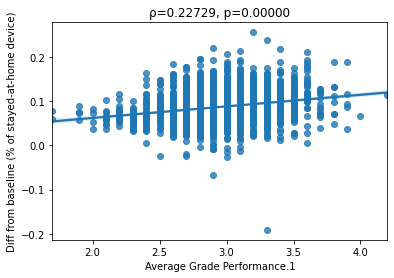

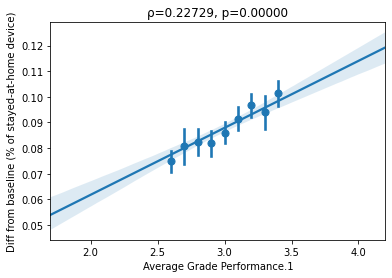

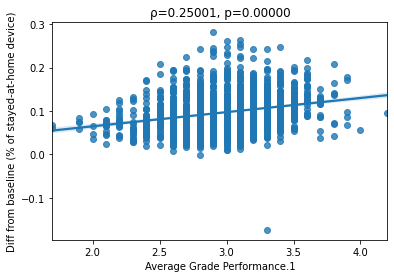

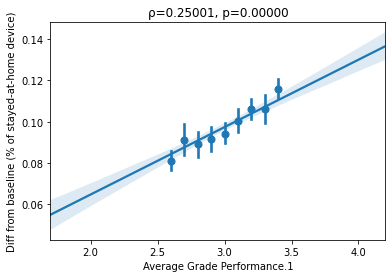

======= Years of Potential Life Lost Rate
Since COVID19 (03/15), normality 104.75148, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.40590, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.46164, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 321.57652, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.55664, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.59872, 0.00000 SIGNIFICANT


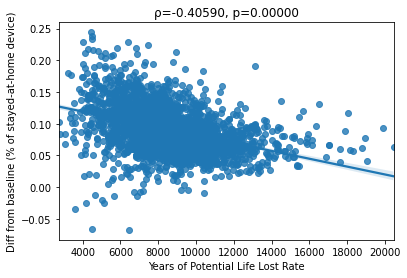

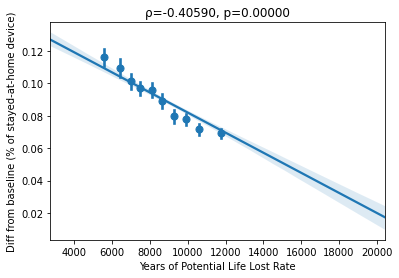

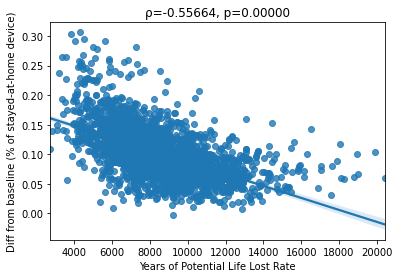

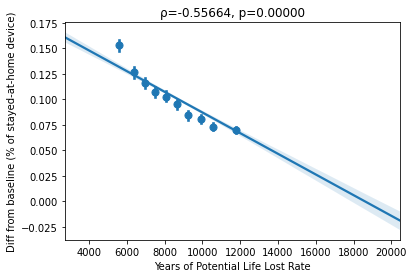

======= Motor Vehicle Mortality Rate
Since COVID19 (03/15), normality 92.51968, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.45454, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.51820, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 308.57063, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.59412, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.67181, 0.00000 SIGNIFICANT


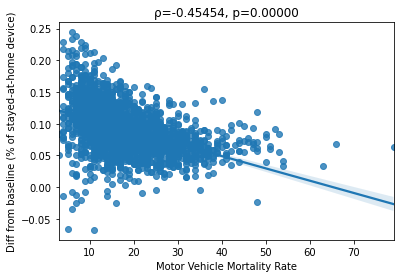

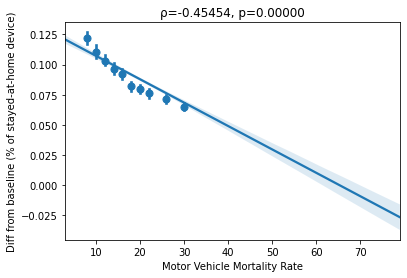

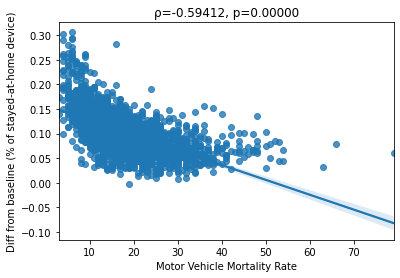

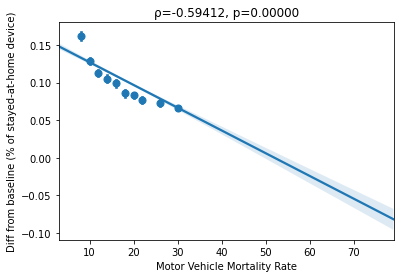

======= HIV Prevalence Rate
Since COVID19 (03/15), normality 92.15355, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.21026, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.28731, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 206.19349, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.07474, 0.00104 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.18110, 0.00000 SIGNIFICANT


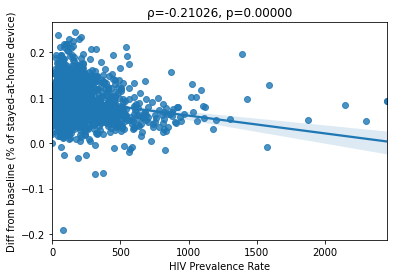

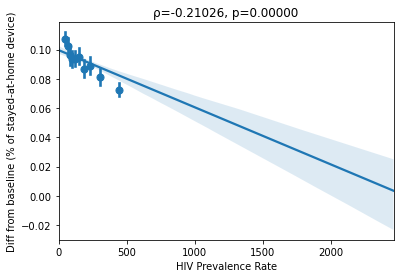

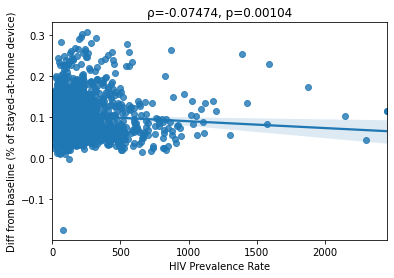

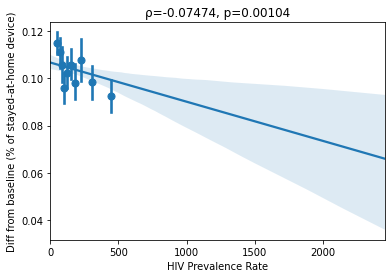

======= Firearm Fatalities Rate
Since COVID19 (03/15), normality 80.30663, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.45515, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.52396, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 263.87226, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.58192, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.64317, 0.00000 SIGNIFICANT


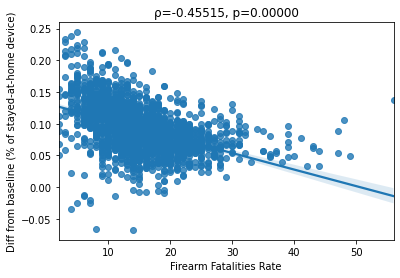

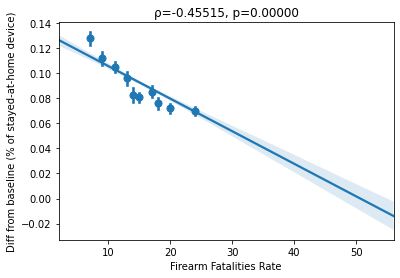

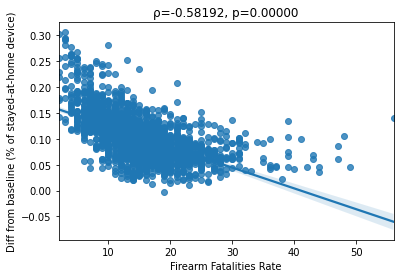

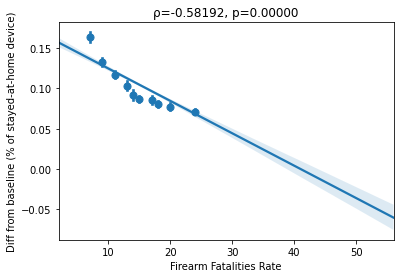

======= Suicide Rate (Age-Adjusted)
Since COVID19 (03/15), normality 73.70530, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.19768, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.20919, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 265.23893, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.31324, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.31737, 0.00000 SIGNIFICANT


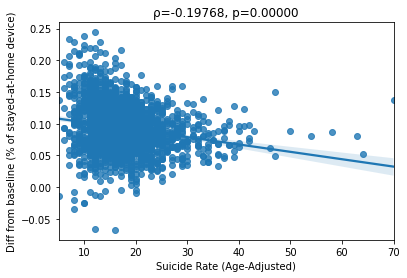

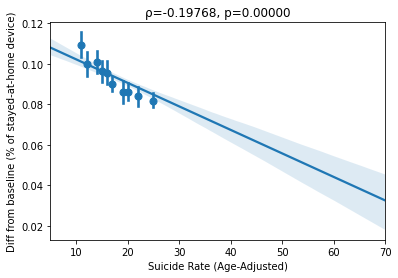

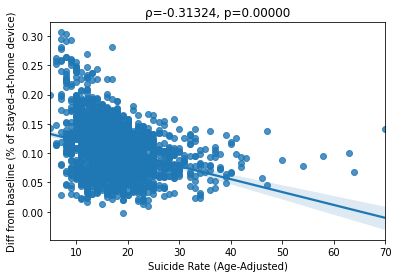

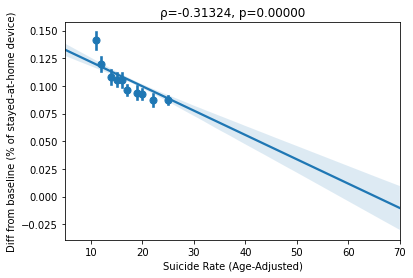

======= Homicide Rate
Since COVID19 (03/15), normality 62.02428, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.34101, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.46685, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 156.30196, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.38924, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.53264, 0.00000 SIGNIFICANT


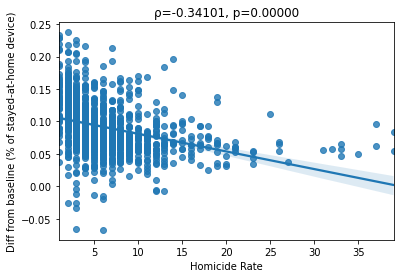

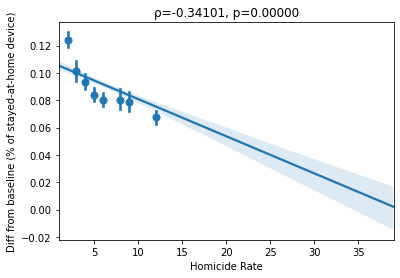

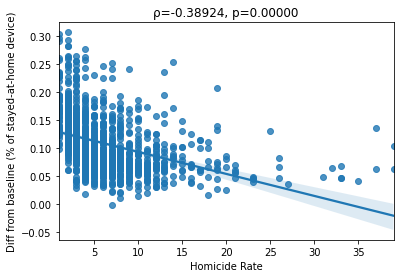

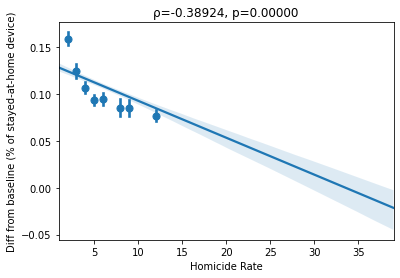

======= Child Mortality Rate
Since COVID19 (03/15), normality 60.64773, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.38852, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.43203, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 210.26799, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.51500, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.55509, 0.00000 SIGNIFICANT


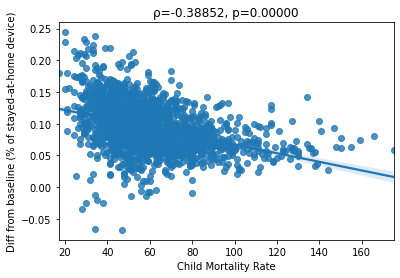

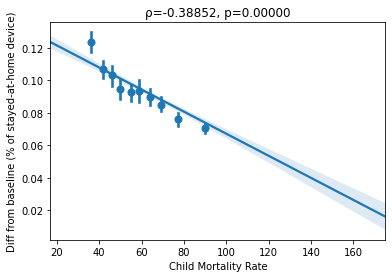

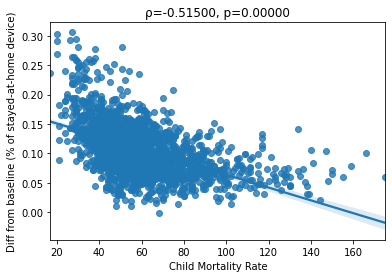

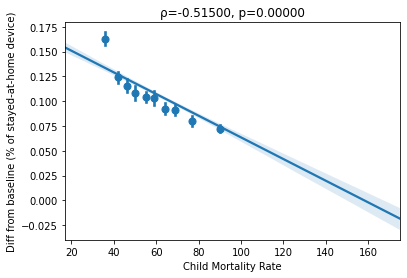

======= Juvenile Arrest Rate
Since COVID19 (03/15), normality 50.94851, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.08326, 0.00062 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.10614, 0.00001 SIGNIFICANT
Since shelter in place (04/01), normality 179.93858, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.16810, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.16119, 0.00000 SIGNIFICANT


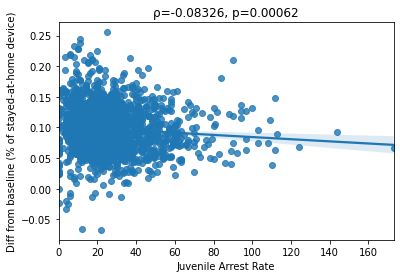

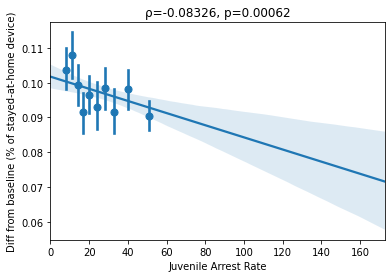

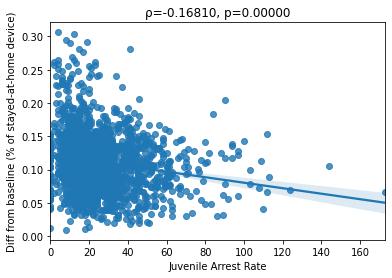

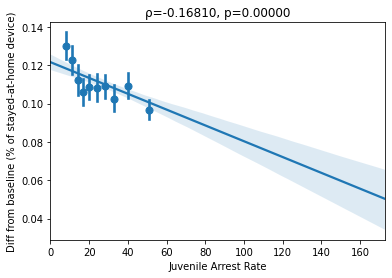

======= Drug Overdose Mortality Rate
Since COVID19 (03/15), normality 40.89822, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr 0.06618, 0.00852 SIGNIFICANT
Since COVID19 (03/15), spearmanr 0.06022, 0.01670 
Since shelter in place (04/01), normality 183.60074, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr 0.02013, 0.42400 
Since shelter in place (04/01), spearmanr 0.02202, 0.38180 


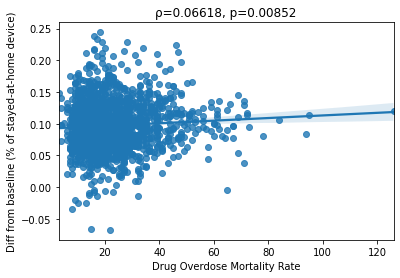

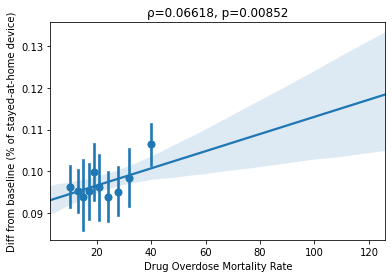

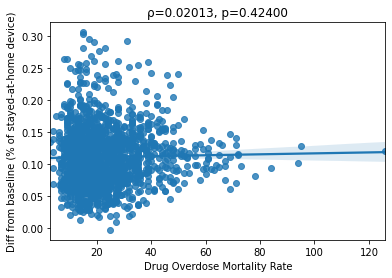

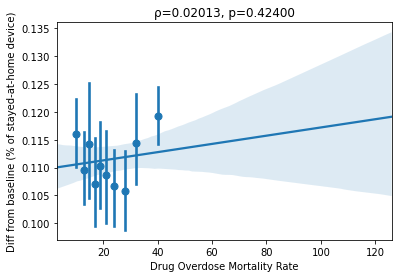

======= % Disconnected Youth
Since COVID19 (03/15), normality 28.38968, 0.00000 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.26954, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.31866, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 138.57041, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.41636, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.49672, 0.00000 SIGNIFICANT


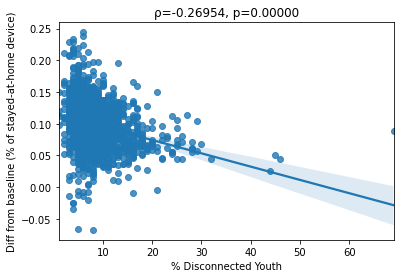

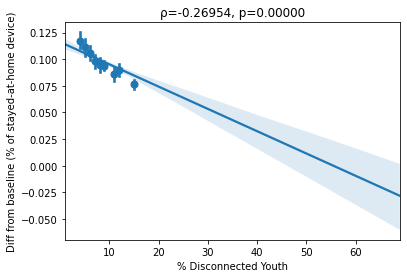

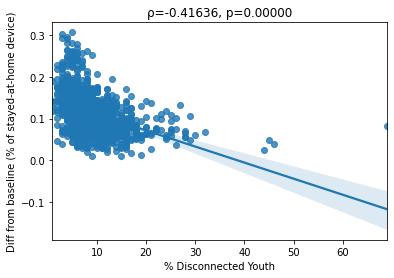

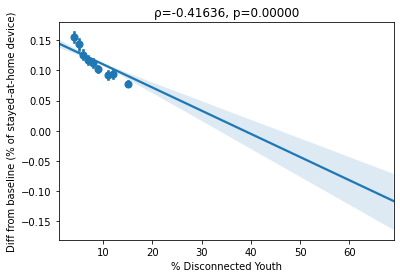

======= Infant Mortality Rate
Since COVID19 (03/15), normality 22.17280, 0.00002 SIGNIFICANT
Since COVID19 (03/15), pearsonr -0.30423, 0.00000 SIGNIFICANT
Since COVID19 (03/15), spearmanr -0.34400, 0.00000 SIGNIFICANT
Since shelter in place (04/01), normality 109.28335, 0.00000 SIGNIFICANT
Since shelter in place (04/01), pearsonr -0.48847, 0.00000 SIGNIFICANT
Since shelter in place (04/01), spearmanr -0.52924, 0.00000 SIGNIFICANT


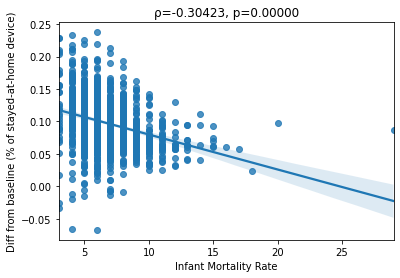

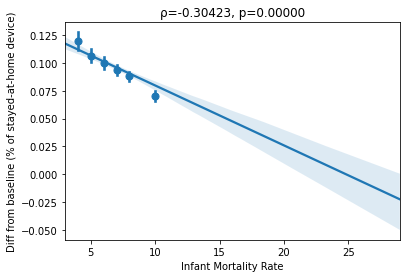

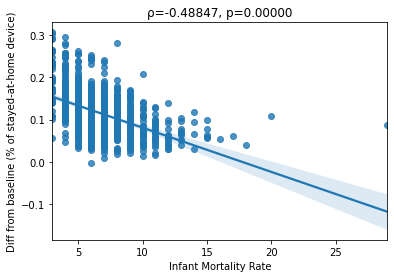

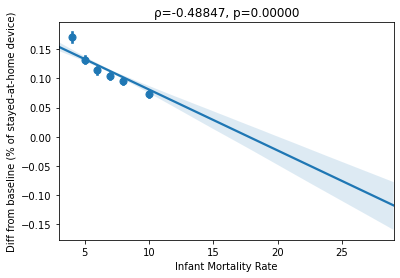

In [ ]:
import scipy
corr_results = []
normality_results = []
for c in corr_columns:
    # df_corr = df_merged[['State Code', 'cnamelong', 'FIPS', 'percent_completely_home_device_after_covid', 'percent_completely_home_device_after_sip', c]]
    df_corr = df_merged[['State Code', 'cnamelong', 'FIPS', 'diff_after_covid', 'diff_after_sip', c]]
    df_corr = df_corr.dropna()
    
    corr_result = [c]

    p_r, p_p = scipy.stats.pearsonr(df_corr[c], df_corr['diff_after_covid'])
    s_r, s_p = scipy.stats.spearmanr(df_corr[c], df_corr['diff_after_covid'])
    k2, n_p = scipy.stats.normaltest(df_corr['diff_after_covid'])
    corr_result.extend([k2, n_p])
    corr_result.extend([p_r, p_p])
    corr_result.extend([s_r, s_p])
    
    p_r, p_p = scipy.stats.pearsonr(df_corr[c], df_corr['diff_after_sip'])
    s_r, s_p = scipy.stats.spearmanr(df_corr[c], df_corr['diff_after_sip'])
    k2, n_p = scipy.stats.normaltest(df_corr['diff_after_sip'])
    corr_result.extend([k2, n_p])
    corr_result.extend([p_r, p_p])
    corr_result.extend([s_r, s_p])
    corr_result.append(df_corr[[c, 'diff_after_covid', 'diff_after_sip']])
    corr_results.append(corr_result)
    
# sorted by normality score k2 from highest to lowest
corr_results = sorted(corr_results, key=lambda x: abs(x[1]), reverse=True)

for i, cr in enumerate(corr_results):    
    print('=======', cr[0])
    print('Since COVID19 (03/15), normality', '%.5f, %.5f'%(cr[1], cr[2]), 'SIGNIFICANT' if cr[2] < 0.01 else '')
    print('Since COVID19 (03/15), pearsonr', '%.5f, %.5f'%(cr[3], cr[4]), 'SIGNIFICANT' if cr[4] < 0.01 else '')
    print('Since COVID19 (03/15), spearmanr', '%.5f, %.5f'%(cr[5], cr[6]), 'SIGNIFICANT' if cr[6] < 0.01 else '')
    print('Since shelter in place (04/01), normality', '%.5f, %.5f'%(cr[7], cr[8]), 'SIGNIFICANT' if cr[8] < 0.01 else '')
    print('Since shelter in place (04/01), pearsonr', '%.5f, %.5f'%(cr[9], cr[10]), 'SIGNIFICANT' if cr[10] < 0.01 else '')
    print('Since shelter in place (04/01), spearmanr', '%.5f, %.5f'%(cr[11], cr[12]), 'SIGNIFICANT' if cr[12] < 0.01 else '')
    sns.regplot(data=cr[13], y='diff_after_covid', x=cr[0])
    plt.title("ρ=%.5f, p=%.5f"%(cr[3], cr[4]))
    plt.ylabel('Diff from baseline (% of stayed-at-home device)')
    plt.show()
    sns.regplot(data=cr[13], y='diff_after_covid', x=cr[0], x_bins=10)
    plt.title("ρ=%.5f, p=%.5f"%(cr[3], cr[4]))
    plt.ylabel('Diff from baseline (% of stayed-at-home device)')
    plt.show()
    sns.regplot(data=cr[13], y='diff_after_sip', x=cr[0])
    plt.title("ρ=%.5f, p=%.5f"%(cr[9], cr[10]))
    plt.ylabel('Diff from baseline (% of stayed-at-home device)')
    plt.show()
    sns.regplot(data=cr[13], y='diff_after_sip', x=cr[0], x_bins=10)
    plt.title("ρ=%.5f, p=%.5f"%(cr[9], cr[10]))
    plt.ylabel('Diff from baseline (% of stayed-at-home device)')
    plt.show()



# 3. analyze with respect to other variables other than % completely at home devices.

In [ ]:
data = pd.read_csv("agg_social_dist")

In [ ]:
def analyzeVariable(columnName):
  after_first_case_data = data[(data['days_since_first_case'] >= 0) & (data['days_since_first_case'] <= 29)]
  after_first_case_data['percent_' + columnName] = after_first_case_data[columnName] / after_first_case_data['device_count']

  before_sip_data = data[(data['days_since_shelter'] >= -30) & (data['days_since_shelter'] <= -1)]
  before_sip_data['percent_' + columnName] = before_sip_data[columnName] / before_sip_data['device_count']

  after_sip_data = data[(data['days_since_shelter'] >= 0) & (data['days_since_shelter'] <= 29)]
  after_sip_data['percent_' + columnName] = after_sip_data[columnName] / after_sip_data['device_count']

  after_first_case_data = after_first_case_data.groupby(['cnamelong','county_code','state','state_code']).agg(
      percent_after_covid = ('percent_' + columnName ,'mean'),
      device_count_after_covid = ('device_count','mean')
  ).reset_index()

  before_sip_data = before_sip_data.groupby(['cnamelong','county_code','state','state_code']).agg(
      percent_before = ('percent_' + columnName ,'mean'),
      device_count_before = ('device_count','mean')
  ).reset_index()

  after_sip_data = after_sip_data.groupby(['cnamelong','county_code','state','state_code']).agg(
      percent_after_sip = ('percent_' + columnName ,'mean'),
      device_count_after_sip = ('device_count','mean')
  ).reset_index()

  merged_data = after_first_case_data.merge(before_sip_data, on=['cnamelong', 'county_code','state','state_code']).merge(after_sip_data, on=['cnamelong', 'county_code','state','state_code'])

  df_sip_county = merged_data

  after_first_case_data = data[(data['days_since_first_case'] >= 0) & (data['days_since_first_case'] <= 29)]
  after_first_case_data['percent_' + columnName] = after_first_case_data[columnName] / after_first_case_data['device_count']

  before_sip_data = data[(data['days_since_shelter'] >= -30) & (data['days_since_shelter'] <= -1)]
  before_sip_data['percent_' + columnName] = before_sip_data[columnName] / before_sip_data['device_count']

  after_sip_data = data[(data['days_since_shelter'] >= 0) & (data['days_since_shelter'] <= 29)]
  after_sip_data['percent_' + columnName] = after_sip_data[columnName] / after_sip_data['device_count']

  after_first_case_data = after_first_case_data.groupby(['state','state_code']).agg(
      percent_after_covid = ('percent_' + columnName ,'mean'),
      device_count_after_covid = ('device_count','mean')
  ).reset_index()

  before_sip_data = before_sip_data.groupby(['state','state_code']).agg(
      percent_before = ('percent_' + columnName ,'mean'),
      device_count_before = ('device_count','mean')
  ).reset_index()

  after_sip_data = after_sip_data.groupby(['state','state_code']).agg(
      percent_after_sip = ('percent_' + columnName ,'mean'),
      device_count_after_sip = ('device_count','mean')
  ).reset_index()

  merged_data = after_first_case_data.merge(before_sip_data, on=['state','state_code']).merge(after_sip_data, on=['state','state_code'])
  df_sip_state = merged_data



  df_chr_1 = pd.read_csv('2020 County Health Rankings Data - Ranked Measure Data.csv')
  df_chr_2 = pd.read_csv('2020 County Health Rankings Data - Additional Measure Data.csv')

  df_sip_county['diff_after_covid'] = df_sip_county.apply(lambda x: x['percent_after_covid'] - x['percent_before'], axis=1)
  df_sip_county['diff_after_sip'] = df_sip_county.apply(lambda x: x['percent_after_sip'] - x['percent_before'], axis=1)

  df_sip_state['diff_after_covid'] = df_sip_state.apply(lambda x: x['percent_after_covid'] - x['percent_before'], axis=1)
  df_sip_state['diff_after_sip'] = df_sip_state.apply(lambda x: x['percent_after_sip'] - x['percent_before'], axis=1)
  df_governors = pd.read_csv('us_states_governors.csv', encoding='latin-1')
  df_election = pd.read_csv('2016_US_County_Level_Presidential_Results.csv')

  df_election['political_party'] = df_election.apply(lambda x: 'Republican' if x['per_gop'] > x['per_dem'] else 'Democratic', axis=1)
  df_election['political_diff'] = df_election.apply(lambda x: x['per_dem'] - x['per_gop'], axis=1)

  df_chr = df_chr_1.merge(df_chr_2, on=['FIPS', 'State', 'County'])
  columns = ['FIPS', 'State', 'County', 'Population_y', 'Years of Potential Life Lost Rate', '% Fair or Poor Health', 
            'Average Number of Physically Unhealthy Days', 'Average Number of Mentally Unhealthy Days',
            '% Low Birthweight', '% Smokers', '% Adults with Obesity', 'Food Environment Index', 
            '% Physically Inactive', '% With Access to Exercise Opportunities', '% Excessive Drinking',
            '% Driving Deaths with Alcohol Involvement', 'Chlamydia Rate', 'Teen Birth Rate', '% Uninsured_x',
            'Primary Care Physicians Rate', 'Primary Care Physicians Ratio', 
            'Dentist Rate', 'Dentist Ratio', 'Mental Health Provider Rate', 'Mental Health Provider Ratio',
            'Preventable Hospitalization Rate', '% With Annual Mammogram', '% Vaccinated',
            'High School Graduation Rate', '% Some College', '% Unemployed', '% Children in Poverty',
            'Income Ratio', '% Single-Parent Households', 'Social Association Rate', 'Violent Crime Rate',
            'Injury Death Rate', 'Average Daily PM2.5', 'Presence of Water Violation', '% Severe Housing Problems',
            '% Drive Alone to Work', '% Long Commute - Drives Alone',
            'Life Expectancy', 'Age-Adjusted Death Rate', 'Child Mortality Rate',
            'Infant Mortality Rate', '% Frequent Physical Distress', '% Frequent Mental Distress',
            '% Adults with Diabetes', 'HIV Prevalence Rate', 
            '% Food Insecure', '% Limited Access to Healthy Foods',
            'Drug Overdose Mortality Rate', 'Motor Vehicle Mortality Rate',
            '% Insufficient Sleep', '% Uninsured_y', '% Uninsured.1',
            'Other Primary Care Provider Rate', 'Other Primary Care Provider Ratio','% Disconnected Youth',
            'Average Grade Performance', 'Average Grade Performance.1', 'Median Household Income', 
            '% Enrolled in Free or Reduced Lunch', 'Segregation index', 'Segregation Index', 'Homicide Rate',
            'Suicide Rate (Age-Adjusted)', 'Firearm Fatalities Rate',
            'Juvenile Arrest Rate', 'Average Traffic Volume per Meter of Major Roadways',
            '% Homeowners', '% Severe Housing Cost Burden', '% less than 18 years of age', '% 65 and over',
            '% Black', '% American Indian & Alaska Native', '% Asian', '% Native Hawaiian/Other Pacific Islander',
            '% Hispanic', '% Non-Hispanic White', '% Not Proficient in English', '% Female', '% Rural'
            ]
  df_chr = df_chr[columns]

  df_merged = df_sip_county.merge(df_governors, how='left', left_on='state_code', right_on='State Code')
  df_merged = df_merged.merge(df_chr, left_on='county_code', right_on='FIPS')
  df_merged = df_merged.merge(df_election, left_on='county_code', right_on='combined_fips')

  corr_columns = [
    'Population_y', 'Years of Potential Life Lost Rate', '% Fair or Poor Health', 
    'Average Number of Physically Unhealthy Days', 'Average Number of Mentally Unhealthy Days',
    '% Low Birthweight', '% Smokers', '% Adults with Obesity', 'Food Environment Index', 
    '% Physically Inactive', '% With Access to Exercise Opportunities', '% Excessive Drinking',
    '% Driving Deaths with Alcohol Involvement', 'Chlamydia Rate', 'Teen Birth Rate', '% Uninsured_x',
    'Primary Care Physicians Rate', 
    'Dentist Rate', 'Mental Health Provider Rate', 
    'Preventable Hospitalization Rate', '% With Annual Mammogram', '% Vaccinated',
    'High School Graduation Rate', '% Some College', '% Unemployed', '% Children in Poverty',
    'Income Ratio', '% Single-Parent Households', 'Social Association Rate', 'Violent Crime Rate',
    'Injury Death Rate', 'Average Daily PM2.5', '% Severe Housing Problems',
    '% Drive Alone to Work', '% Long Commute - Drives Alone',
    'Life Expectancy', 'Age-Adjusted Death Rate', 'Child Mortality Rate',
    'Infant Mortality Rate', '% Frequent Physical Distress', '% Frequent Mental Distress',
    '% Adults with Diabetes', 'HIV Prevalence Rate', 
    '% Food Insecure', '% Limited Access to Healthy Foods',
    'Drug Overdose Mortality Rate', 'Motor Vehicle Mortality Rate',
    '% Insufficient Sleep', '% Uninsured_y', '% Uninsured.1',
    'Other Primary Care Provider Rate', '% Disconnected Youth',
    'Average Grade Performance', 'Average Grade Performance.1', 'Median Household Income', 
    '% Enrolled in Free or Reduced Lunch', 'Segregation index', 'Segregation Index', 'Homicide Rate',
    'Suicide Rate (Age-Adjusted)', 'Firearm Fatalities Rate',
    'Juvenile Arrest Rate', 'Average Traffic Volume per Meter of Major Roadways',
    '% Homeowners', '% Severe Housing Cost Burden', '% less than 18 years of age', '% 65 and over',
    '% Black', '% American Indian & Alaska Native', '% Asian', '% Native Hawaiian/Other Pacific Islander',
    '% Hispanic', '% Non-Hispanic White', '% Not Proficient in English', '% Female', '% Rural', 'political_diff'
  ]

  import scipy
  corr_results = []
  normality_results = []

  for c in corr_columns:
      df_corr = df_merged[['State Code', 'cnamelong', 'FIPS', 'diff_after_covid', 'diff_after_sip', c]]
      df_corr = df_corr.dropna()
      
      corr_result = [c]

      p_r, p_p = scipy.stats.pearsonr(df_corr[c], df_corr['diff_after_covid'])
      s_r, s_p = scipy.stats.spearmanr(df_corr[c], df_corr['diff_after_covid'])
      k2, n_p = scipy.stats.normaltest(df_corr['diff_after_covid'])
      corr_result.extend([k2, n_p])
      corr_result.extend([p_r, p_p])
      corr_result.extend([s_r, s_p])
      
      p_r, p_p = scipy.stats.pearsonr(df_corr[c], df_corr['diff_after_sip'])
      s_r, s_p = scipy.stats.spearmanr(df_corr[c], df_corr['diff_after_sip'])
      k2, n_p = scipy.stats.normaltest(df_corr['diff_after_sip'])
      corr_result.extend([k2, n_p])
      corr_result.extend([p_r, p_p])
      corr_result.extend([s_r, s_p])
      corr_result.append(df_corr[[c, 'diff_after_covid', 'diff_after_sip']])
      corr_results.append(corr_result)
      
  # sorted by normality score k2 from highest to lowest
  corr_results = sorted(corr_results, key=lambda x: abs(x[1]), reverse=True)

  for i, cr in enumerate(corr_results):    
      print('=======', cr[0])
      print('Since COVID19 (date varies from area to area), normality', '%.5f, %.5f'%(cr[1], cr[2]), 'SIGNIFICANT' if cr[2] < 0.01 else '')
      print('Since COVID19 , pearsonr', '%.5f, %.5f'%(cr[3], cr[4]), 'SIGNIFICANT' if cr[4] < 0.01 else '')
      print('Since COVID19 , spearmanr', '%.5f, %.5f'%(cr[5], cr[6]), 'SIGNIFICANT' if cr[6] < 0.01 else '')
      print('Since shelter in place, normality', '%.5f, %.5f'%(cr[7], cr[8]), 'SIGNIFICANT' if cr[8] < 0.01 else '')
      print('Since shelter in place, pearsonr', '%.5f, %.5f'%(cr[9], cr[10]), 'SIGNIFICANT' if cr[10] < 0.01 else '')
      print('Since shelter in place, spearmanr', '%.5f, %.5f'%(cr[11], cr[12]), 'SIGNIFICANT' if cr[12] < 0.01 else '')
      sns.regplot(data=cr[13], y='diff_after_covid', x=cr[0])
      plt.title("ρ=%.5f, p=%.5f"%(cr[3], cr[4]))
      plt.ylabel(f'diff of % of {columnName} after covid')
      plt.show()
      sns.regplot(data=cr[13], y='diff_after_covid', x=cr[0], x_bins=10)
      plt.title("ρ=%.5f, p=%.5f"%(cr[3], cr[4]))
      plt.ylabel(f'diff of % of {columnName} after covid')
      plt.show()
      sns.regplot(data=cr[13], y='diff_after_sip', x=cr[0])
      plt.title("ρ=%.5f, p=%.5f"%(cr[9], cr[10]))
      plt.ylabel(f'diff of % of {columnName} after shelter in place')
      plt.show()
      sns.regplot(data=cr[13], y='diff_after_sip', x=cr[0], x_bins=10)
      plt.title("ρ=%.5f, p=%.5f"%(cr[9], cr[10]))
      plt.ylabel(f'diff of % of {columnName} after shelter in place')
      plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

======= Years of Potential Life Lost Rate
Since COVID19 (date varies from area to area), normality 54.70869, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.17704, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.17033, 0.00000 SIGNIFICANT
Since shelter in place, normality 126.02088, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.36045, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.33940, 0.00000 SIGNIFICANT


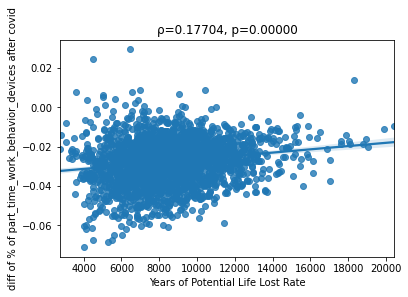

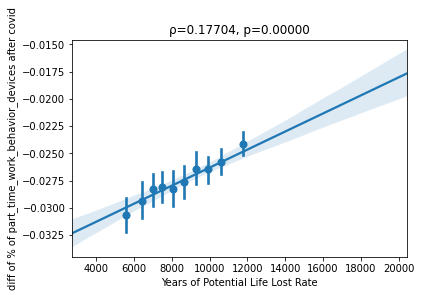

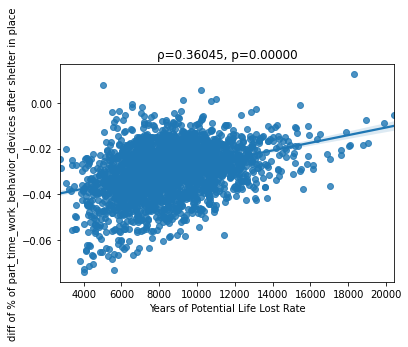

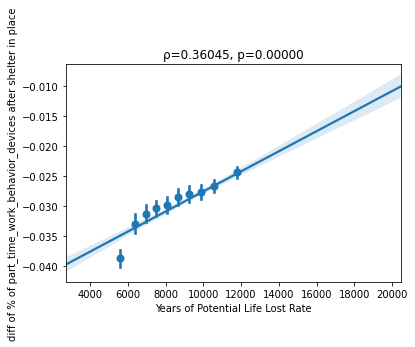

======= Teen Birth Rate
Since COVID19 (date varies from area to area), normality 54.04063, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.17198, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.17712, 0.00000 SIGNIFICANT
Since shelter in place, normality 121.58035, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.33614, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.33499, 0.00000 SIGNIFICANT


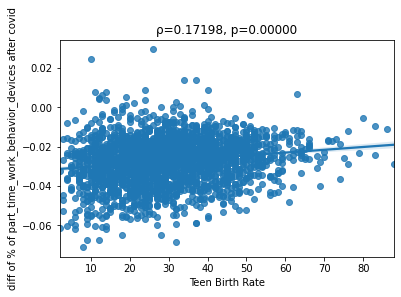

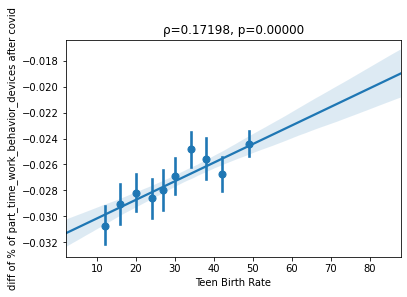

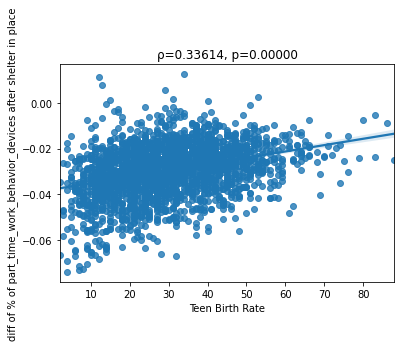

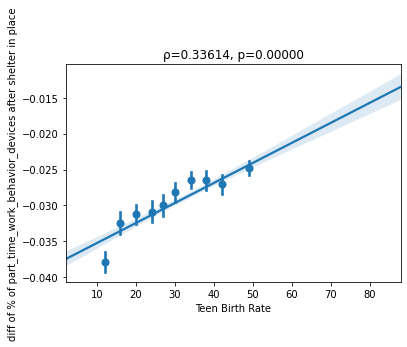

======= % Low Birthweight
Since COVID19 (date varies from area to area), normality 54.02611, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.13057, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.14055, 0.00000 SIGNIFICANT
Since shelter in place, normality 119.58647, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.15114, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.14899, 0.00000 SIGNIFICANT


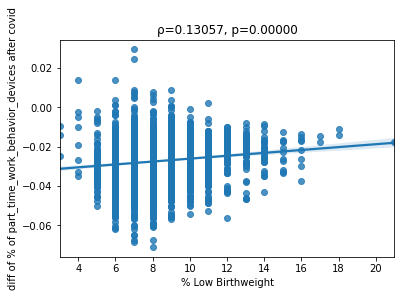

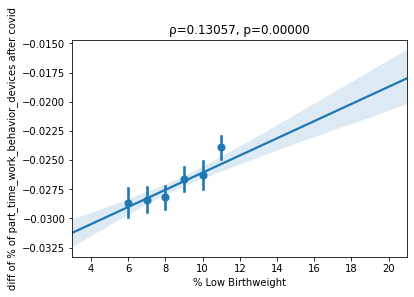

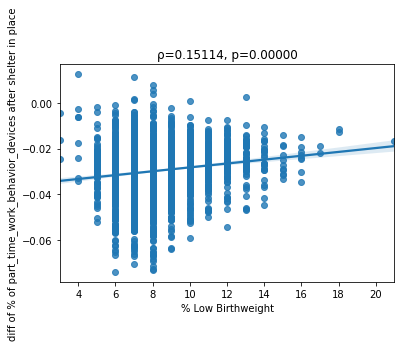

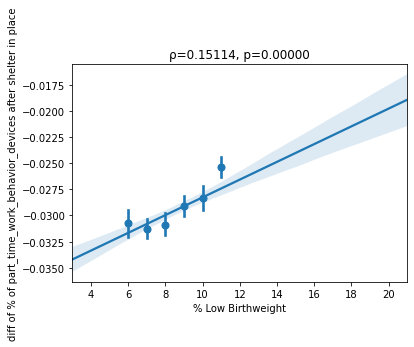

======= Chlamydia Rate
Since COVID19 (date varies from area to area), normality 53.64075, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.17701, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.19156, 0.00000 SIGNIFICANT
Since shelter in place, normality 121.29161, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.09951, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.06409, 0.00163 SIGNIFICANT


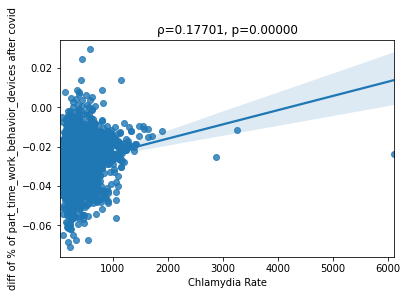

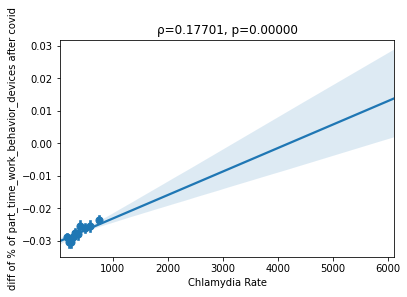

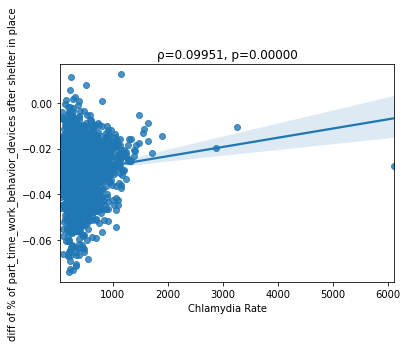

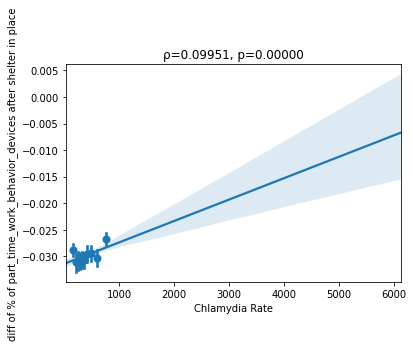

======= Other Primary Care Provider Rate
Since COVID19 (date varies from area to area), normality 53.19642, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.07719, 0.00014 SIGNIFICANT
Since COVID19 , spearmanr 0.10364, 0.00000 SIGNIFICANT
Since shelter in place, normality 113.49916, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.02300, 0.25647 
Since shelter in place, spearmanr 0.01447, 0.47513 


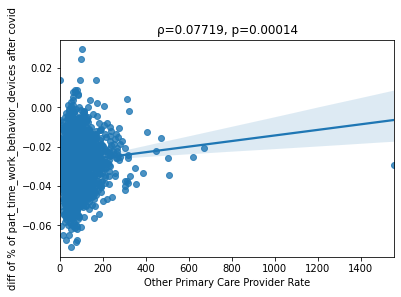

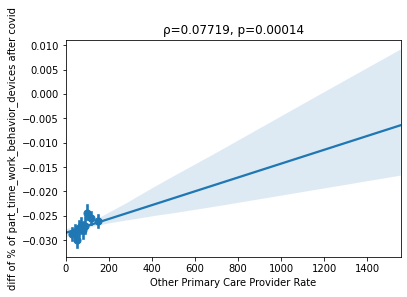

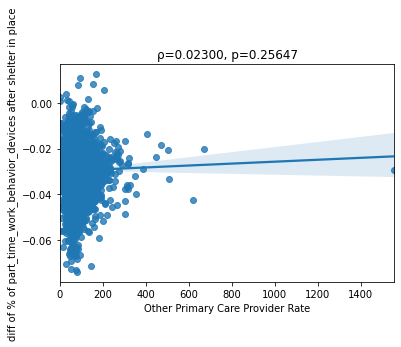

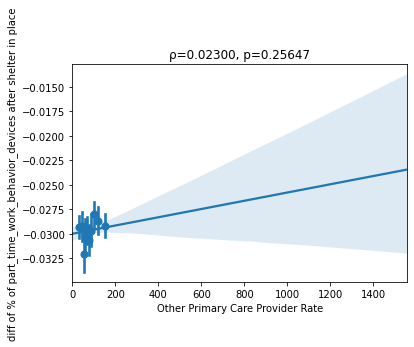

======= Segregation Index
Since COVID19 (date varies from area to area), normality 53.14923, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.14439, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr -0.17571, 0.00000 SIGNIFICANT
Since shelter in place, normality 122.34515, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.20844, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.24829, 0.00000 SIGNIFICANT


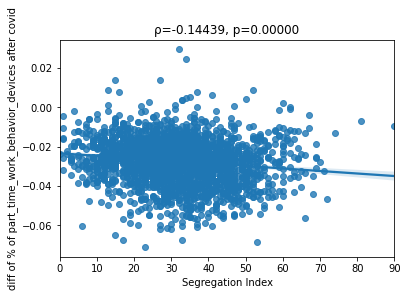

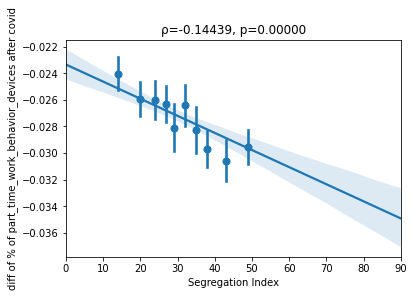

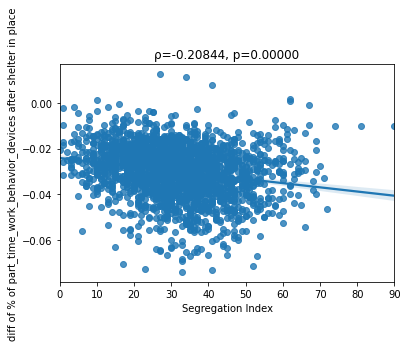

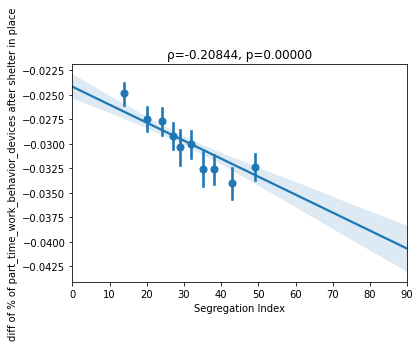

======= Preventable Hospitalization Rate
Since COVID19 (date varies from area to area), normality 53.10859, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.09584, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr -0.09912, 0.00000 SIGNIFICANT
Since shelter in place, normality 115.00380, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.01148, 0.57092 
Since shelter in place, spearmanr -0.02189, 0.27973 


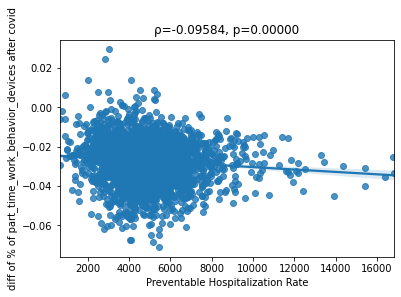

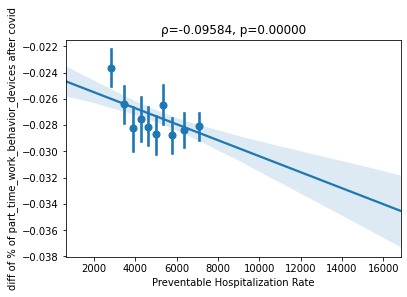

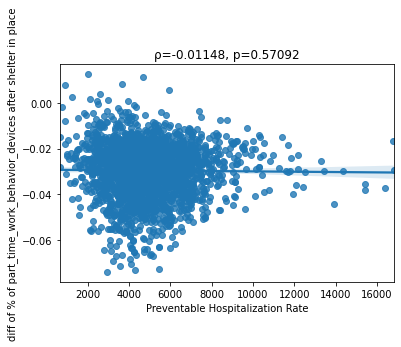

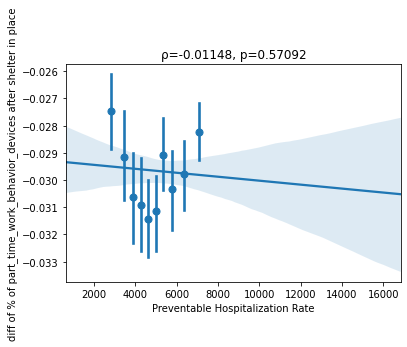

======= Food Environment Index
Since COVID19 (date varies from area to area), normality 53.05739, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.28386, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr -0.29898, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.62565, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.38491, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.38710, 0.00000 SIGNIFICANT


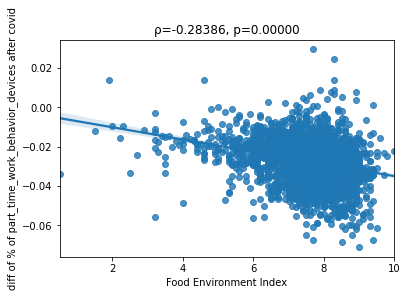

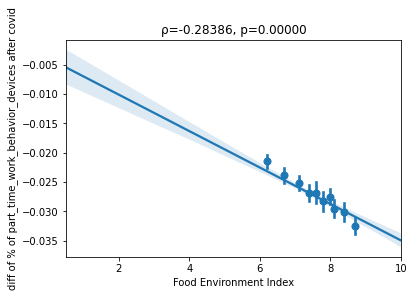

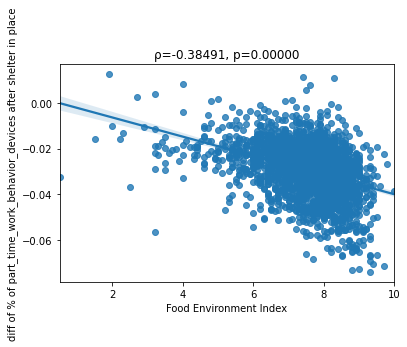

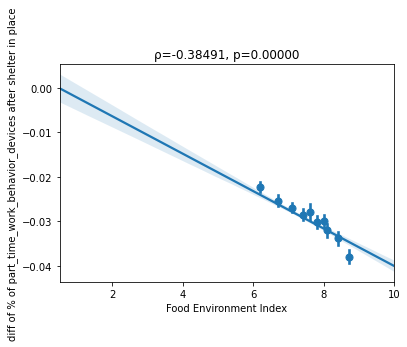

======= % Limited Access to Healthy Foods
Since COVID19 (date varies from area to area), normality 53.05739, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.19117, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.18250, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.62565, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.26647, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.22130, 0.00000 SIGNIFICANT


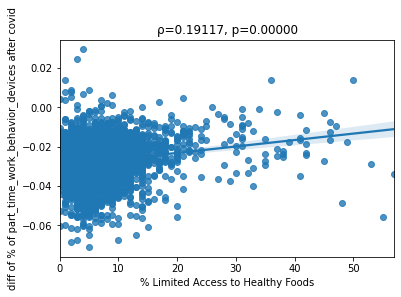

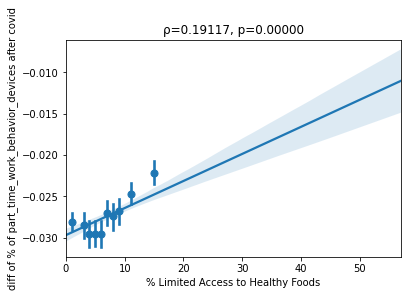

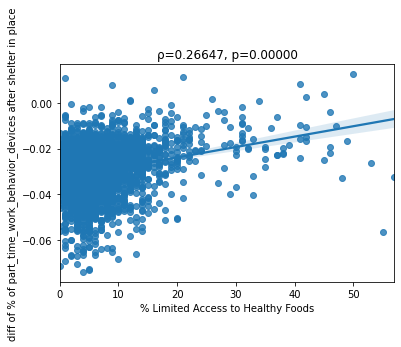

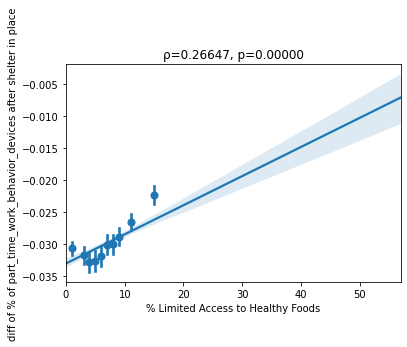

======= Average Daily PM2.5
Since COVID19 (date varies from area to area), normality 52.96235, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.31638, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr -0.31243, 0.00000 SIGNIFICANT
Since shelter in place, normality 120.47077, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.35938, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.34829, 0.00000 SIGNIFICANT


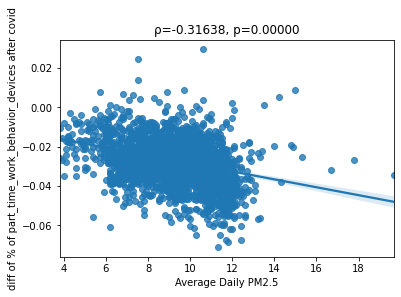

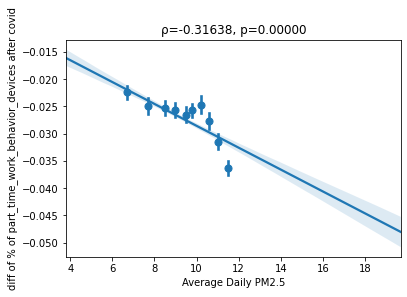

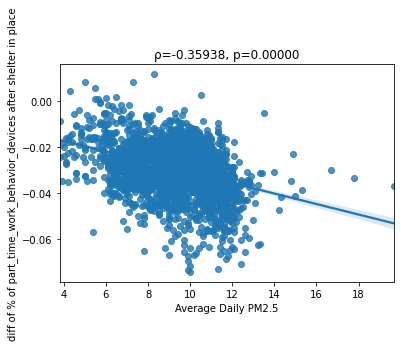

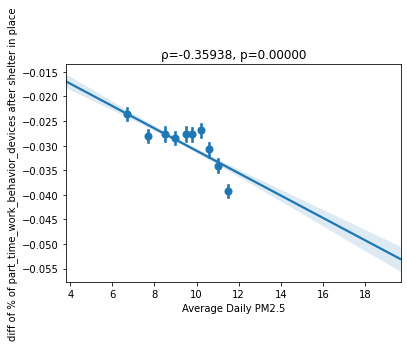

======= % With Annual Mammogram
Since COVID19 (date varies from area to area), normality 52.92867, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.19474, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr -0.18145, 0.00000 SIGNIFICANT
Since shelter in place, normality 114.28809, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.25867, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.23986, 0.00000 SIGNIFICANT


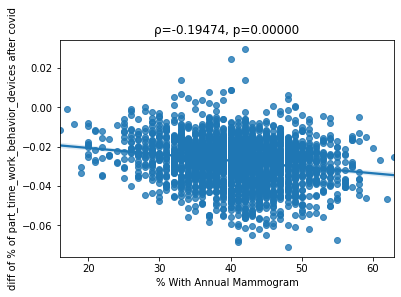

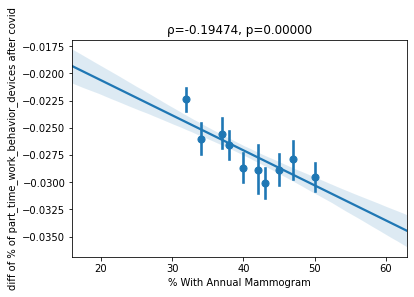

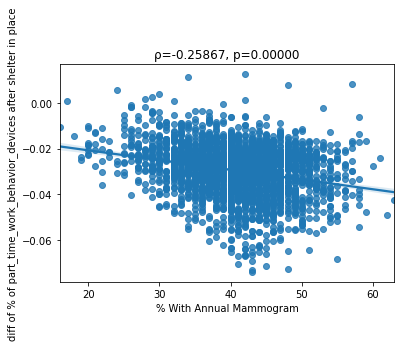

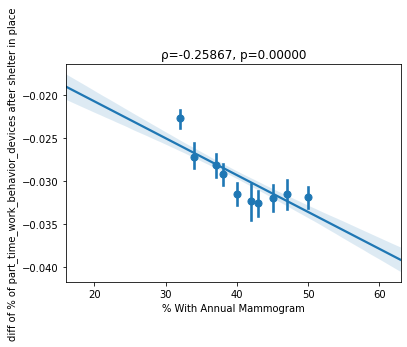

======= % Vaccinated
Since COVID19 (date varies from area to area), normality 52.92867, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.24401, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr -0.25338, 0.00000 SIGNIFICANT
Since shelter in place, normality 114.28809, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.37925, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.37977, 0.00000 SIGNIFICANT


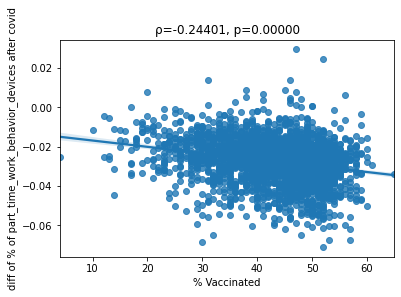

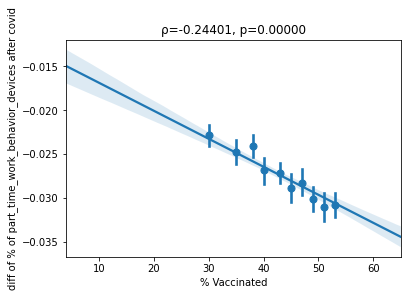

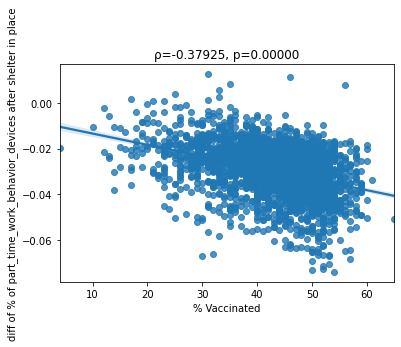

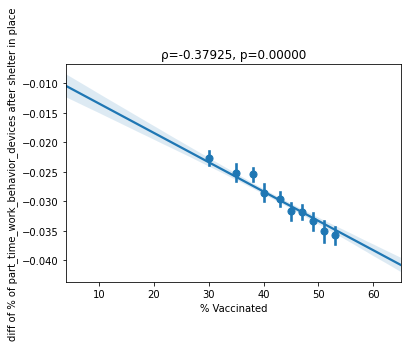

======= % With Access to Exercise Opportunities
Since COVID19 (date varies from area to area), normality 52.88289, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.03106, 0.12405 
Since COVID19 , spearmanr -0.03362, 0.09592 
Since shelter in place, normality 114.48374, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.23240, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.23668, 0.00000 SIGNIFICANT


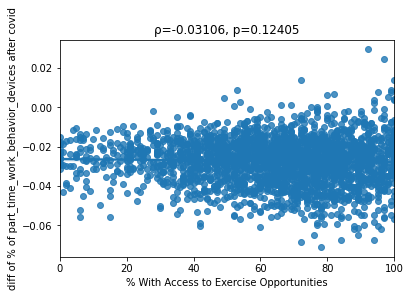

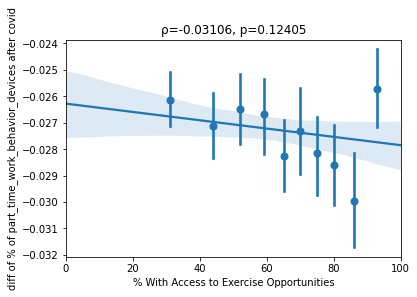

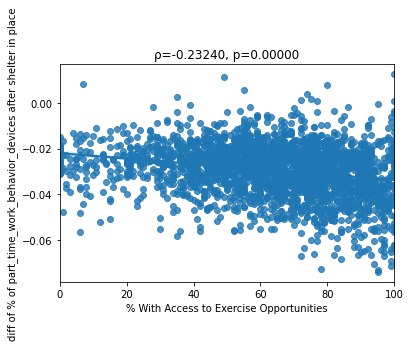

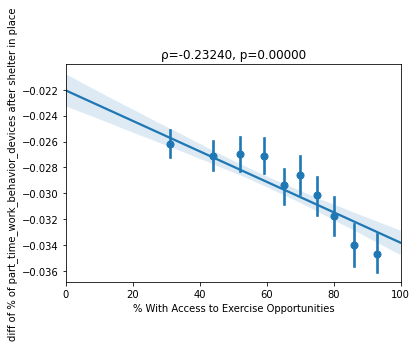

======= % Rural
Since COVID19 (date varies from area to area), normality 52.88289, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.04474, 0.02669 
Since COVID19 , spearmanr 0.03509, 0.08232 
Since shelter in place, normality 114.48374, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.31328, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.28706, 0.00000 SIGNIFICANT


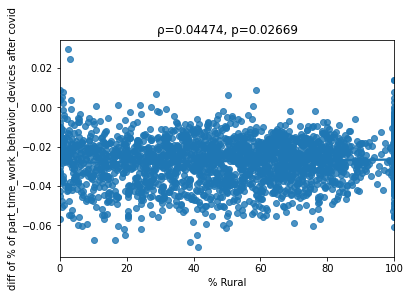

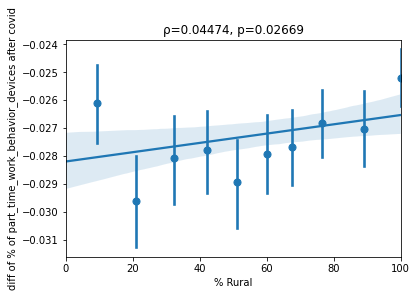

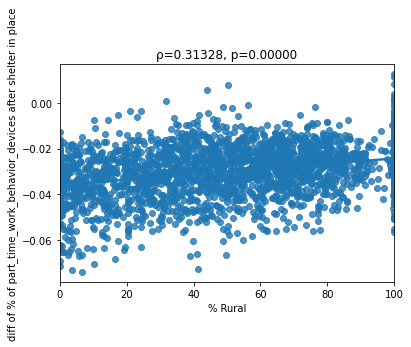

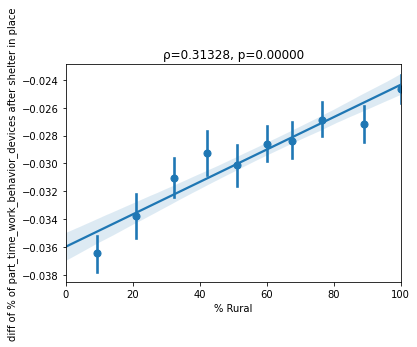

======= Income Ratio
Since COVID19 (date varies from area to area), normality 52.37594, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.10888, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.11947, 0.00000 SIGNIFICANT
Since shelter in place, normality 110.05426, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.07967, 0.00008 SIGNIFICANT
Since shelter in place, spearmanr 0.10266, 0.00000 SIGNIFICANT


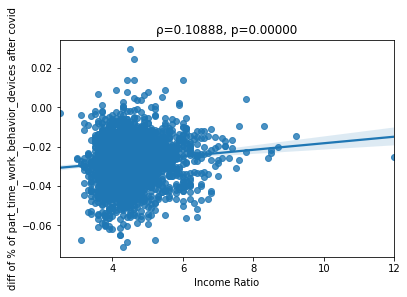

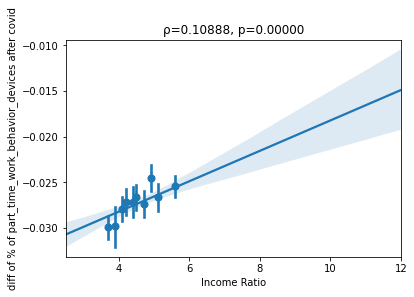

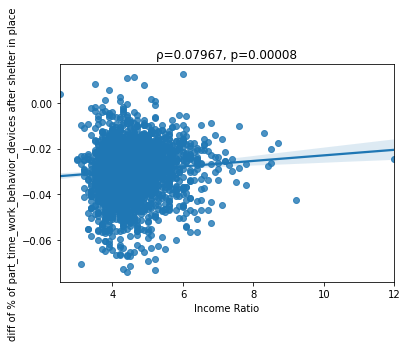

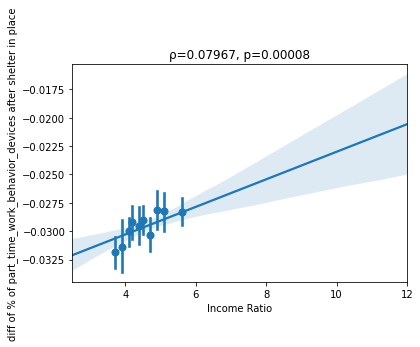

======= % Drive Alone to Work
Since COVID19 (date varies from area to area), normality 52.35128, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.26505, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr -0.25660, 0.00000 SIGNIFICANT
Since shelter in place, normality 110.20044, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.16677, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.17667, 0.00000 SIGNIFICANT


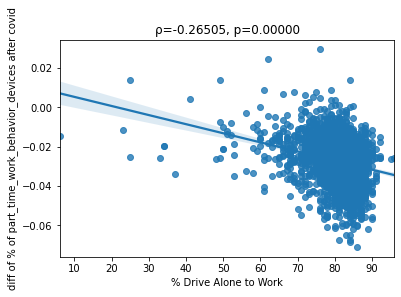

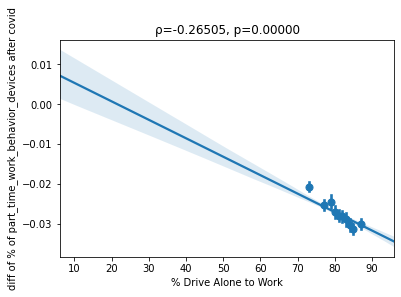

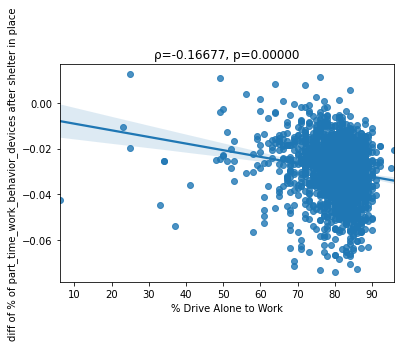

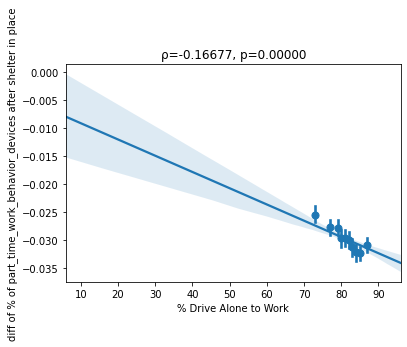

======= % Long Commute - Drives Alone
Since COVID19 (date varies from area to area), normality 52.35128, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.06619, 0.00103 SIGNIFICANT
Since COVID19 , spearmanr -0.06383, 0.00156 SIGNIFICANT
Since shelter in place, normality 110.20044, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.12730, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.11198, 0.00000 SIGNIFICANT


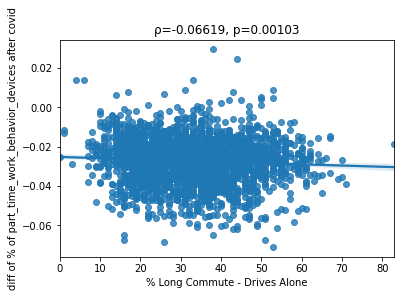

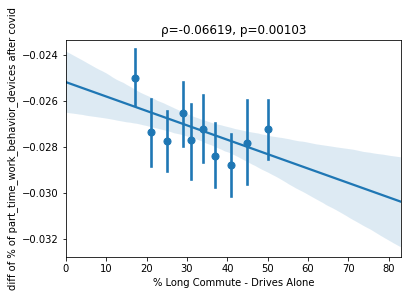

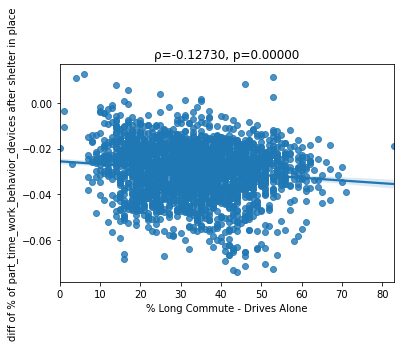

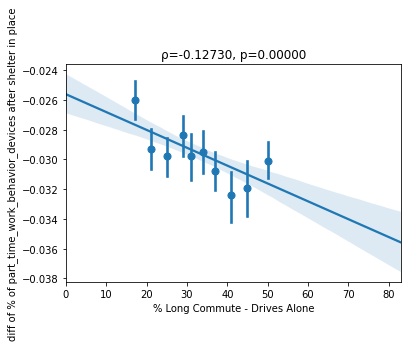

======= % Severe Housing Cost Burden
Since COVID19 (date varies from area to area), normality 52.35128, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.18001, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.18853, 0.00000 SIGNIFICANT
Since shelter in place, normality 110.20044, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.00208, 0.91813 
Since shelter in place, spearmanr 0.03149, 0.11886 


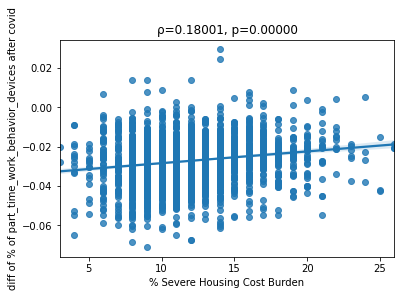

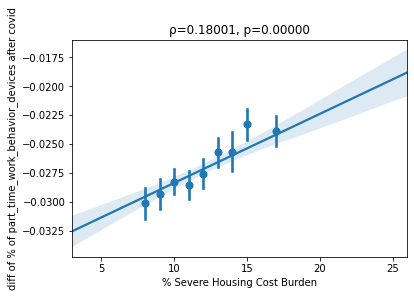

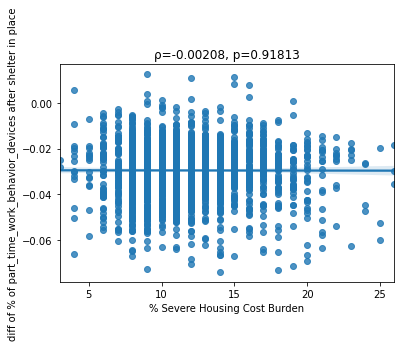

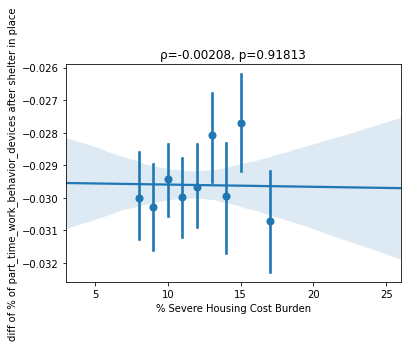

======= Injury Death Rate
Since COVID19 (date varies from area to area), normality 52.33772, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.21171, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.19167, 0.00000 SIGNIFICANT
Since shelter in place, normality 115.21484, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.38524, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.34990, 0.00000 SIGNIFICANT


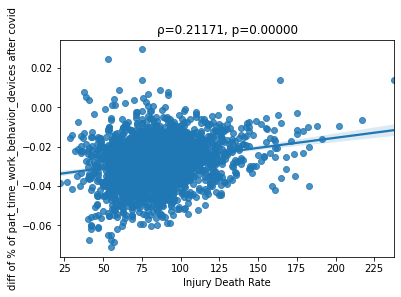

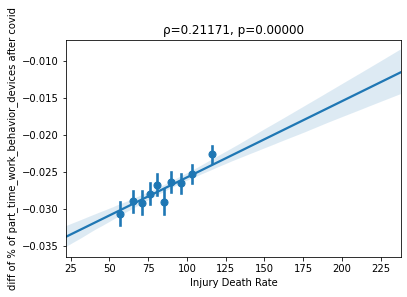

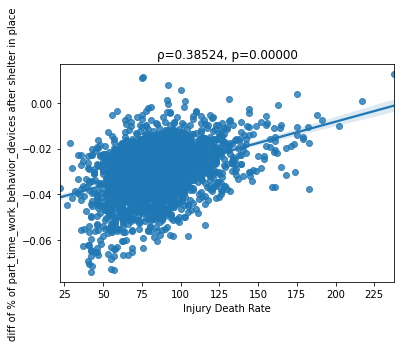

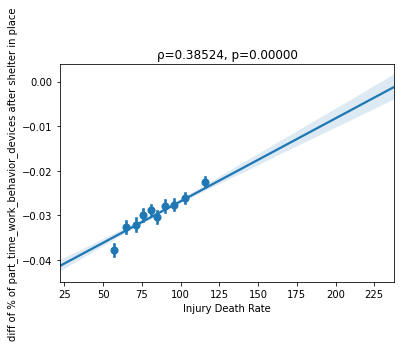

======= Population_y
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.14956, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr -0.09878, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.20612, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.37920, 0.00000 SIGNIFICANT


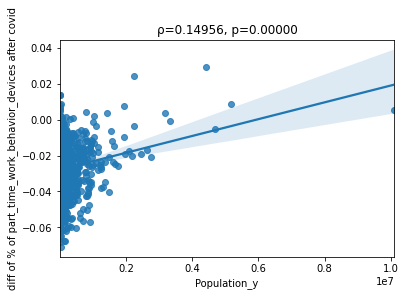

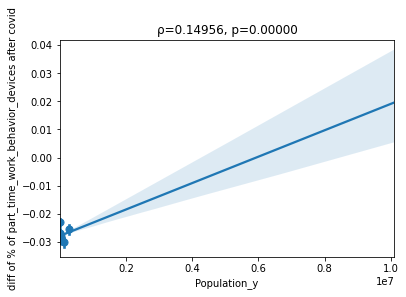

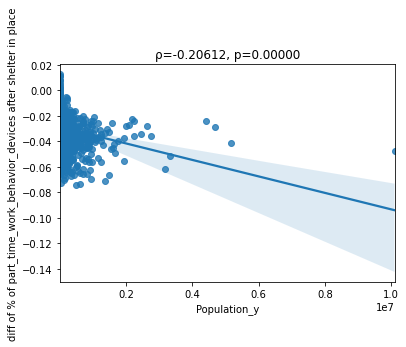

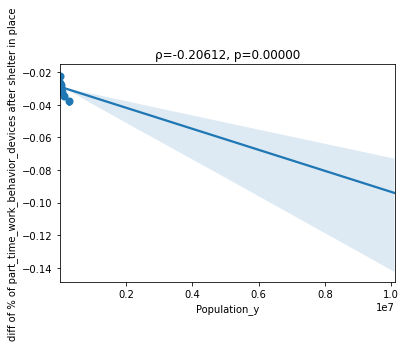

======= % Fair or Poor Health
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.16335, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.18077, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.29015, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.30553, 0.00000 SIGNIFICANT


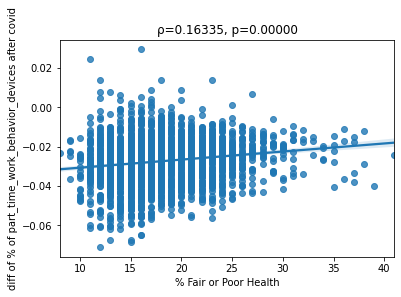

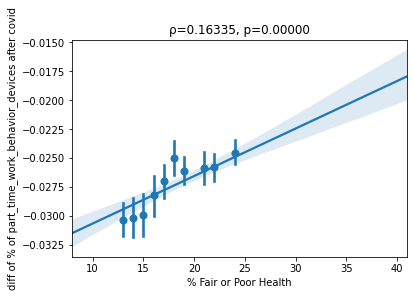

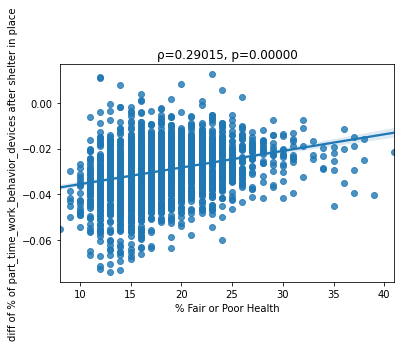

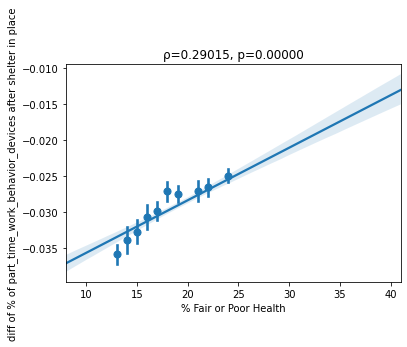

======= Average Number of Physically Unhealthy Days
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.09965, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.11590, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.26300, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.25812, 0.00000 SIGNIFICANT


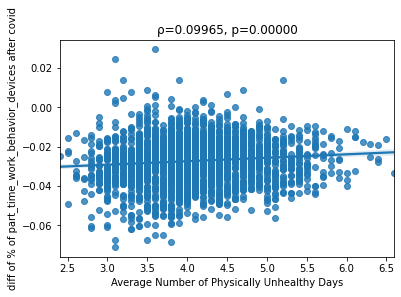

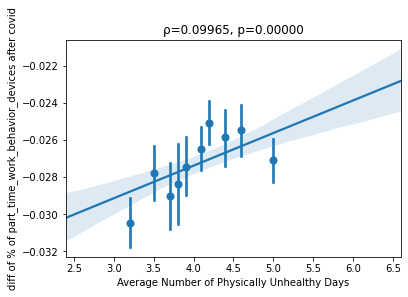

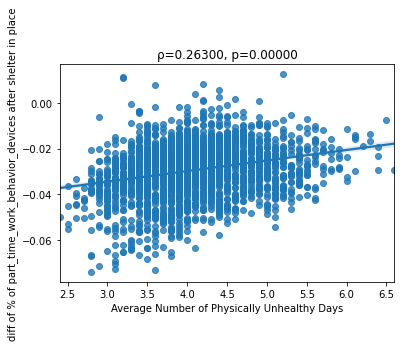

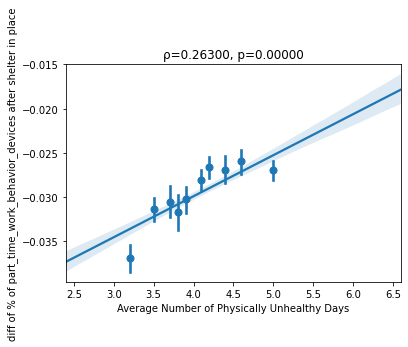

======= Average Number of Mentally Unhealthy Days
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.03266, 0.10569 
Since COVID19 , spearmanr 0.04213, 0.03687 
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.17366, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.15962, 0.00000 SIGNIFICANT


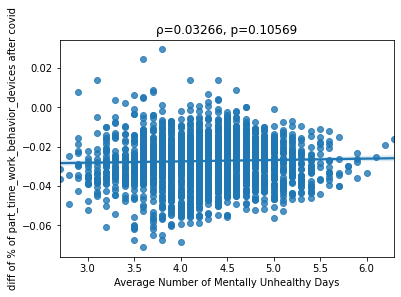

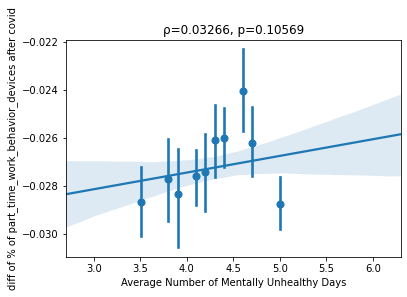

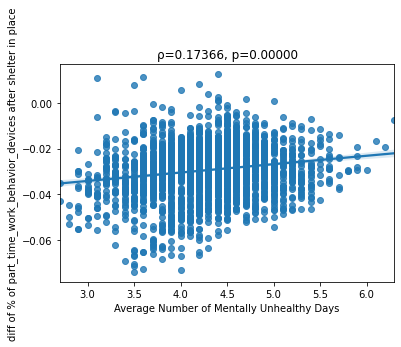

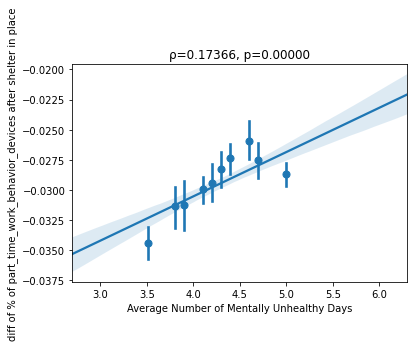

======= % Smokers
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.00042, 0.98348 
Since COVID19 , spearmanr -0.00896, 0.65730 
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.19148, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.14417, 0.00000 SIGNIFICANT


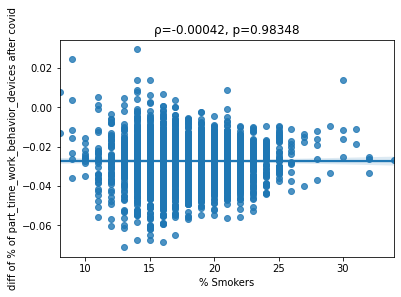

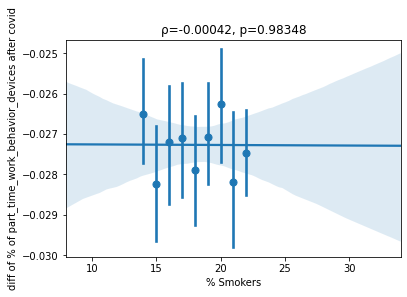

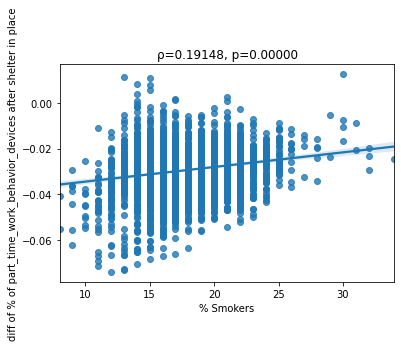

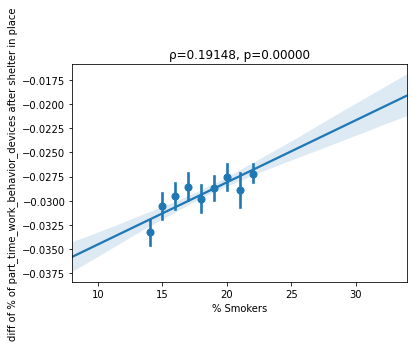

======= % Adults with Obesity
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.02912, 0.14919 
Since COVID19 , spearmanr -0.02689, 0.18291 
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.14460, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.11949, 0.00000 SIGNIFICANT


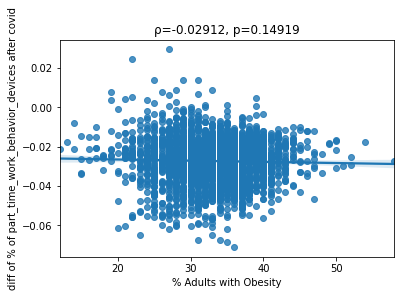

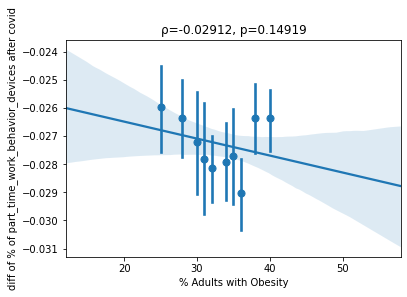

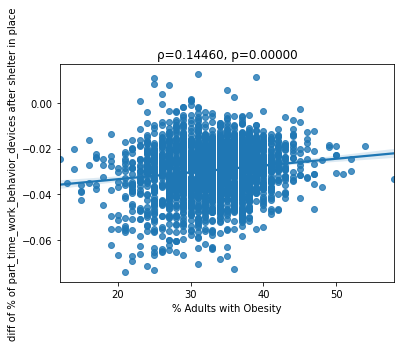

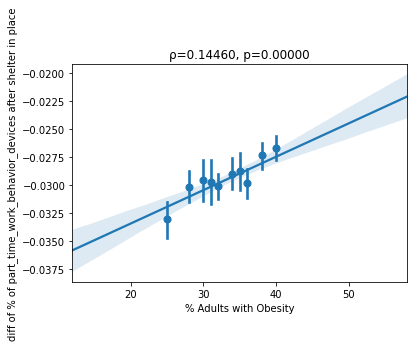

======= % Physically Inactive
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.01127, 0.57676 
Since COVID19 , spearmanr 0.01503, 0.45663 
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.19682, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.18426, 0.00000 SIGNIFICANT


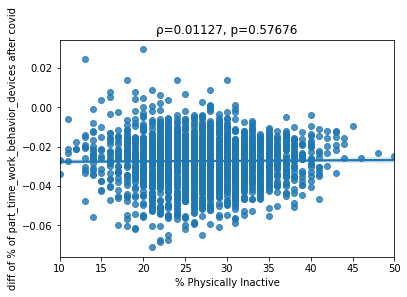

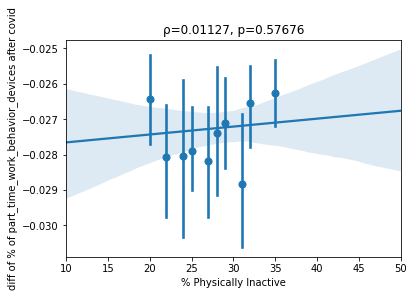

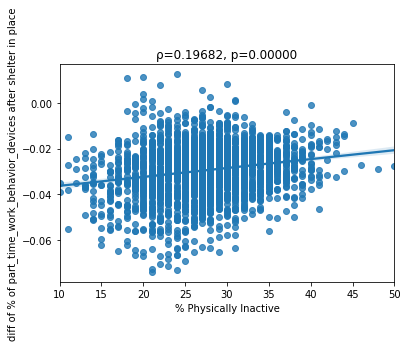

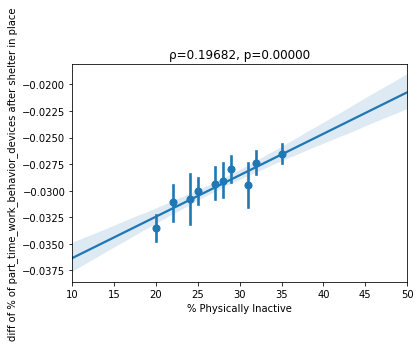

======= % Excessive Drinking
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.21911, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr -0.22021, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.32499, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.32831, 0.00000 SIGNIFICANT


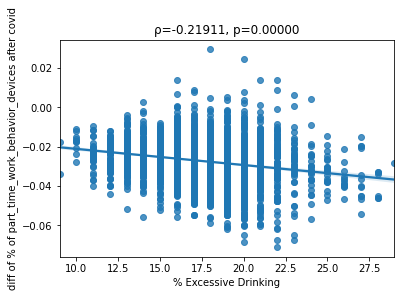

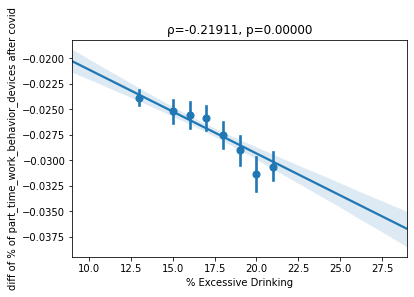

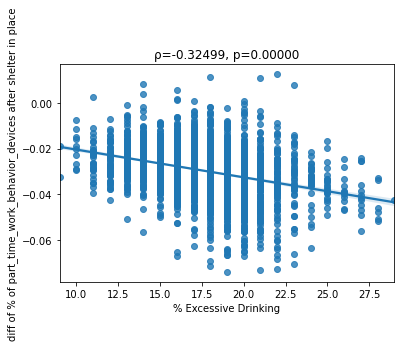

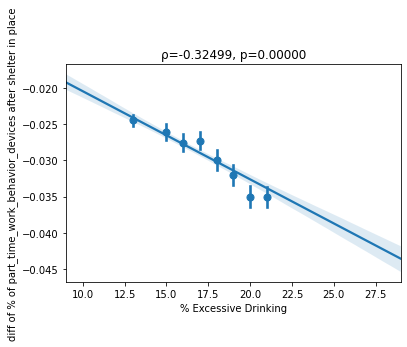

======= % Uninsured_x
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.40119, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.48772, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.46776, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.55501, 0.00000 SIGNIFICANT


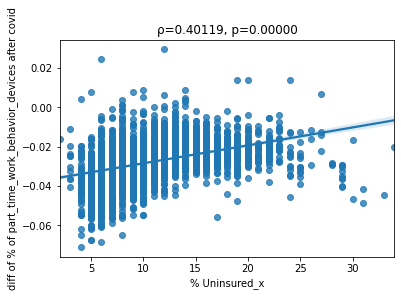

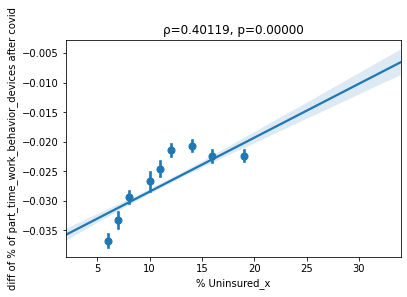

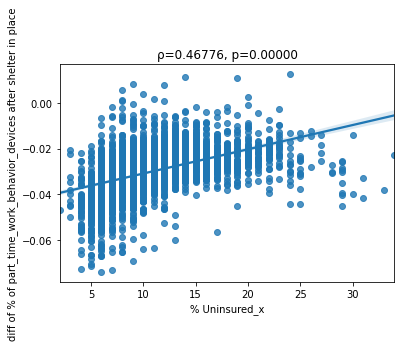

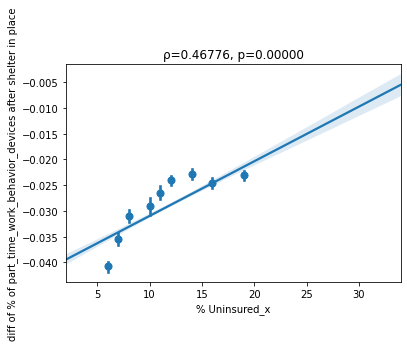

======= % Some College
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.16201, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr -0.16517, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.37053, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.36532, 0.00000 SIGNIFICANT


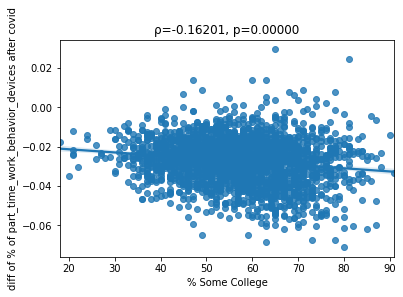

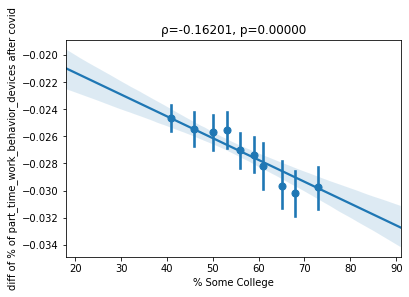

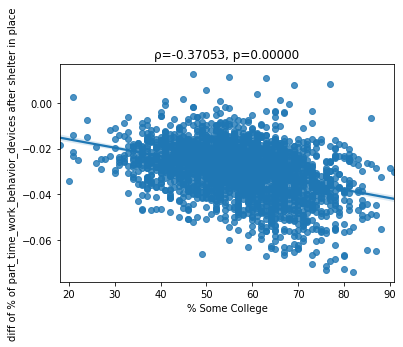

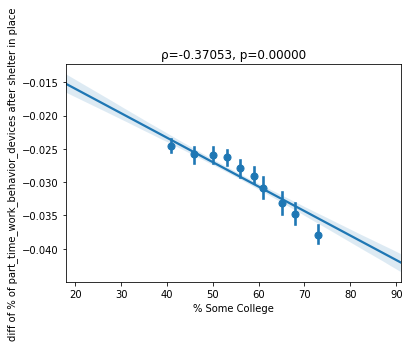

======= % Unemployed
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.03546, 0.07898 
Since COVID19 , spearmanr -0.01175, 0.56065 
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.13491, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.07388, 0.00025 SIGNIFICANT


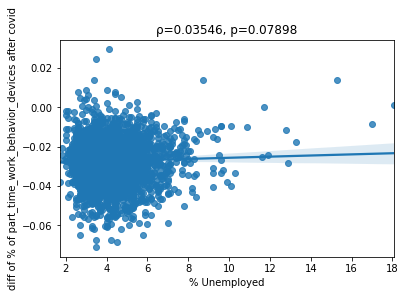

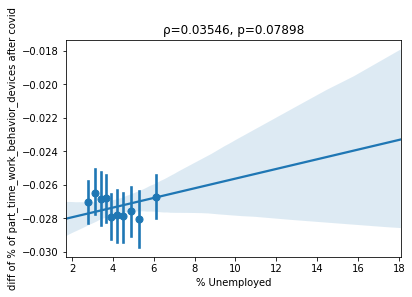

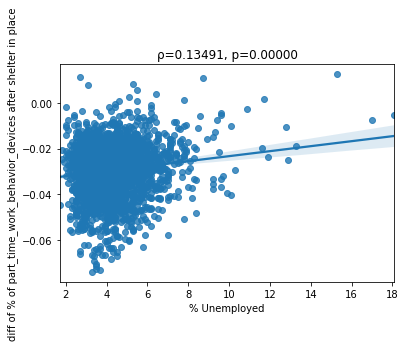

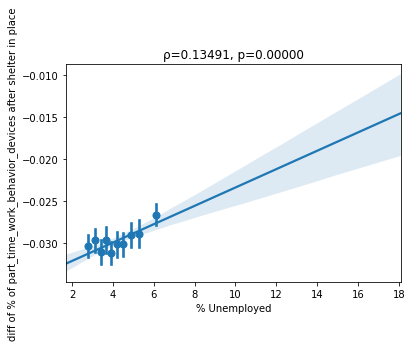

======= % Children in Poverty
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.25679, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.27054, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.38990, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.40162, 0.00000 SIGNIFICANT


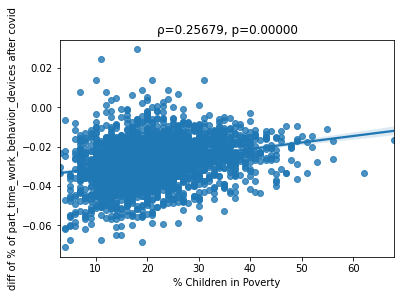

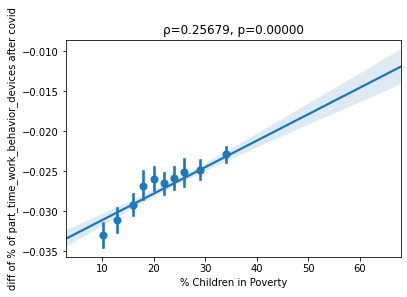

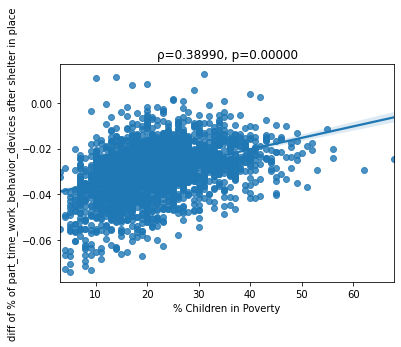

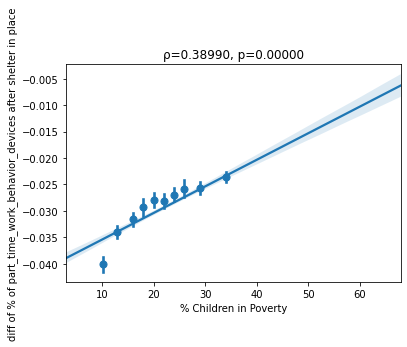

======= % Single-Parent Households
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.18039, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.16689, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.20830, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.17868, 0.00000 SIGNIFICANT


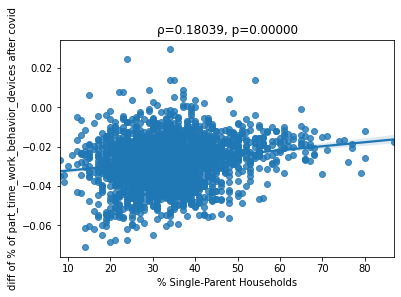

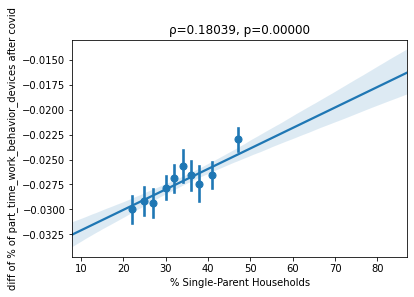

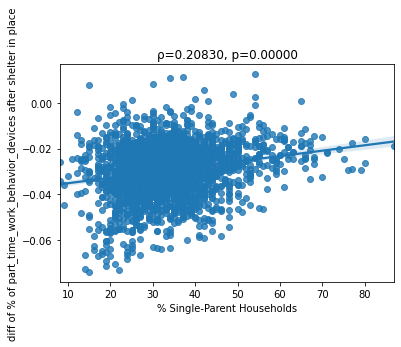

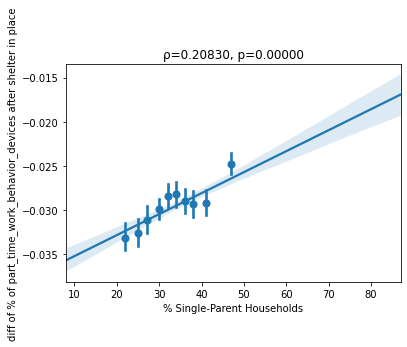

======= Social Association Rate
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.06491, 0.00129 SIGNIFICANT
Since COVID19 , spearmanr -0.07223, 0.00034 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.00617, 0.75977 
Since shelter in place, spearmanr 0.00364, 0.85693 


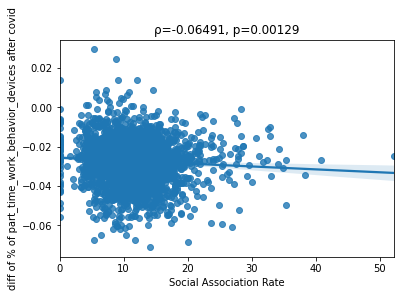

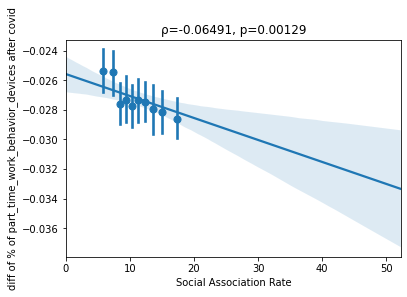

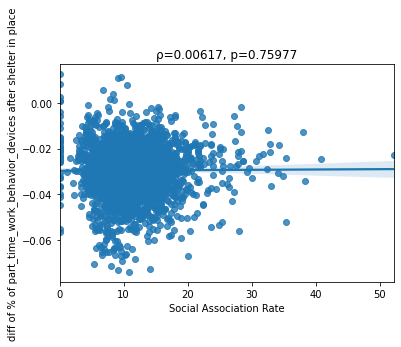

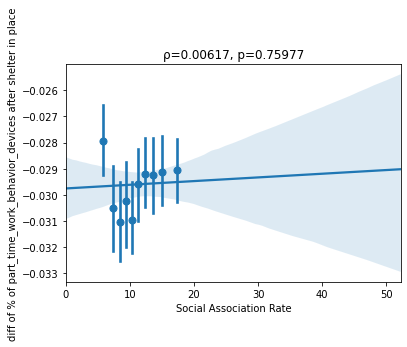

======= % Severe Housing Problems
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.25116, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.27463, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.09048, 0.00001 SIGNIFICANT
Since shelter in place, spearmanr 0.13753, 0.00000 SIGNIFICANT


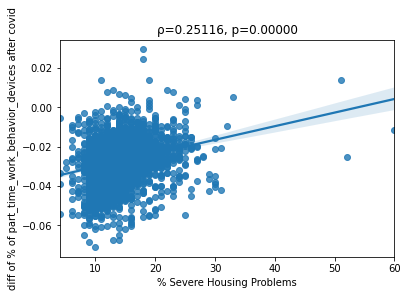

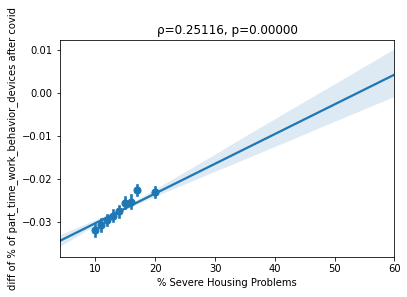

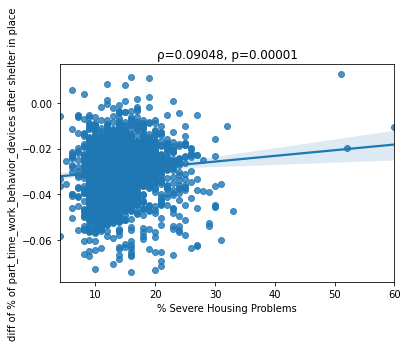

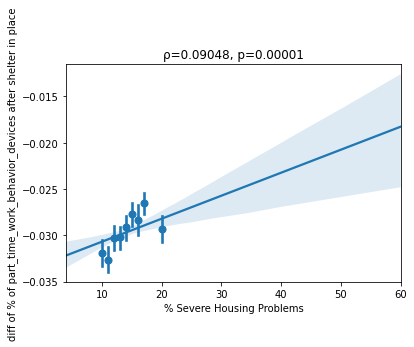

======= % Frequent Physical Distress
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.14079, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.15537, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.29095, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.28663, 0.00000 SIGNIFICANT


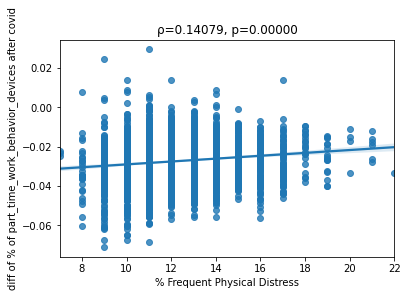

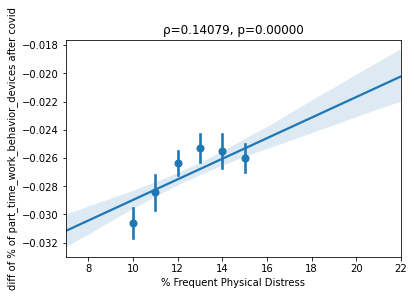

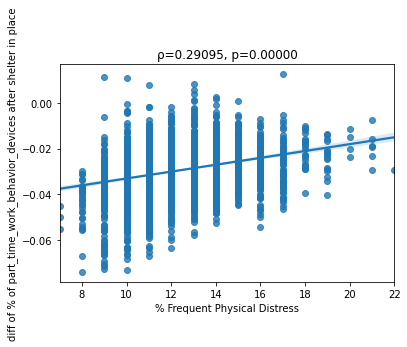

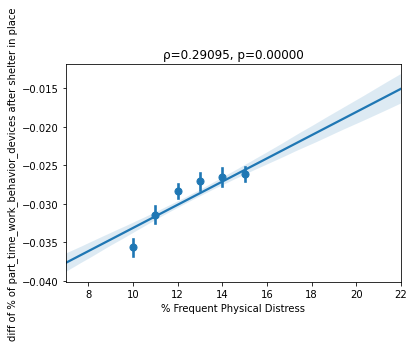

======= % Frequent Mental Distress
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.10022, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.10716, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.24466, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.22787, 0.00000 SIGNIFICANT


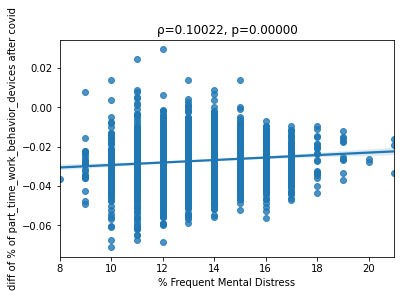

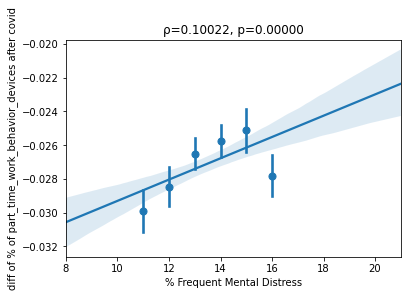

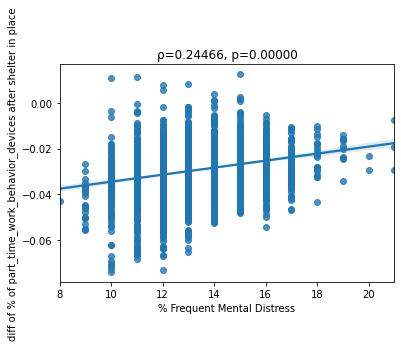

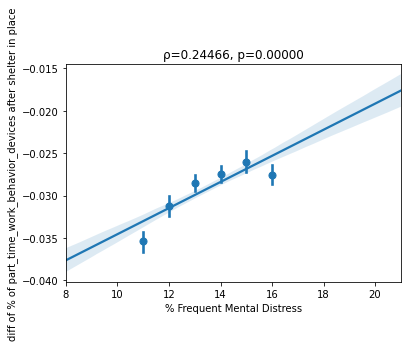

======= % Adults with Diabetes
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.04315, 0.03252 
Since COVID19 , spearmanr 0.04631, 0.02175 
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.16956, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.17789, 0.00000 SIGNIFICANT


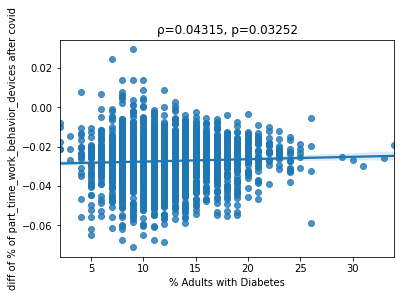

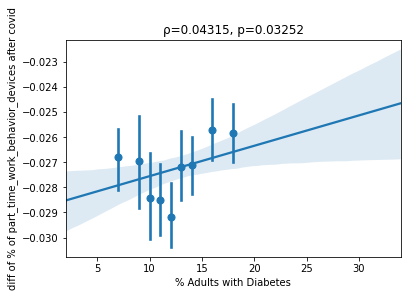

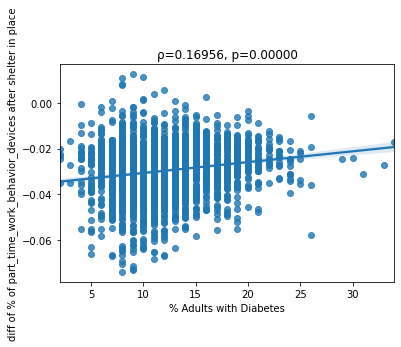

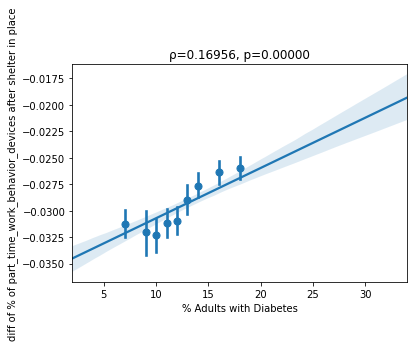

======= % Food Insecure
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.25131, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.26348, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.33606, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.33861, 0.00000 SIGNIFICANT


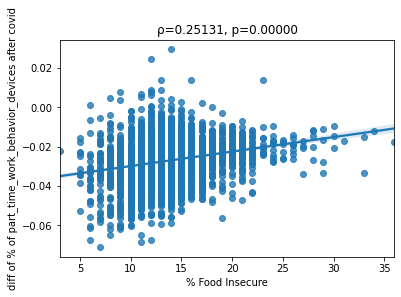

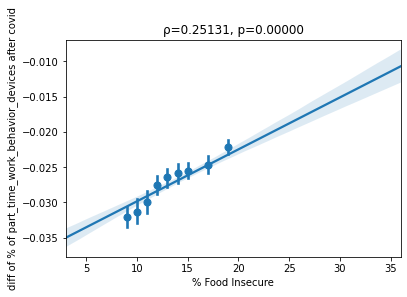

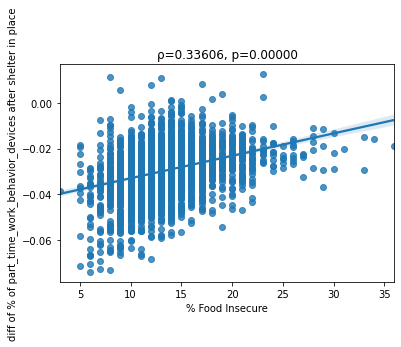

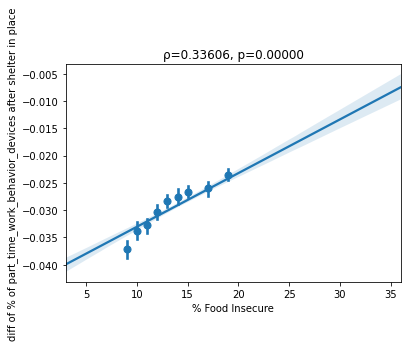

======= % Insufficient Sleep
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.06900, 0.00062 SIGNIFICANT
Since COVID19 , spearmanr -0.08502, 0.00002 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.04486, 0.02623 
Since shelter in place, spearmanr -0.06224, 0.00203 SIGNIFICANT


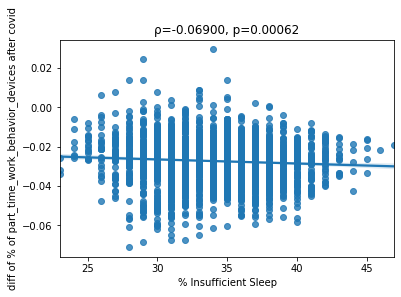

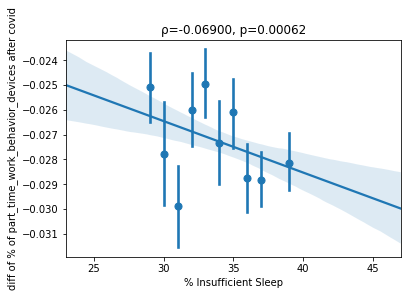

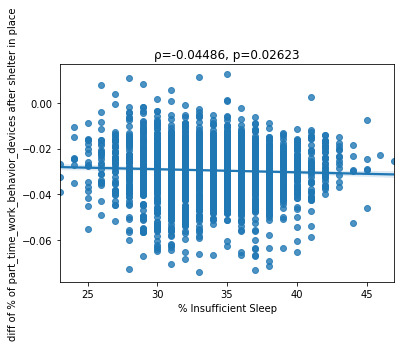

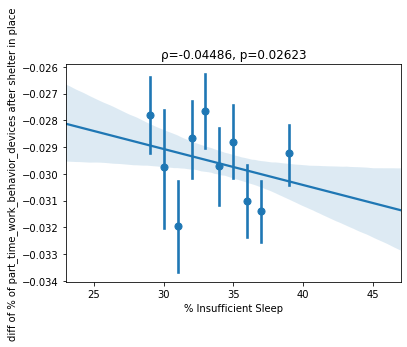

======= % Uninsured_y
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.39803, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.47929, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.45667, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.54060, 0.00000 SIGNIFICANT


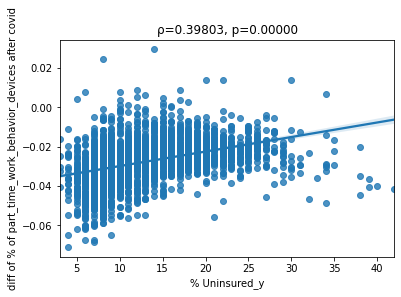

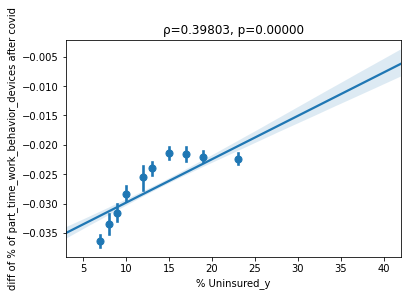

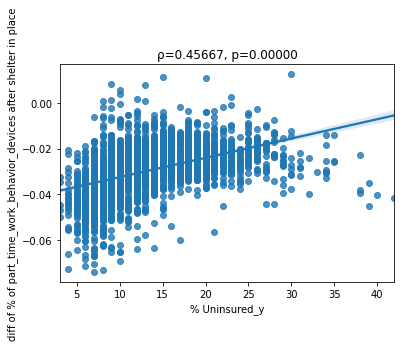

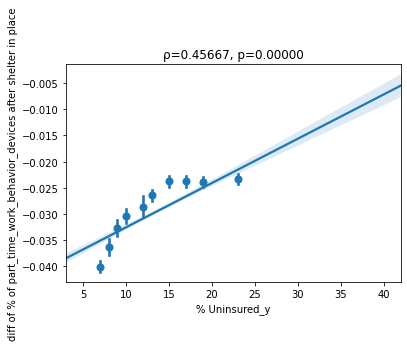

======= % Uninsured.1
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.28524, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.37563, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.37414, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.47257, 0.00000 SIGNIFICANT


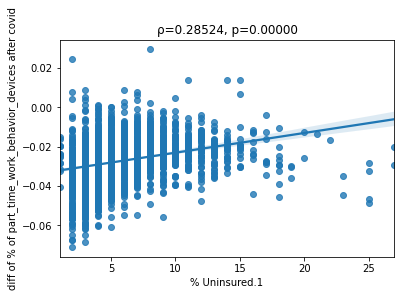

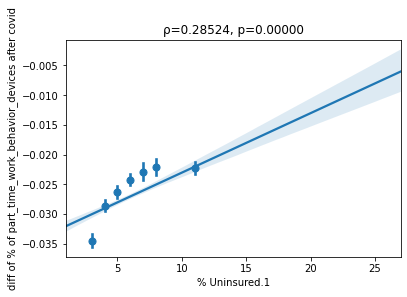

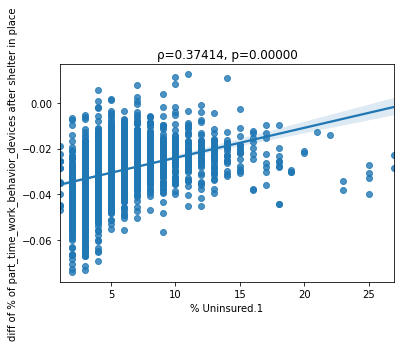

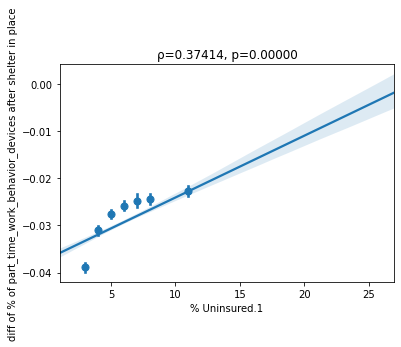

======= Median Household Income
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.19205, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr -0.23179, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.45120, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.42865, 0.00000 SIGNIFICANT


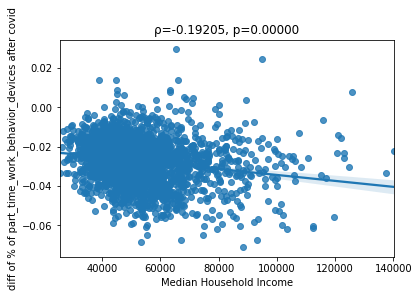

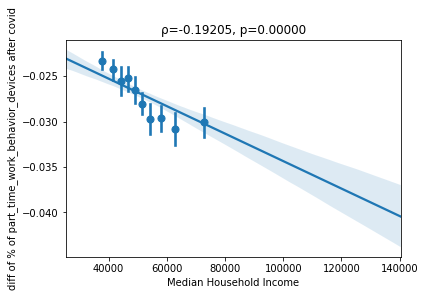

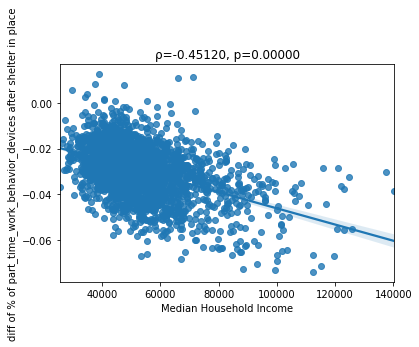

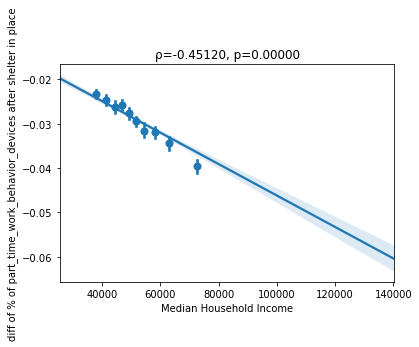

======= Average Traffic Volume per Meter of Major Roadways
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.05669, 0.00496 SIGNIFICANT
Since COVID19 , spearmanr -0.05980, 0.00304 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.26780, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.30273, 0.00000 SIGNIFICANT


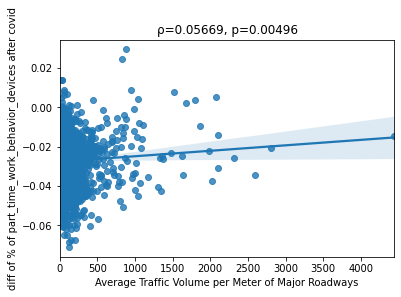

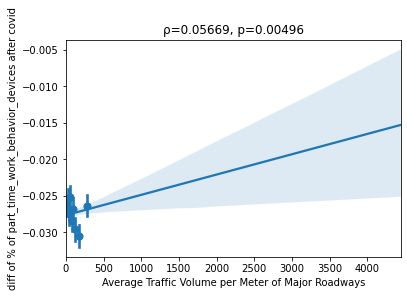

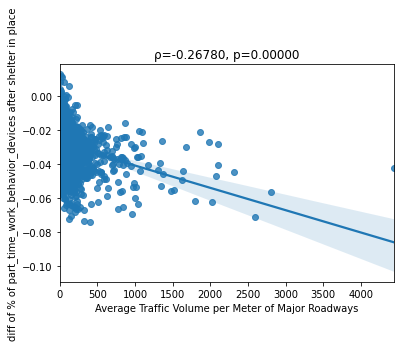

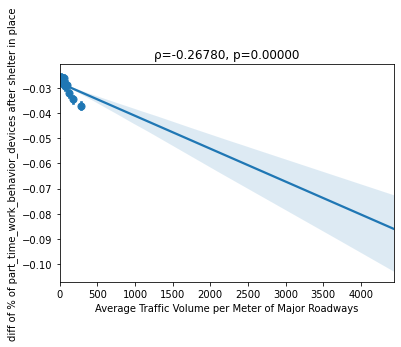

======= % Homeowners
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.18615, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr -0.17425, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.02848, 0.15835 
Since shelter in place, spearmanr -0.03034, 0.13285 


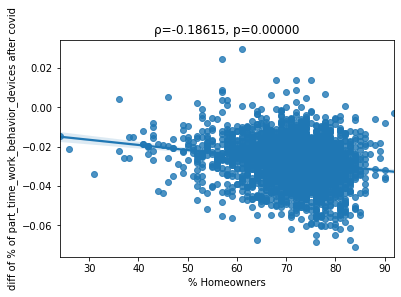

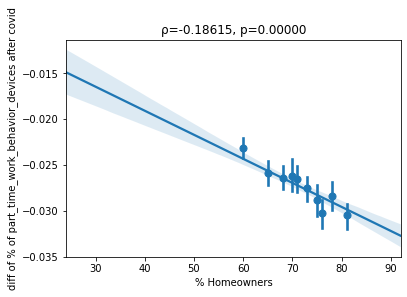

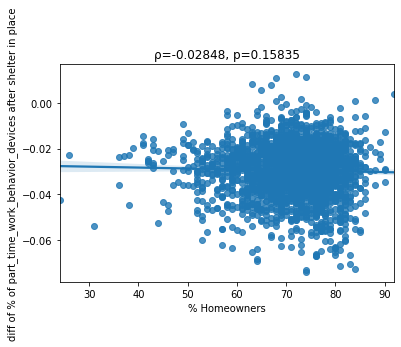

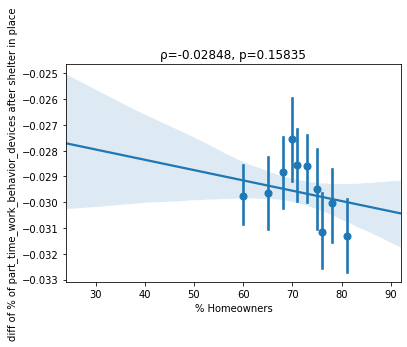

======= % less than 18 years of age
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.08754, 0.00001 SIGNIFICANT
Since COVID19 , spearmanr -0.09839, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.10993, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.12252, 0.00000 SIGNIFICANT


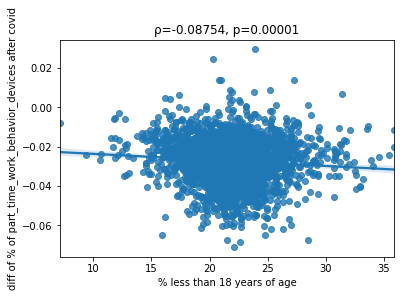

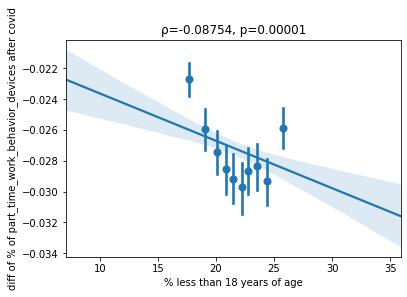

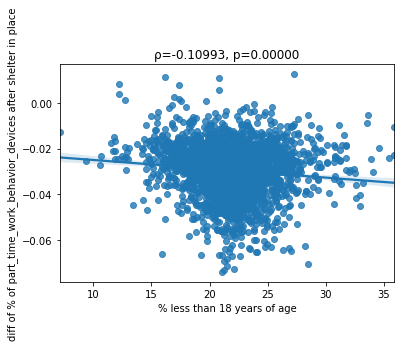

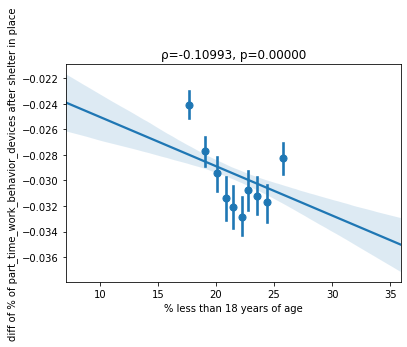

======= % 65 and over
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.14737, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.11540, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.28572, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.26538, 0.00000 SIGNIFICANT


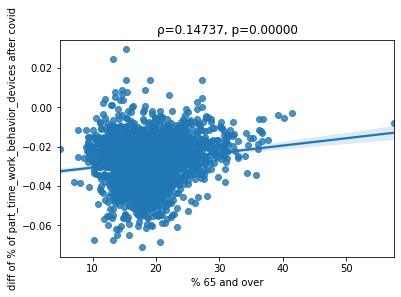

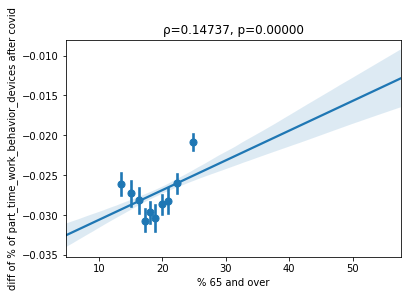

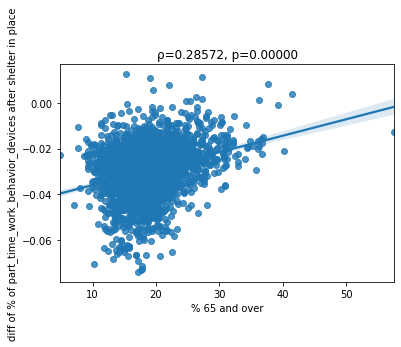

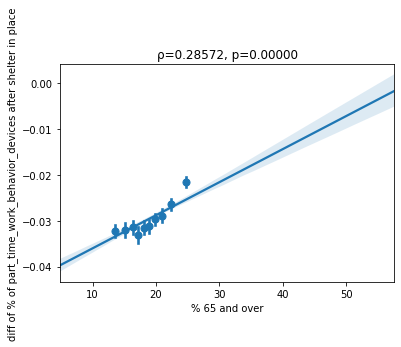

======= % Black
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.15305, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.09154, 0.00001 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.10136, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.02279, 0.25906 


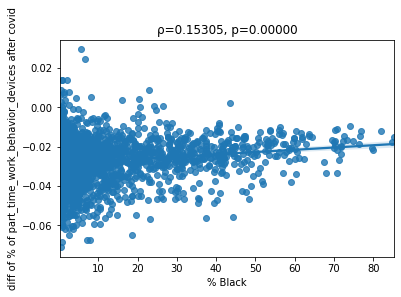

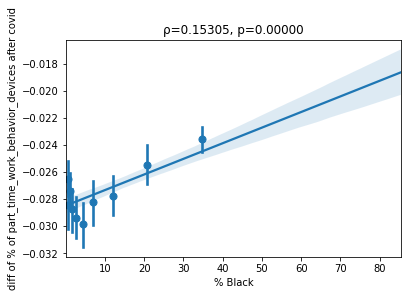

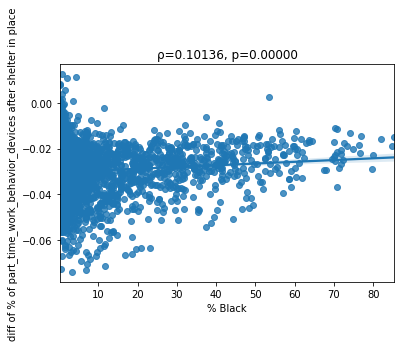

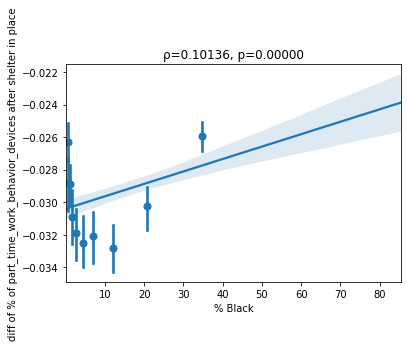

======= % American Indian & Alaska Native
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.16361, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.29647, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.19634, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.28485, 0.00000 SIGNIFICANT


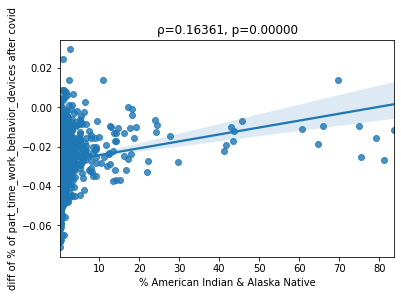

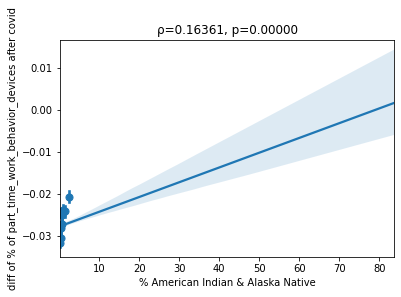

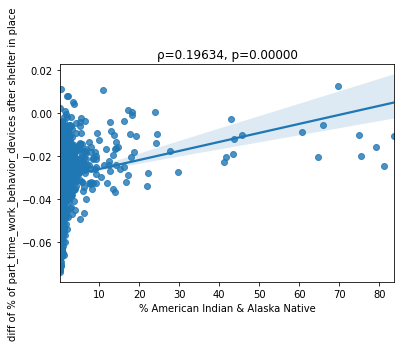

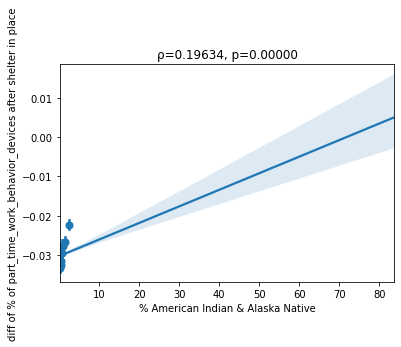

======= % Asian
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.02814, 0.16337 
Since COVID19 , spearmanr 0.03076, 0.12760 
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.28470, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.22354, 0.00000 SIGNIFICANT


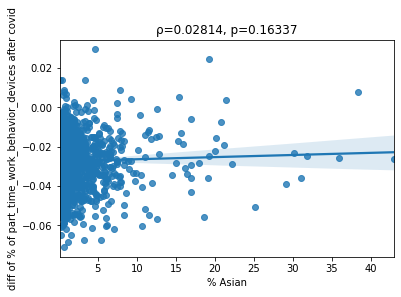

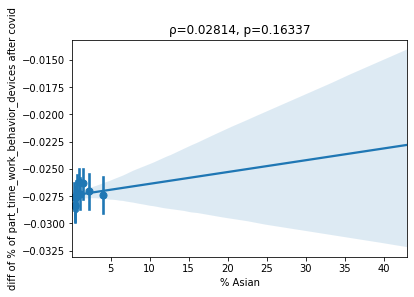

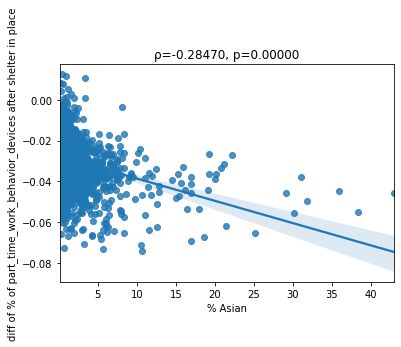

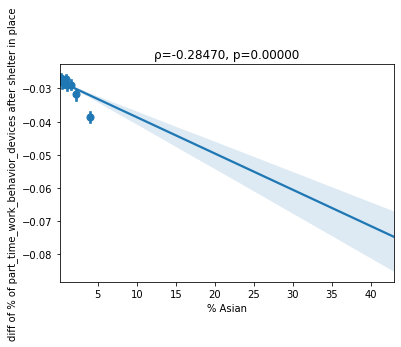

======= % Native Hawaiian/Other Pacific Islander
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.06420, 0.00146 SIGNIFICANT
Since COVID19 , spearmanr 0.20984, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.00582, 0.77311 
Since shelter in place, spearmanr 0.08574, 0.00002 SIGNIFICANT


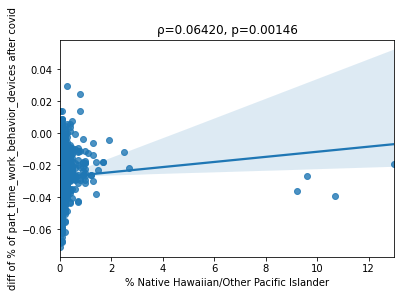

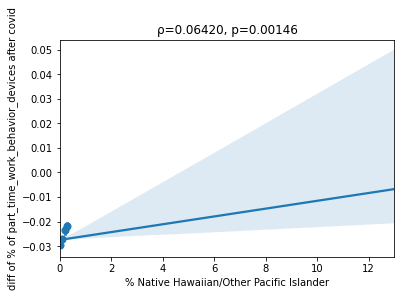

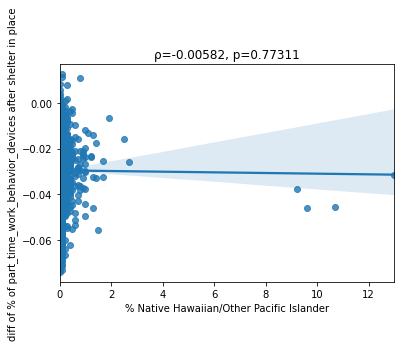

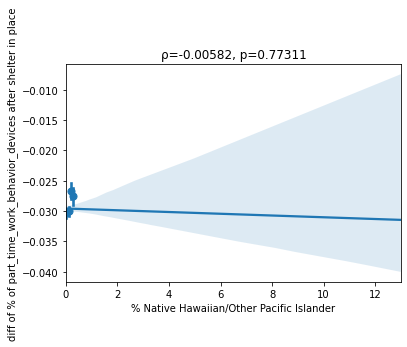

======= % Hispanic
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.17629, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.21027, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.10334, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.06370, 0.00159 SIGNIFICANT


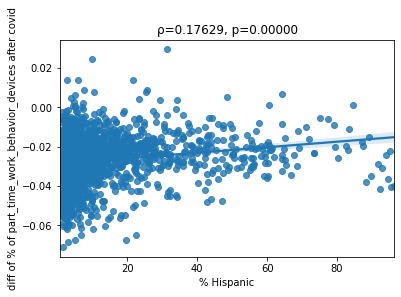

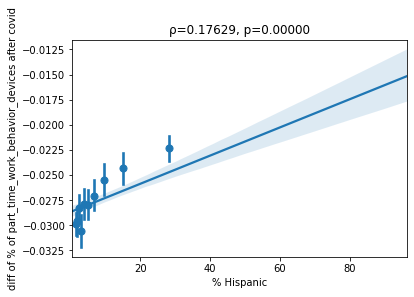

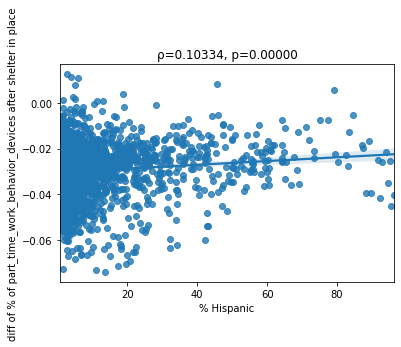

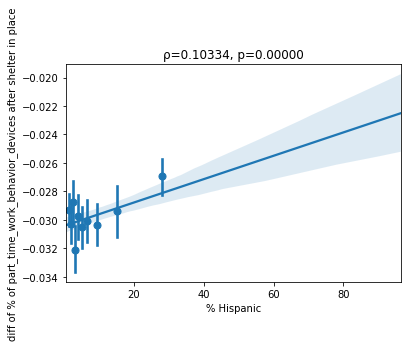

======= % Non-Hispanic White
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.28542, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr -0.29773, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.15292, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.15315, 0.00000 SIGNIFICANT


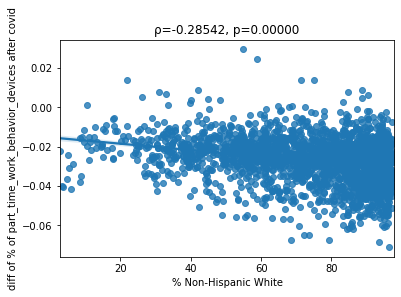

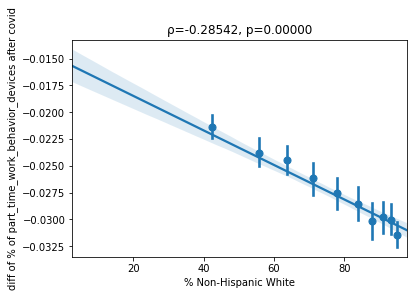

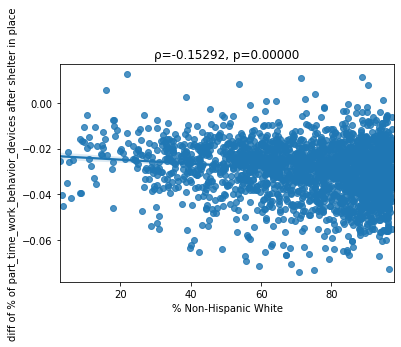

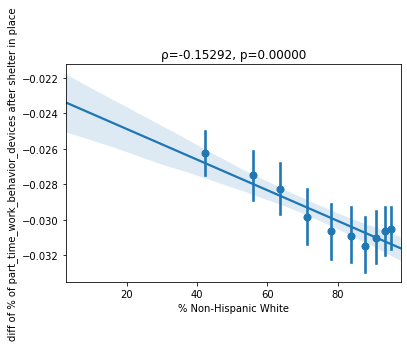

======= % Not Proficient in English
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.13763, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.16456, 0.00000 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.00936, 0.64294 
Since shelter in place, spearmanr 0.00178, 0.92993 


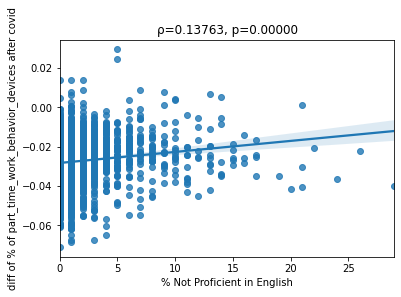

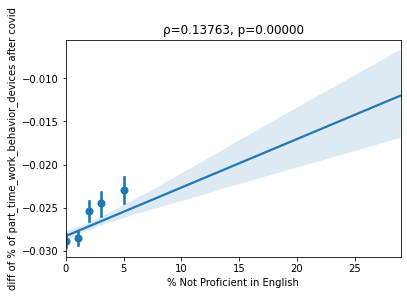

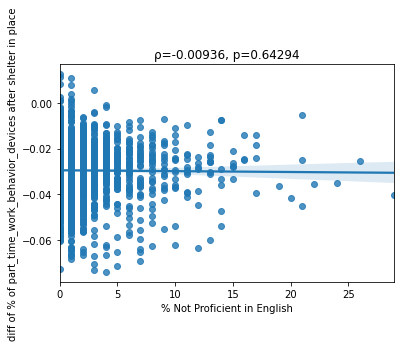

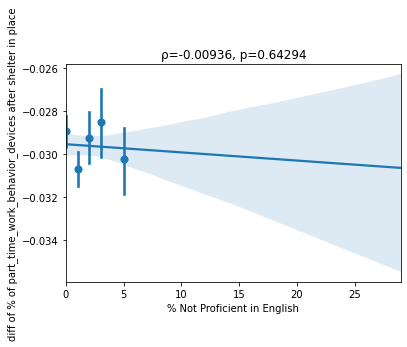

======= % Female
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.03669, 0.06912 
Since COVID19 , spearmanr 0.01453, 0.47164 
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.12031, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.09572, 0.00000 SIGNIFICANT


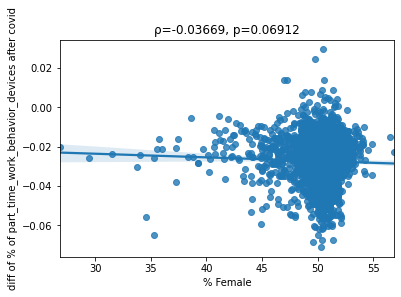

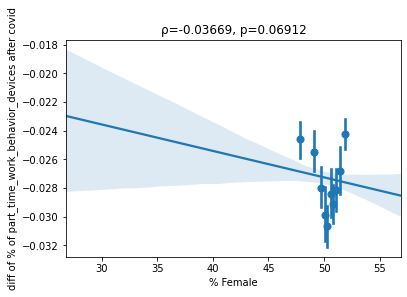

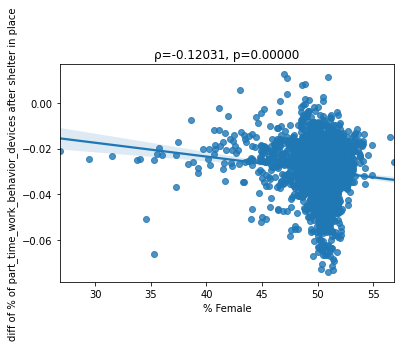

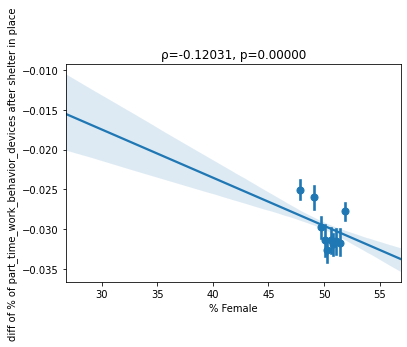

======= political_diff
Since COVID19 (date varies from area to area), normality 52.20967, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.09949, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.05907, 0.00341 SIGNIFICANT
Since shelter in place, normality 109.90470, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.12771, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.14908, 0.00000 SIGNIFICANT


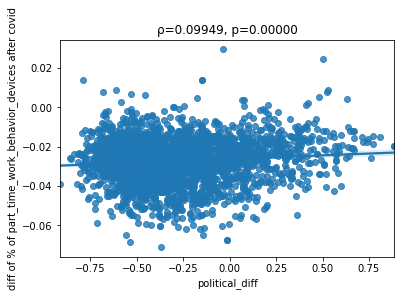

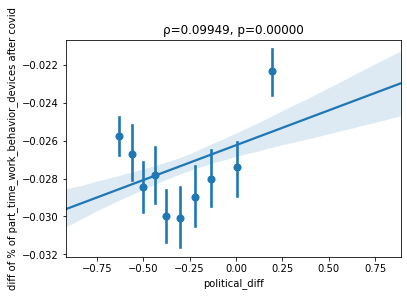

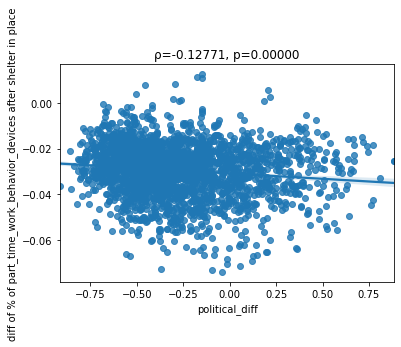

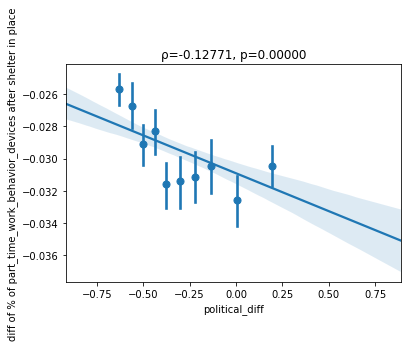

======= % Driving Deaths with Alcohol Involvement
Since COVID19 (date varies from area to area), normality 52.01525, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.02028, 0.31642 
Since COVID19 , spearmanr -0.00543, 0.78852 
Since shelter in place, normality 113.53313, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.03283, 0.10486 
Since shelter in place, spearmanr -0.01426, 0.48127 


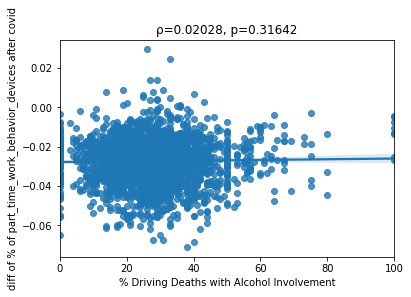

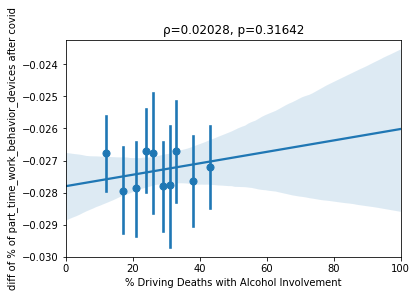

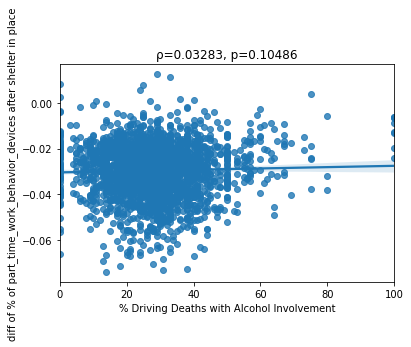

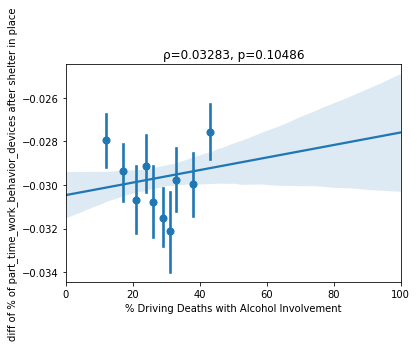

======= Life Expectancy
Since COVID19 (date varies from area to area), normality 51.80123, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.05110, 0.01162 
Since COVID19 , spearmanr -0.06681, 0.00096 SIGNIFICANT
Since shelter in place, normality 115.44578, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.23077, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.22806, 0.00000 SIGNIFICANT


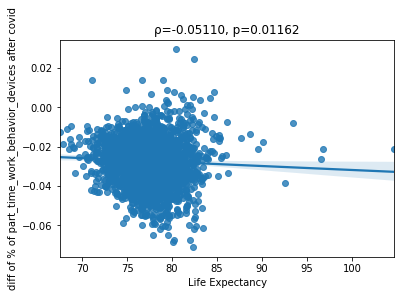

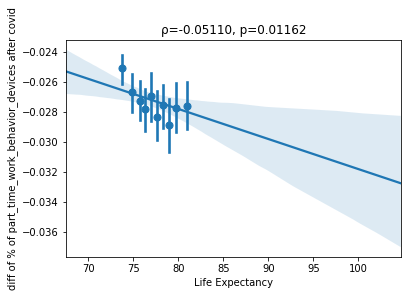

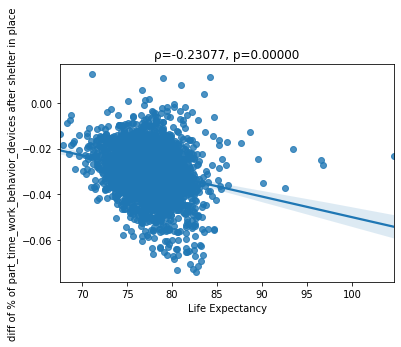

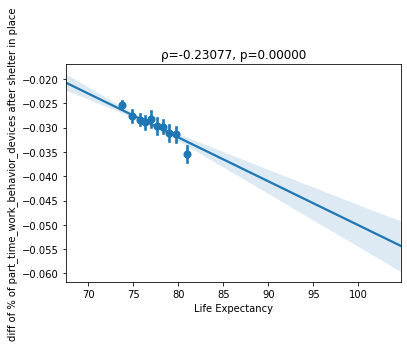

======= Motor Vehicle Mortality Rate
Since COVID19 (date varies from area to area), normality 51.77344, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.22438, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.22517, 0.00000 SIGNIFICANT
Since shelter in place, normality 131.57667, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.42863, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.44954, 0.00000 SIGNIFICANT


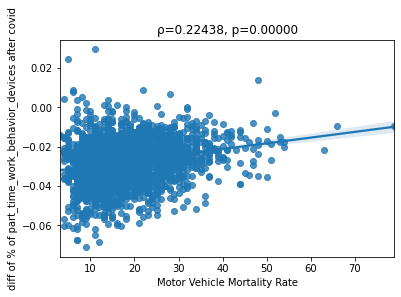

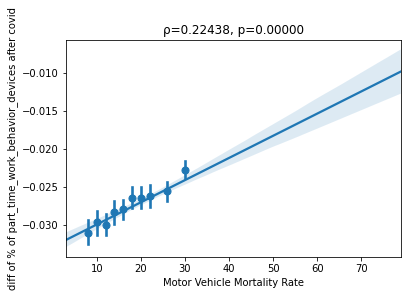

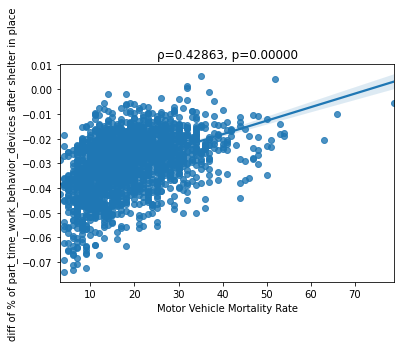

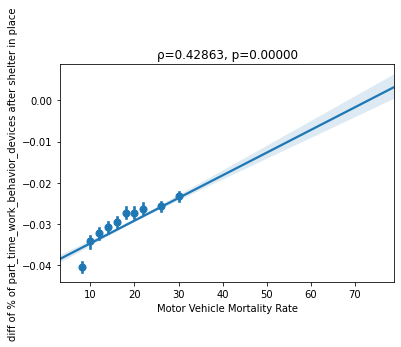

======= Violent Crime Rate
Since COVID19 (date varies from area to area), normality 51.74070, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.19797, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.23320, 0.00000 SIGNIFICANT
Since shelter in place, normality 111.28433, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.10949, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.12924, 0.00000 SIGNIFICANT


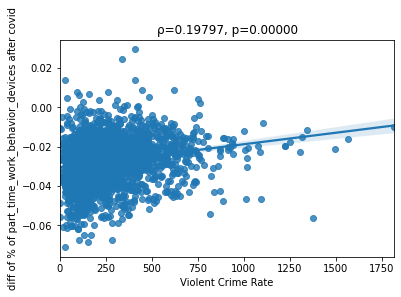

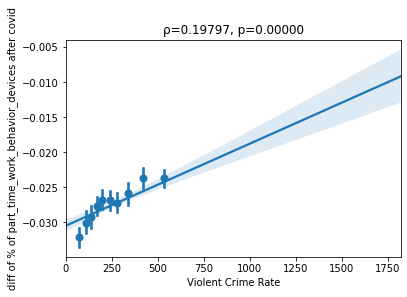

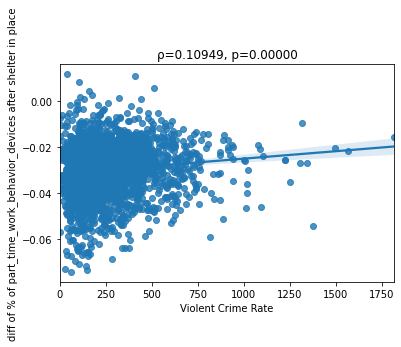

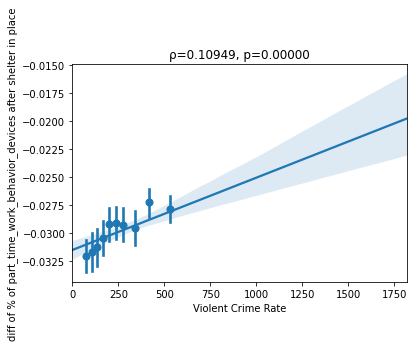

======= High School Graduation Rate
Since COVID19 (date varies from area to area), normality 51.71859, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.18311, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr -0.19356, 0.00000 SIGNIFICANT
Since shelter in place, normality 115.32276, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.10892, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.08398, 0.00003 SIGNIFICANT


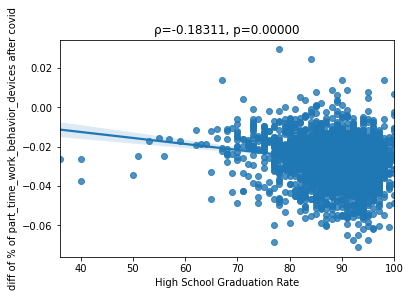

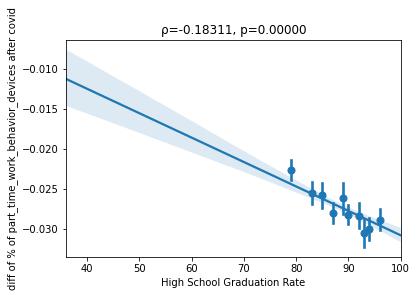

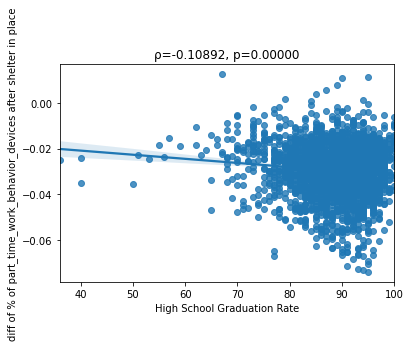

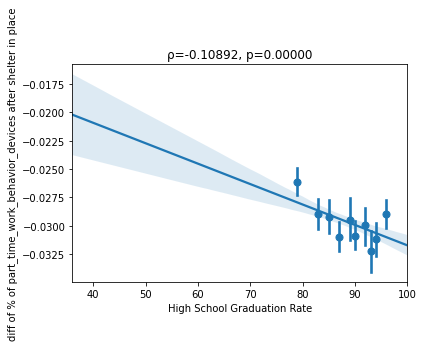

======= Age-Adjusted Death Rate
Since COVID19 (date varies from area to area), normality 51.62963, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.13042, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.12930, 0.00000 SIGNIFICANT
Since shelter in place, normality 111.86165, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.30810, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.29027, 0.00000 SIGNIFICANT


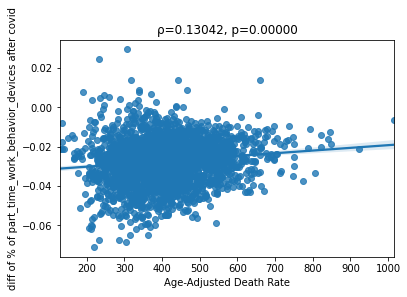

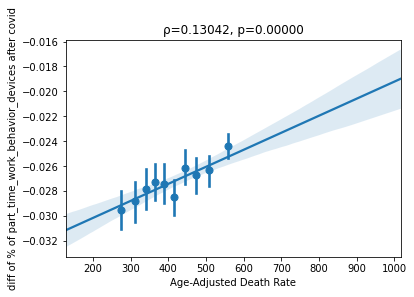

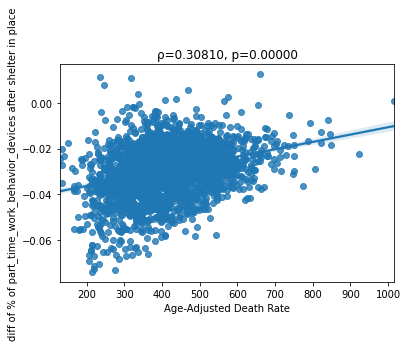

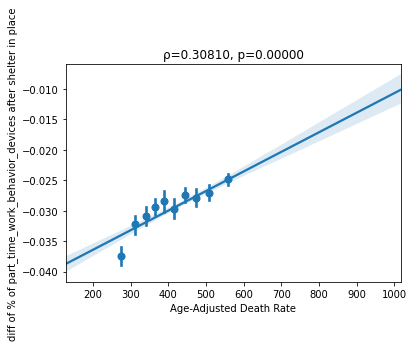

======= Primary Care Physicians Rate
Since COVID19 (date varies from area to area), normality 50.55159, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.04184, 0.04165 
Since COVID19 , spearmanr 0.03185, 0.12104 
Since shelter in place, normality 105.53092, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.13363, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.14720, 0.00000 SIGNIFICANT


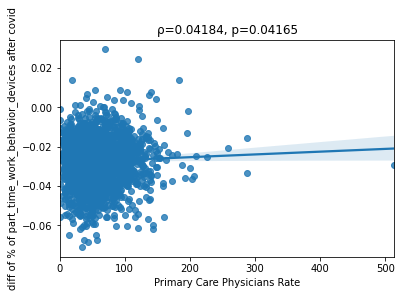

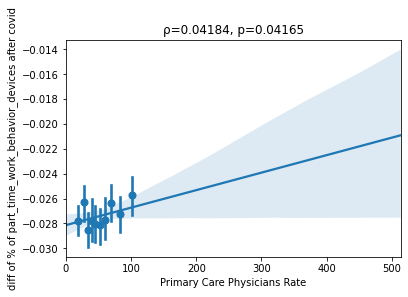

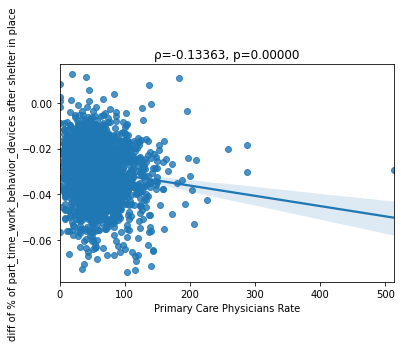

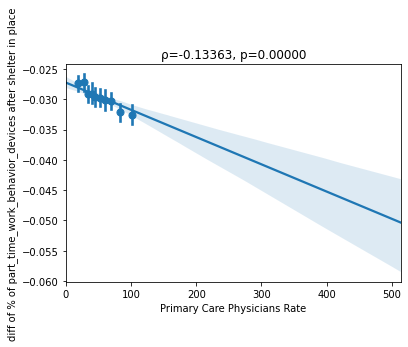

======= Mental Health Provider Rate
Since COVID19 (date varies from area to area), normality 49.61813, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.04293, 0.03748 
Since COVID19 , spearmanr -0.03138, 0.12835 
Since shelter in place, normality 105.90537, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.07248, 0.00044 SIGNIFICANT
Since shelter in place, spearmanr -0.19903, 0.00000 SIGNIFICANT


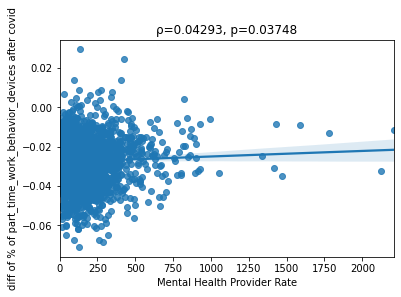

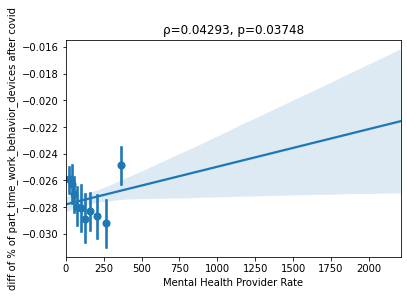

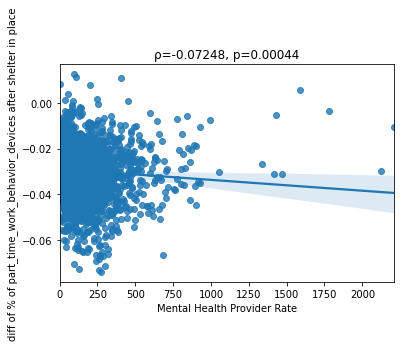

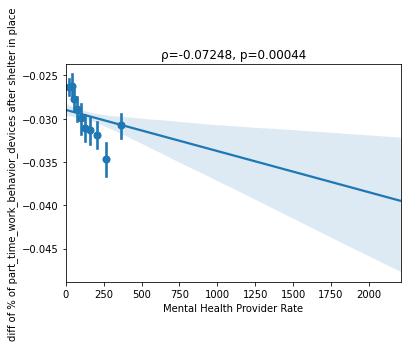

======= Segregation index
Since COVID19 (date varies from area to area), normality 49.57403, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.16710, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr -0.19398, 0.00000 SIGNIFICANT
Since shelter in place, normality 136.08527, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.23441, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.26419, 0.00000 SIGNIFICANT


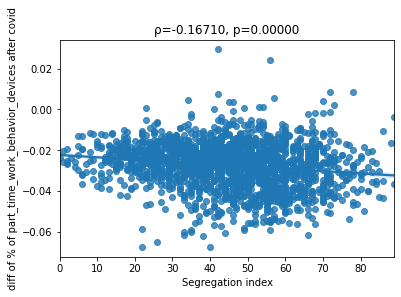

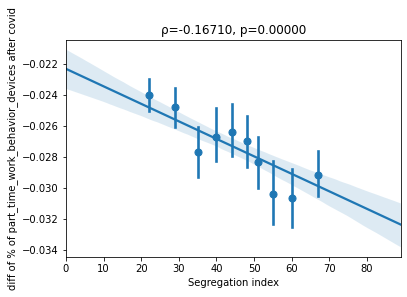

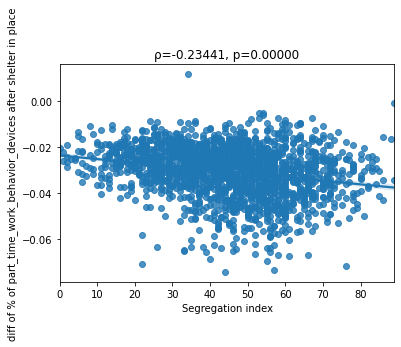

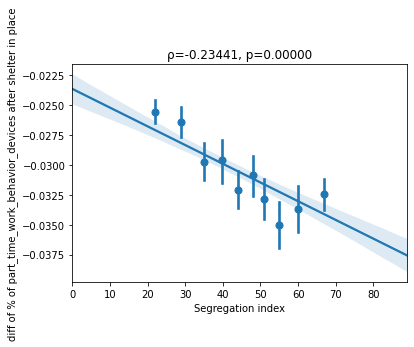

======= HIV Prevalence Rate
Since COVID19 (date varies from area to area), normality 47.08713, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.20482, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.25398, 0.00000 SIGNIFICANT
Since shelter in place, normality 115.19356, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.05909, 0.00957 SIGNIFICANT
Since shelter in place, spearmanr 0.09358, 0.00004 SIGNIFICANT


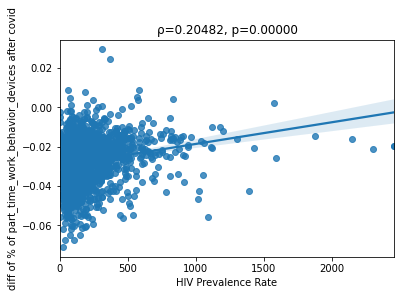

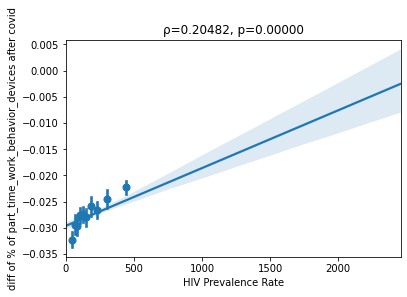

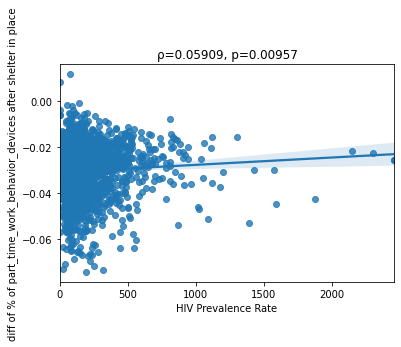

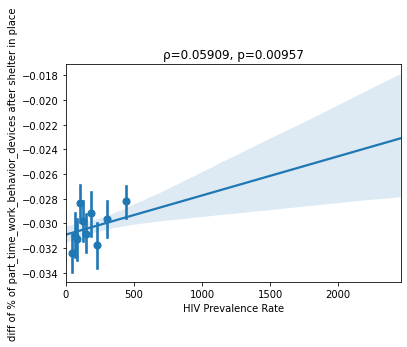

======= Dentist Rate
Since COVID19 (date varies from area to area), normality 46.10504, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.03529, 0.08432 
Since COVID19 , spearmanr 0.00911, 0.65589 
Since shelter in place, normality 99.42270, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.15320, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.18636, 0.00000 SIGNIFICANT


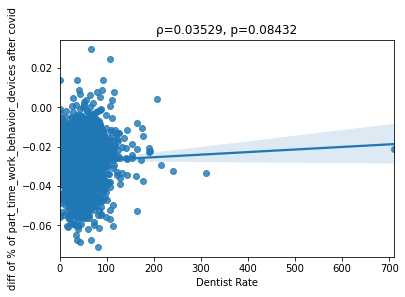

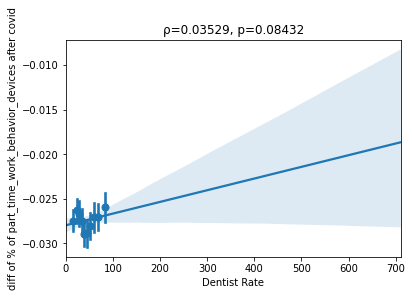

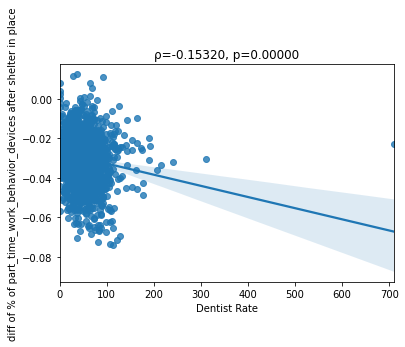

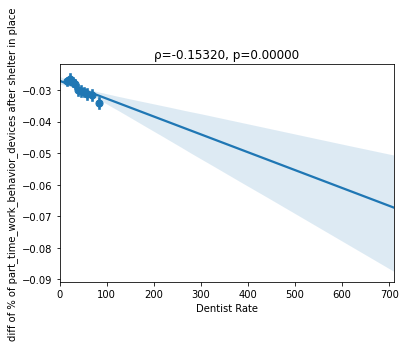

======= Firearm Fatalities Rate
Since COVID19 (date varies from area to area), normality 43.42293, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.33373, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.34323, 0.00000 SIGNIFICANT
Since shelter in place, normality 125.42890, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.51312, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.51741, 0.00000 SIGNIFICANT


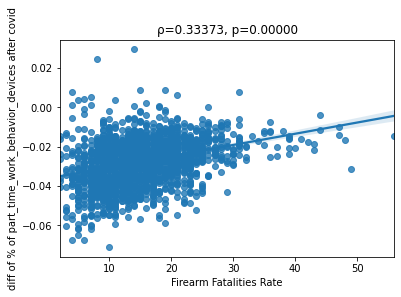

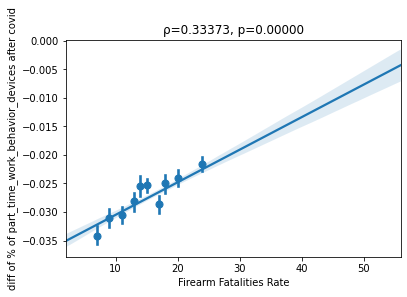

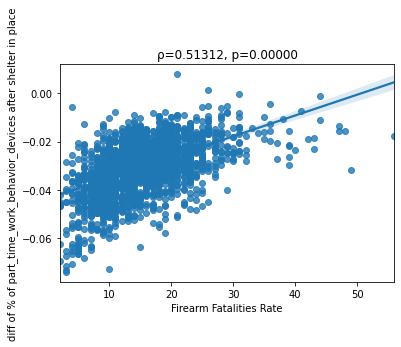

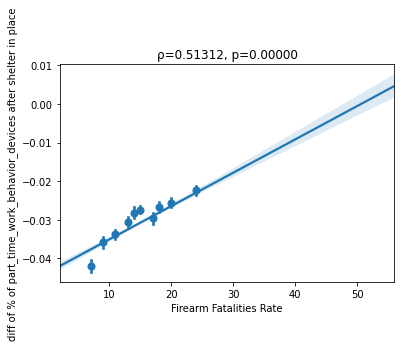

======= Juvenile Arrest Rate
Since COVID19 (date varies from area to area), normality 43.04062, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.14903, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.16611, 0.00000 SIGNIFICANT
Since shelter in place, normality 79.95454, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.23528, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.23511, 0.00000 SIGNIFICANT


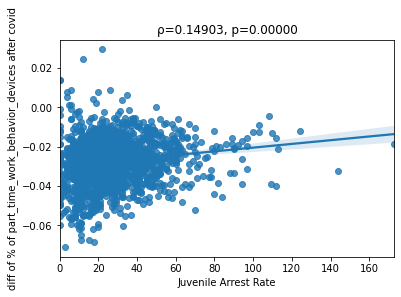

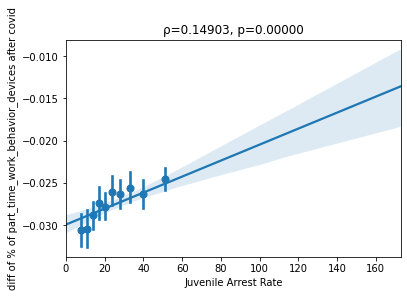

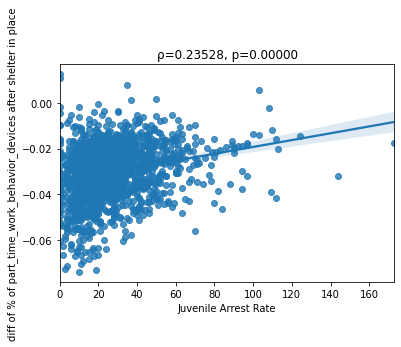

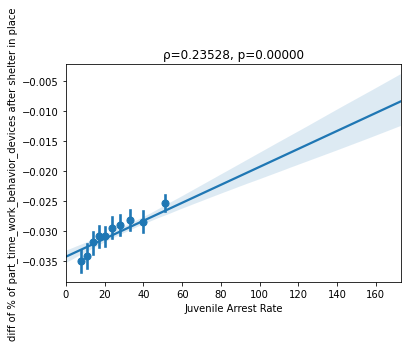

======= % Enrolled in Free or Reduced Lunch
Since COVID19 (date varies from area to area), normality 42.58825, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.31582, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.32399, 0.00000 SIGNIFICANT
Since shelter in place, normality 92.05414, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.41373, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.41490, 0.00000 SIGNIFICANT


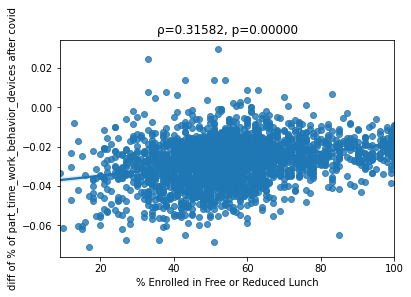

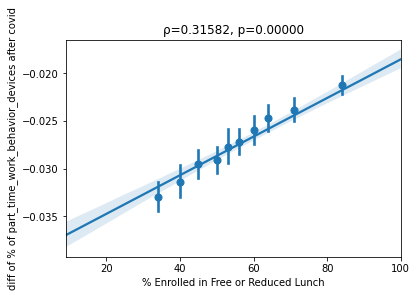

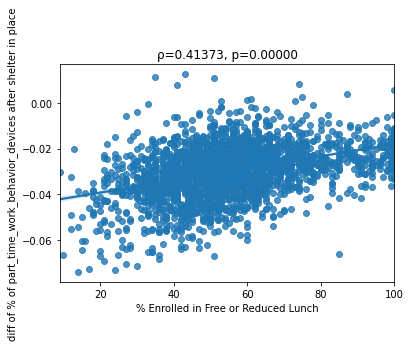

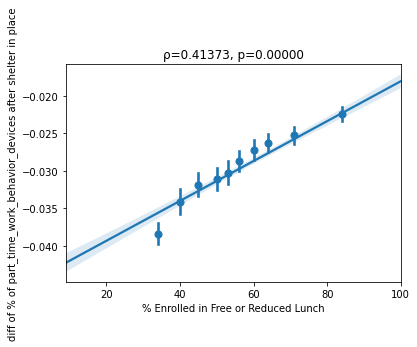

======= Suicide Rate (Age-Adjusted)
Since COVID19 (date varies from area to area), normality 41.22819, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.23536, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.20459, 0.00000 SIGNIFICANT
Since shelter in place, normality 108.77693, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.40972, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.38053, 0.00000 SIGNIFICANT


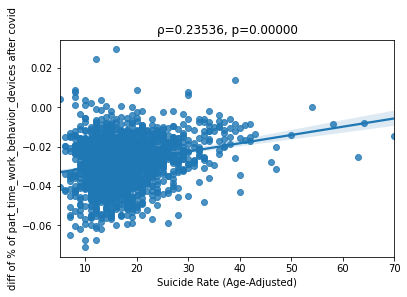

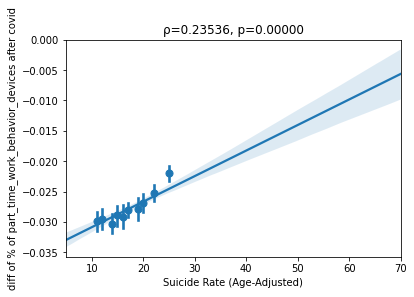

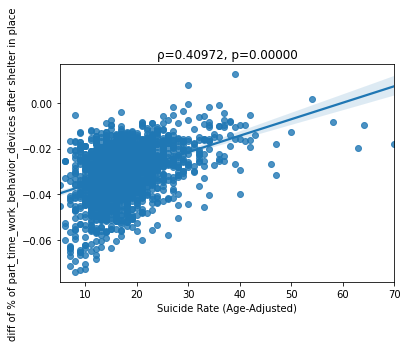

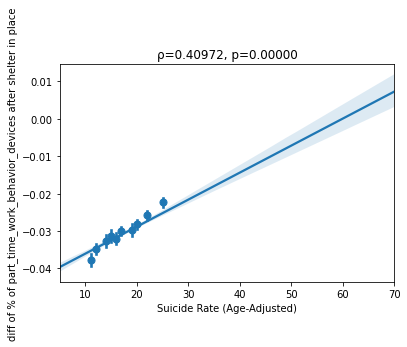

======= Average Grade Performance
Since COVID19 (date varies from area to area), normality 38.66362, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.19466, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr -0.21299, 0.00000 SIGNIFICANT
Since shelter in place, normality 63.69150, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.25137, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.26186, 0.00000 SIGNIFICANT


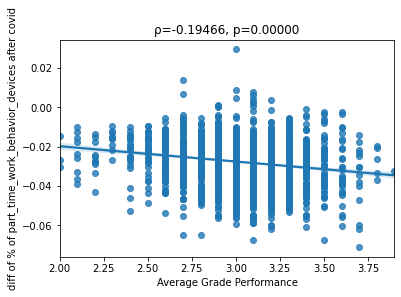

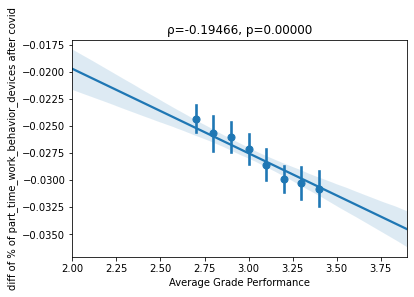

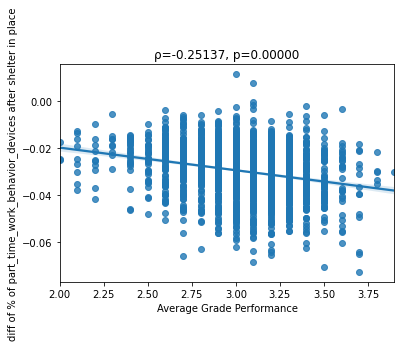

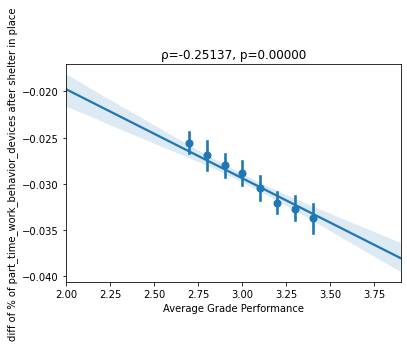

======= Average Grade Performance.1
Since COVID19 (date varies from area to area), normality 36.02230, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.15606, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr -0.17113, 0.00000 SIGNIFICANT
Since shelter in place, normality 67.02217, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.18915, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr -0.19760, 0.00000 SIGNIFICANT


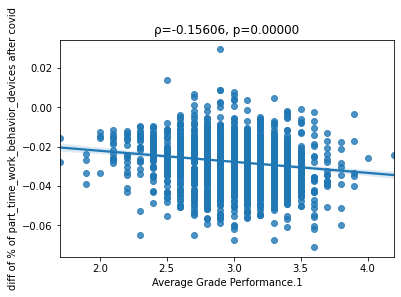

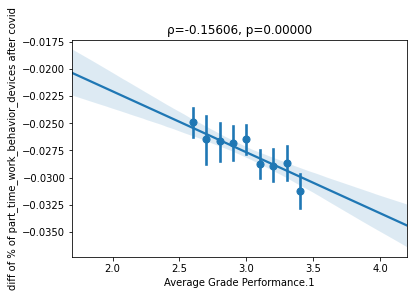

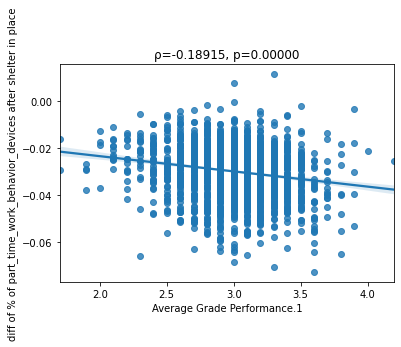

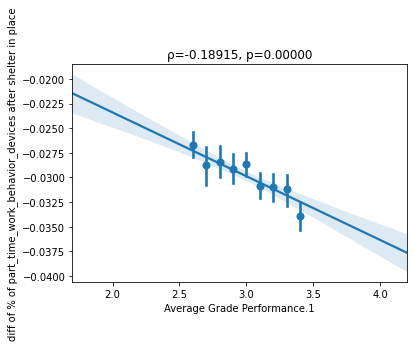

======= Drug Overdose Mortality Rate
Since COVID19 (date varies from area to area), normality 31.34769, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr -0.08458, 0.00077 SIGNIFICANT
Since COVID19 , spearmanr -0.09490, 0.00016 SIGNIFICANT
Since shelter in place, normality 108.20612, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr -0.00282, 0.91072 
Since shelter in place, spearmanr -0.00834, 0.74059 


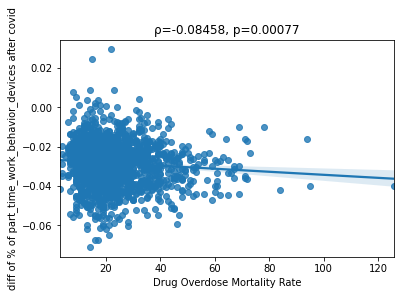

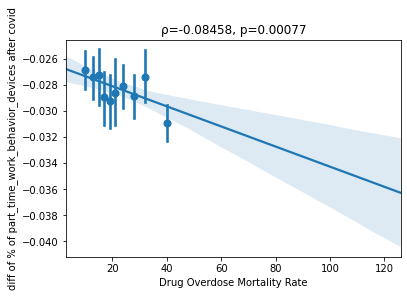

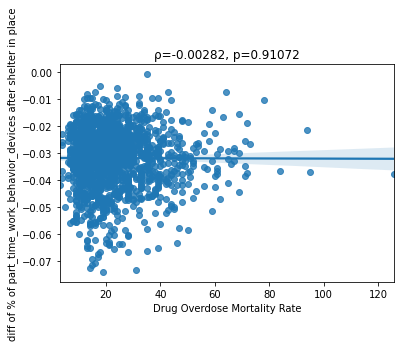

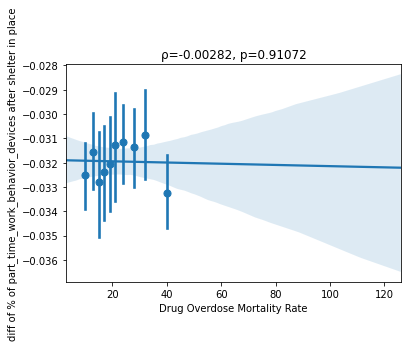

======= Child Mortality Rate
Since COVID19 (date varies from area to area), normality 31.34285, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.18078, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.18345, 0.00000 SIGNIFICANT
Since shelter in place, normality 106.41954, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.36627, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.35715, 0.00000 SIGNIFICANT


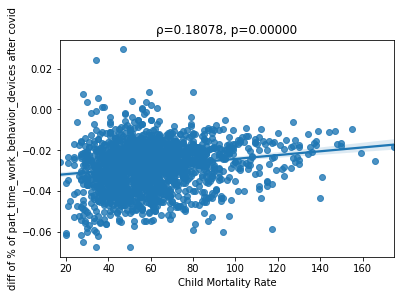

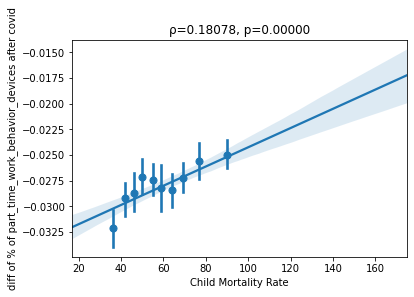

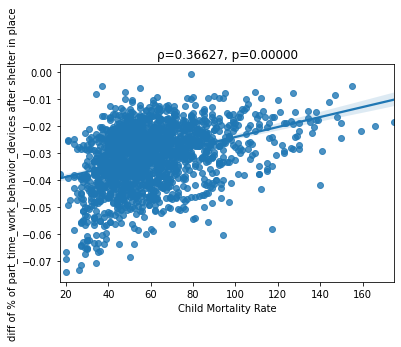

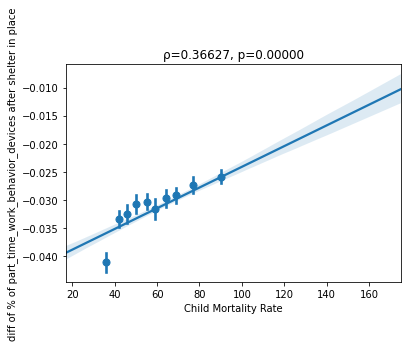

======= Homicide Rate
Since COVID19 (date varies from area to area), normality 29.76583, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.23761, 0.00000 SIGNIFICANT
Since COVID19 , spearmanr 0.26696, 0.00000 SIGNIFICANT
Since shelter in place, normality 86.27961, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.33319, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.39481, 0.00000 SIGNIFICANT


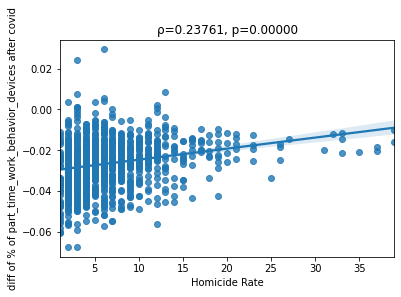

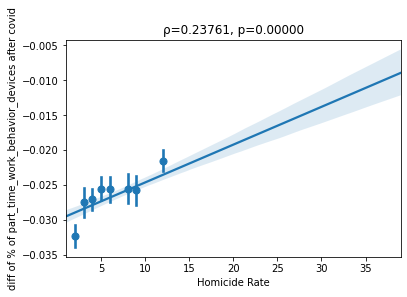

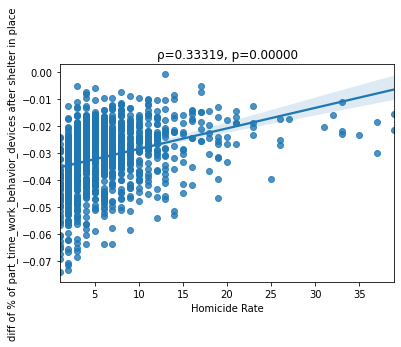

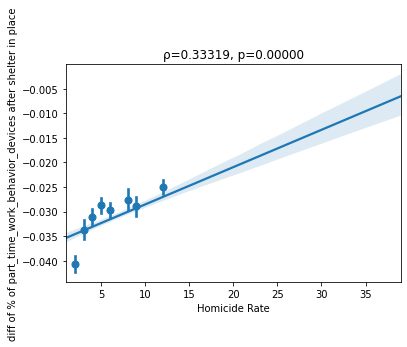

======= % Disconnected Youth
Since COVID19 (date varies from area to area), normality 25.24815, 0.00000 SIGNIFICANT
Since COVID19 , pearsonr 0.10418, 0.00022 SIGNIFICANT
Since COVID19 , spearmanr 0.13108, 0.00000 SIGNIFICANT
Since shelter in place, normality 77.87023, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.31413, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.37285, 0.00000 SIGNIFICANT


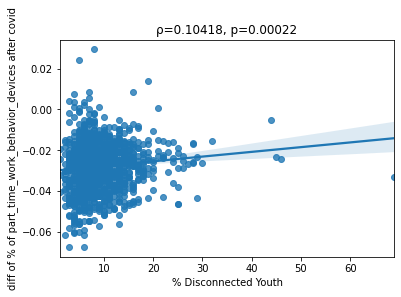

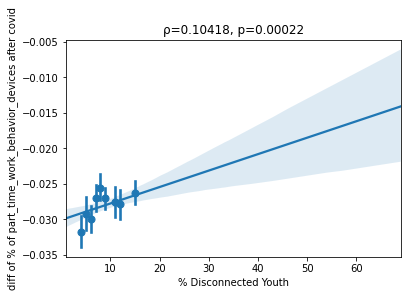

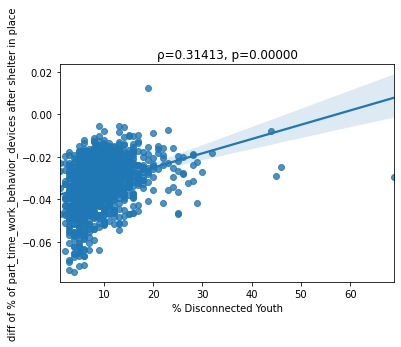

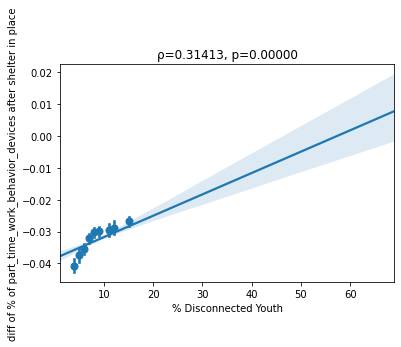

======= Infant Mortality Rate
Since COVID19 (date varies from area to area), normality 19.21609, 0.00007 SIGNIFICANT
Since COVID19 , pearsonr 0.09711, 0.00096 SIGNIFICANT
Since COVID19 , spearmanr 0.09803, 0.00086 SIGNIFICANT
Since shelter in place, normality 64.81721, 0.00000 SIGNIFICANT
Since shelter in place, pearsonr 0.31485, 0.00000 SIGNIFICANT
Since shelter in place, spearmanr 0.30938, 0.00000 SIGNIFICANT


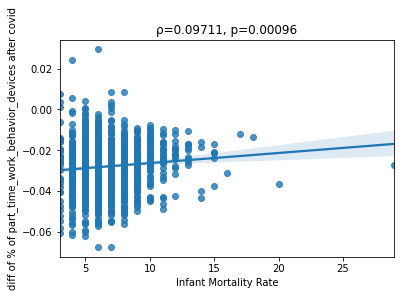

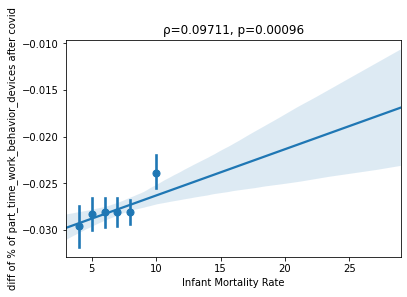

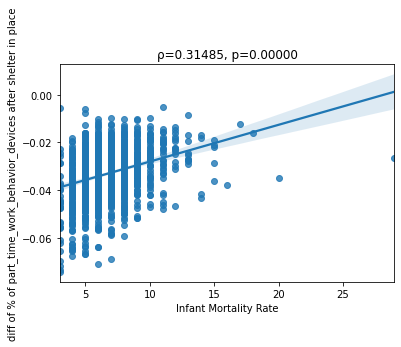

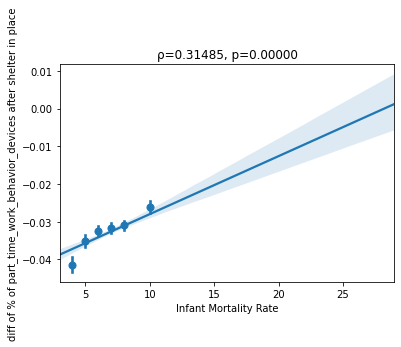

In [ ]:
analyzeVariable('part_time_work_behavior_devices')

# 4. look at linear coefficients with only a single variable at a time

In [ ]:
data = pd.read_csv("agg_social_dist")

In [ ]:
def printLinearCoefficientsOfVariable(columnName):
  after_first_case_data = data[(data['days_since_first_case'] >= 0) & (data['days_since_first_case'] <= 29)]
  after_first_case_data['percent_' + columnName] = after_first_case_data[columnName] / after_first_case_data['device_count']

  before_sip_data = data[(data['days_since_shelter'] >= -30) & (data['days_since_shelter'] <= -1)]
  before_sip_data['percent_' + columnName] = before_sip_data[columnName] / before_sip_data['device_count']

  after_sip_data = data[(data['days_since_shelter'] >= 0) & (data['days_since_shelter'] <= 29)]
  after_sip_data['percent_' + columnName] = after_sip_data[columnName] / after_sip_data['device_count']

  after_first_case_data = after_first_case_data.groupby(['cnamelong','county_code','state','state_code']).agg(
      percent_after_covid = ('percent_' + columnName ,'mean'),
      device_count_after_covid = ('device_count','mean')
  ).reset_index()

  before_sip_data = before_sip_data.groupby(['cnamelong','county_code','state','state_code']).agg(
      percent_before = ('percent_' + columnName ,'mean'),
      device_count_before = ('device_count','mean')
  ).reset_index()

  after_sip_data = after_sip_data.groupby(['cnamelong','county_code','state','state_code']).agg(
      percent_after_sip = ('percent_' + columnName ,'mean'),
      device_count_after_sip = ('device_count','mean')
  ).reset_index()

  merged_data = after_first_case_data.merge(before_sip_data, on=['cnamelong', 'county_code','state','state_code']).merge(after_sip_data, on=['cnamelong', 'county_code','state','state_code'])

  df_sip_county = merged_data

  after_first_case_data = data[(data['days_since_first_case'] >= 0) & (data['days_since_first_case'] <= 29)]
  after_first_case_data['percent_' + columnName] = after_first_case_data[columnName] / after_first_case_data['device_count']

  before_sip_data = data[(data['days_since_shelter'] >= -30) & (data['days_since_shelter'] <= -1)]
  before_sip_data['percent_' + columnName] = before_sip_data[columnName] / before_sip_data['device_count']

  after_sip_data = data[(data['days_since_shelter'] >= 0) & (data['days_since_shelter'] <= 29)]
  after_sip_data['percent_' + columnName] = after_sip_data[columnName] / after_sip_data['device_count']

  after_first_case_data = after_first_case_data.groupby(['state','state_code']).agg(
      percent_after_covid = ('percent_' + columnName ,'mean'),
      device_count_after_covid = ('device_count','mean')
  ).reset_index()

  before_sip_data = before_sip_data.groupby(['state','state_code']).agg(
      percent_before = ('percent_' + columnName ,'mean'),
      device_count_before = ('device_count','mean')
  ).reset_index()

  after_sip_data = after_sip_data.groupby(['state','state_code']).agg(
      percent_after_sip = ('percent_' + columnName ,'mean'),
      device_count_after_sip = ('device_count','mean')
  ).reset_index()

  merged_data = after_first_case_data.merge(before_sip_data, on=['state','state_code']).merge(after_sip_data, on=['state','state_code'])
  df_sip_state = merged_data



  df_chr_1 = pd.read_csv('2020 County Health Rankings Data - Ranked Measure Data.csv')
  df_chr_2 = pd.read_csv('2020 County Health Rankings Data - Additional Measure Data.csv')

  df_sip_county['diff_after_covid'] = df_sip_county.apply(lambda x: x['percent_after_covid'] - x['percent_before'], axis=1)
  df_sip_county['diff_after_sip'] = df_sip_county.apply(lambda x: x['percent_after_sip'] - x['percent_before'], axis=1)

  df_sip_state['diff_after_covid'] = df_sip_state.apply(lambda x: x['percent_after_covid'] - x['percent_before'], axis=1)
  df_sip_state['diff_after_sip'] = df_sip_state.apply(lambda x: x['percent_after_sip'] - x['percent_before'], axis=1)
  df_governors = pd.read_csv('us_states_governors.csv', encoding='latin-1')
  df_election = pd.read_csv('2016_US_County_Level_Presidential_Results.csv')

  df_election['political_party'] = df_election.apply(lambda x: 'Republican' if x['per_gop'] > x['per_dem'] else 'Democratic', axis=1)
  df_election['political_diff'] = df_election.apply(lambda x: x['per_dem'] - x['per_gop'], axis=1)

  df_chr = df_chr_1.merge(df_chr_2, on=['FIPS', 'State', 'County'])
  columns = ['FIPS', 'State', 'County', 'Population_y', 'Years of Potential Life Lost Rate', '% Fair or Poor Health', 
            'Average Number of Physically Unhealthy Days', 'Average Number of Mentally Unhealthy Days',
            '% Low Birthweight', '% Smokers', '% Adults with Obesity', 'Food Environment Index', 
            '% Physically Inactive', '% With Access to Exercise Opportunities', '% Excessive Drinking',
            '% Driving Deaths with Alcohol Involvement', 'Chlamydia Rate', 'Teen Birth Rate', '% Uninsured_x',
            'Primary Care Physicians Rate', 'Primary Care Physicians Ratio', 
            'Dentist Rate', 'Dentist Ratio', 'Mental Health Provider Rate', 'Mental Health Provider Ratio',
            'Preventable Hospitalization Rate', '% With Annual Mammogram', '% Vaccinated',
            'High School Graduation Rate', '% Some College', '% Unemployed', '% Children in Poverty',
            'Income Ratio', '% Single-Parent Households', 'Social Association Rate', 'Violent Crime Rate',
            'Injury Death Rate', 'Average Daily PM2.5', 'Presence of Water Violation', '% Severe Housing Problems',
            '% Drive Alone to Work', '% Long Commute - Drives Alone',
            'Life Expectancy', 'Age-Adjusted Death Rate', 'Child Mortality Rate',
            'Infant Mortality Rate', '% Frequent Physical Distress', '% Frequent Mental Distress',
            '% Adults with Diabetes', 'HIV Prevalence Rate', 
            '% Food Insecure', '% Limited Access to Healthy Foods',
            'Drug Overdose Mortality Rate', 'Motor Vehicle Mortality Rate',
            '% Insufficient Sleep', '% Uninsured_y', '% Uninsured.1',
            'Other Primary Care Provider Rate', 'Other Primary Care Provider Ratio','% Disconnected Youth',
            'Average Grade Performance', 'Average Grade Performance.1', 'Median Household Income', 
            '% Enrolled in Free or Reduced Lunch', 'Segregation index', 'Segregation Index', 'Homicide Rate',
            'Suicide Rate (Age-Adjusted)', 'Firearm Fatalities Rate',
            'Juvenile Arrest Rate', 'Average Traffic Volume per Meter of Major Roadways',
            '% Homeowners', '% Severe Housing Cost Burden', '% less than 18 years of age', '% 65 and over',
            '% Black', '% American Indian & Alaska Native', '% Asian', '% Native Hawaiian/Other Pacific Islander',
            '% Hispanic', '% Non-Hispanic White', '% Not Proficient in English', '% Female', '% Rural'
            ]
  df_chr = df_chr[columns]

  df_merged = df_sip_county.merge(df_governors, how='left', left_on='state_code', right_on='State Code')
  df_merged = df_merged.merge(df_chr, left_on='county_code', right_on='FIPS')
  df_merged = df_merged.merge(df_election, left_on='county_code', right_on='combined_fips')

  corr_columns = [
    'Population_y', 'Years of Potential Life Lost Rate', '% Fair or Poor Health', 
    'Average Number of Physically Unhealthy Days', 'Average Number of Mentally Unhealthy Days',
    '% Low Birthweight', '% Smokers', '% Adults with Obesity', 'Food Environment Index', 
    '% Physically Inactive', '% With Access to Exercise Opportunities', '% Excessive Drinking',
    '% Driving Deaths with Alcohol Involvement', 'Chlamydia Rate', 'Teen Birth Rate', '% Uninsured_x',
    'Primary Care Physicians Rate', 
    'Dentist Rate', 'Mental Health Provider Rate', 
    'Preventable Hospitalization Rate', '% With Annual Mammogram', '% Vaccinated',
    'High School Graduation Rate', '% Some College', '% Unemployed', '% Children in Poverty',
    'Income Ratio', '% Single-Parent Households', 'Social Association Rate', 'Violent Crime Rate',
    'Injury Death Rate', 'Average Daily PM2.5', '% Severe Housing Problems',
    '% Drive Alone to Work', '% Long Commute - Drives Alone',
    'Life Expectancy', 'Age-Adjusted Death Rate', 'Child Mortality Rate',
    'Infant Mortality Rate', '% Frequent Physical Distress', '% Frequent Mental Distress',
    '% Adults with Diabetes', 'HIV Prevalence Rate', 
    '% Food Insecure', '% Limited Access to Healthy Foods',
    'Drug Overdose Mortality Rate', 'Motor Vehicle Mortality Rate',
    '% Insufficient Sleep', '% Uninsured_y', '% Uninsured.1',
    'Other Primary Care Provider Rate', '% Disconnected Youth',
    'Average Grade Performance', 'Average Grade Performance.1', 'Median Household Income', 
    '% Enrolled in Free or Reduced Lunch', 'Segregation index', 'Segregation Index', 'Homicide Rate',
    'Suicide Rate (Age-Adjusted)', 'Firearm Fatalities Rate',
    'Juvenile Arrest Rate', 'Average Traffic Volume per Meter of Major Roadways',
    '% Homeowners', '% Severe Housing Cost Burden', '% less than 18 years of age', '% 65 and over',
    '% Black', '% American Indian & Alaska Native', '% Asian', '% Native Hawaiian/Other Pacific Islander',
    '% Hispanic', '% Non-Hispanic White', '% Not Proficient in English', '% Female', '% Rural', 'political_diff'
  ]

  from sklearn.linear_model import LinearRegression
  linear_coefficients = []

  
  for c in corr_columns:
      df_corr = df_merged[['State Code', 'cnamelong', 'FIPS', 'diff_after_covid', 'diff_after_sip', c]]
      df_corr = df_corr.dropna()
      
      # result[0] = variable name
      # result[1] = linear regression coefficient with respect to diff_after_covid
      # result[2] = linear regression coefficient with respect to diff_after_sip
      result= [c]
      X = [[x] for x in df_corr[c]]
      y = df_corr['diff_after_covid']
      reg = LinearRegression().fit(X, y)
      
      result.append([f'diff_after_covid_coef_with_{c}', reg.coef_])
      
      y = df_corr['diff_after_sip']
      reg = LinearRegression().fit(X, y)

      result.append([f'diff_after_sip_coef_with_{c}', reg.coef_])
      
      linear_coefficients.append(result)
  
  linear_coefficients = sorted(linear_coefficients, key = lambda x: abs(x[2][1]), reverse=True)
  for coeff_with_one_variable in linear_coefficients:
    print(f"{coeff_with_one_variable[0]}: coefficient with diff after covid: \
      {coeff_with_one_variable[1][1]}\n coefficient with diff after sip: \
      {coeff_with_one_variable[2][1]}")

In [ ]:
printLinearCoefficientsOfVariable('completely_home_device_count')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

political_diff: coefficient with diff after covid:       [0.0210076]
 coefficient with diff after sip:       [0.0538709]
Average Grade Performance: coefficient with diff after covid:       [0.03437302]
 coefficient with diff after sip:       [0.04392416]
Average Number of Physically Unhealthy Days: coefficient with diff after covid:       [-0.02012925]
 coefficient with diff after sip:       [-0.03287993]
Average Number of Mentally Unhealthy Days: coefficient with diff after covid:       [-0.01867378]
 coefficient with diff after sip:       [-0.0328137]
Average Grade Performance.1: coefficient with diff after covid:       [0.0261316]
 coefficient with diff after sip:       [0.03260846]
Food Environment Index: coefficient with diff after covid:       [0.0126577]
 coefficient with diff after sip:       [0.01801757]
% Frequent Mental Distress: coefficient with diff after covid:       [-0.00682174]
 coefficient with diff after sip:       [-0.01112251]
Income Ratio: coefficient with diff af

interestingly political_diff has the biggest linear coefficient, more divided politically leads to increase of difference in behavior to stay at home after shelter in place?

Of course this doesn't mean a whole lot because big linear coefficient, like pearson's r coefficien, only measures linear trend. it doesn't capture non-linear relationship.

In [ ]:
printLinearCoefficientsOfVariable('delivery_behavior_devices')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Average Grade Performance: coefficient with diff after covid:       [-0.00204694]
 coefficient with diff after sip:       [-0.00410215]
Average Grade Performance.1: coefficient with diff after covid:       [-0.00133928]
 coefficient with diff after sip:       [-0.00297979]
Average Number of Physically Unhealthy Days: coefficient with diff after covid:       [0.00118717]
 coefficient with diff after sip:       [0.00132532]
political_diff: coefficient with diff after covid:       [-0.00469554]
 coefficient with diff after sip:       [-0.00126647]
Food Environment Index: coefficient with diff after covid:       [-0.00086761]
 coefficient with diff after sip:       [-0.00120723]
Average Number of Mentally Unhealthy Days: coefficient with diff after covid:       [0.00044025]
 coefficient with diff after sip:       [0.0011414]
Income Ratio: coefficient with diff after covid:       [-0.00025459]
 coefficient with diff after sip:       [0.00105771]
% Low Birthweight: coefficient with diff afte

# 5. let's try a random forest, to see if it gives different importance factors than linear models

In [ ]:
data = pd.read_csv("agg_social_dist")

In [ ]:
def printRFCoeffsOfVariable(columnName):
  after_first_case_data = data[(data['days_since_first_case'] >= 0) & (data['days_since_first_case'] <= 29)]
  after_first_case_data['percent_' + columnName] = after_first_case_data[columnName] / after_first_case_data['device_count']

  before_sip_data = data[(data['days_since_shelter'] >= -30) & (data['days_since_shelter'] <= -1)]
  before_sip_data['percent_' + columnName] = before_sip_data[columnName] / before_sip_data['device_count']

  after_sip_data = data[(data['days_since_shelter'] >= 0) & (data['days_since_shelter'] <= 29)]
  after_sip_data['percent_' + columnName] = after_sip_data[columnName] / after_sip_data['device_count']

  after_first_case_data = after_first_case_data.groupby(['cnamelong','county_code','state','state_code']).agg(
      percent_after_covid = ('percent_' + columnName ,'mean'),
      device_count_after_covid = ('device_count','mean')
  ).reset_index()

  before_sip_data = before_sip_data.groupby(['cnamelong','county_code','state','state_code']).agg(
      percent_before = ('percent_' + columnName ,'mean'),
      device_count_before = ('device_count','mean')
  ).reset_index()

  after_sip_data = after_sip_data.groupby(['cnamelong','county_code','state','state_code']).agg(
      percent_after_sip = ('percent_' + columnName ,'mean'),
      device_count_after_sip = ('device_count','mean')
  ).reset_index()

  merged_data = after_first_case_data.merge(before_sip_data, on=['cnamelong', 'county_code','state','state_code']).merge(after_sip_data, on=['cnamelong', 'county_code','state','state_code'])

  df_sip_county = merged_data

  after_first_case_data = data[(data['days_since_first_case'] >= 0) & (data['days_since_first_case'] <= 29)]
  after_first_case_data['percent_' + columnName] = after_first_case_data[columnName] / after_first_case_data['device_count']

  before_sip_data = data[(data['days_since_shelter'] >= -30) & (data['days_since_shelter'] <= -1)]
  before_sip_data['percent_' + columnName] = before_sip_data[columnName] / before_sip_data['device_count']

  after_sip_data = data[(data['days_since_shelter'] >= 0) & (data['days_since_shelter'] <= 29)]
  after_sip_data['percent_' + columnName] = after_sip_data[columnName] / after_sip_data['device_count']

  after_first_case_data = after_first_case_data.groupby(['state','state_code']).agg(
      percent_after_covid = ('percent_' + columnName ,'mean'),
      device_count_after_covid = ('device_count','mean')
  ).reset_index()

  before_sip_data = before_sip_data.groupby(['state','state_code']).agg(
      percent_before = ('percent_' + columnName ,'mean'),
      device_count_before = ('device_count','mean')
  ).reset_index()

  after_sip_data = after_sip_data.groupby(['state','state_code']).agg(
      percent_after_sip = ('percent_' + columnName ,'mean'),
      device_count_after_sip = ('device_count','mean')
  ).reset_index()

  merged_data = after_first_case_data.merge(before_sip_data, on=['state','state_code']).merge(after_sip_data, on=['state','state_code'])
  df_sip_state = merged_data



  df_chr_1 = pd.read_csv('2020 County Health Rankings Data - Ranked Measure Data.csv')
  df_chr_2 = pd.read_csv('2020 County Health Rankings Data - Additional Measure Data.csv')

  df_sip_county['diff_after_covid'] = df_sip_county.apply(lambda x: x['percent_after_covid'] - x['percent_before'], axis=1)
  df_sip_county['diff_after_sip'] = df_sip_county.apply(lambda x: x['percent_after_sip'] - x['percent_before'], axis=1)

  df_sip_state['diff_after_covid'] = df_sip_state.apply(lambda x: x['percent_after_covid'] - x['percent_before'], axis=1)
  df_sip_state['diff_after_sip'] = df_sip_state.apply(lambda x: x['percent_after_sip'] - x['percent_before'], axis=1)
  df_governors = pd.read_csv('us_states_governors.csv', encoding='latin-1')
  df_election = pd.read_csv('2016_US_County_Level_Presidential_Results.csv')

  df_election['political_party'] = df_election.apply(lambda x: 'Republican' if x['per_gop'] > x['per_dem'] else 'Democratic', axis=1)
  df_election['political_diff'] = df_election.apply(lambda x: x['per_dem'] - x['per_gop'], axis=1)

  df_chr = df_chr_1.merge(df_chr_2, on=['FIPS', 'State', 'County'])
  columns = ['FIPS', 'State', 'County', 'Population_y', 'Years of Potential Life Lost Rate', '% Fair or Poor Health', 
            'Average Number of Physically Unhealthy Days', 'Average Number of Mentally Unhealthy Days',
            '% Low Birthweight', '% Smokers', '% Adults with Obesity', 'Food Environment Index', 
            '% Physically Inactive', '% With Access to Exercise Opportunities', '% Excessive Drinking',
            '% Driving Deaths with Alcohol Involvement', 'Chlamydia Rate', 'Teen Birth Rate', '% Uninsured_x',
            'Primary Care Physicians Rate', 'Primary Care Physicians Ratio', 
            'Dentist Rate', 'Dentist Ratio', 'Mental Health Provider Rate', 'Mental Health Provider Ratio',
            'Preventable Hospitalization Rate', '% With Annual Mammogram', '% Vaccinated',
            'High School Graduation Rate', '% Some College', '% Unemployed', '% Children in Poverty',
            'Income Ratio', '% Single-Parent Households', 'Social Association Rate', 'Violent Crime Rate',
            'Injury Death Rate', 'Average Daily PM2.5', 'Presence of Water Violation', '% Severe Housing Problems',
            '% Drive Alone to Work', '% Long Commute - Drives Alone',
            'Life Expectancy', 'Age-Adjusted Death Rate', 'Child Mortality Rate',
            'Infant Mortality Rate', '% Frequent Physical Distress', '% Frequent Mental Distress',
            '% Adults with Diabetes', 'HIV Prevalence Rate', 
            '% Food Insecure', '% Limited Access to Healthy Foods',
            'Drug Overdose Mortality Rate', 'Motor Vehicle Mortality Rate',
            '% Insufficient Sleep', '% Uninsured_y', '% Uninsured.1',
            'Other Primary Care Provider Rate', 'Other Primary Care Provider Ratio','% Disconnected Youth',
            'Average Grade Performance', 'Average Grade Performance.1', 'Median Household Income', 
            '% Enrolled in Free or Reduced Lunch', 'Segregation index', 'Segregation Index', 'Homicide Rate',
            'Suicide Rate (Age-Adjusted)', 'Firearm Fatalities Rate',
            'Juvenile Arrest Rate', 'Average Traffic Volume per Meter of Major Roadways',
            '% Homeowners', '% Severe Housing Cost Burden', '% less than 18 years of age', '% 65 and over',
            '% Black', '% American Indian & Alaska Native', '% Asian', '% Native Hawaiian/Other Pacific Islander',
            '% Hispanic', '% Non-Hispanic White', '% Not Proficient in English', '% Female', '% Rural'
            ]
  df_chr = df_chr[columns]

  df_merged = df_sip_county.merge(df_governors, how='left', left_on='state_code', right_on='State Code')
  df_merged = df_merged.merge(df_chr, left_on='county_code', right_on='FIPS')
  df_merged = df_merged.merge(df_election, left_on='county_code', right_on='combined_fips')


  from sklearn.ensemble import RandomForestRegressor
  X = df_merged[[
    'Population_y', 'Years of Potential Life Lost Rate', '% Fair or Poor Health', 
    'Average Number of Physically Unhealthy Days', 'Average Number of Mentally Unhealthy Days',
    '% Low Birthweight', '% Smokers', '% Adults with Obesity', 'Food Environment Index', 
    '% Physically Inactive', '% With Access to Exercise Opportunities', '% Excessive Drinking',
    '% Driving Deaths with Alcohol Involvement', 'Chlamydia Rate', 'Teen Birth Rate', '% Uninsured_x',
    'Primary Care Physicians Rate', 
    'Dentist Rate', 'Mental Health Provider Rate', 
    'Preventable Hospitalization Rate', '% With Annual Mammogram', '% Vaccinated',
    'High School Graduation Rate', '% Some College', '% Unemployed', '% Children in Poverty',
    'Income Ratio', '% Single-Parent Households', 'Social Association Rate', 'Violent Crime Rate',
    'Injury Death Rate', 'Average Daily PM2.5', '% Severe Housing Problems',
    '% Drive Alone to Work', '% Long Commute - Drives Alone',
    'Life Expectancy', 'Age-Adjusted Death Rate', 'Child Mortality Rate',
    'Infant Mortality Rate', '% Frequent Physical Distress', '% Frequent Mental Distress',
    '% Adults with Diabetes', 'HIV Prevalence Rate', 
    '% Food Insecure', '% Limited Access to Healthy Foods',
    'Drug Overdose Mortality Rate', 'Motor Vehicle Mortality Rate',
    '% Insufficient Sleep', '% Uninsured_y', '% Uninsured.1',
    'Other Primary Care Provider Rate', '% Disconnected Youth',
    'Average Grade Performance', 'Average Grade Performance.1', 'Median Household Income', 
    '% Enrolled in Free or Reduced Lunch', 'Segregation index', 'Segregation Index', 'Homicide Rate',
    'Suicide Rate (Age-Adjusted)', 'Firearm Fatalities Rate',
    'Juvenile Arrest Rate', 'Average Traffic Volume per Meter of Major Roadways',
    '% Homeowners', '% Severe Housing Cost Burden', '% less than 18 years of age', '% 65 and over',
    '% Black', '% American Indian & Alaska Native', '% Asian', '% Native Hawaiian/Other Pacific Islander',
    '% Hispanic', '% Non-Hispanic White', '% Not Proficient in English', '% Female', '% Rural', 'political_diff',
    'diff_after_sip'
  ]]
  X = X.dropna()
  print(X.shape)
  y = X['diff_after_sip']
  X.drop(['diff_after_sip'], axis = 1, inplace = True)
  regressor = RandomForestRegressor()
  regressor.fit(X, y)

  variables = [
    'Population_y', 'Years of Potential Life Lost Rate', '% Fair or Poor Health', 
    'Average Number of Physically Unhealthy Days', 'Average Number of Mentally Unhealthy Days',
    '% Low Birthweight', '% Smokers', '% Adults with Obesity', 'Food Environment Index', 
    '% Physically Inactive', '% With Access to Exercise Opportunities', '% Excessive Drinking',
    '% Driving Deaths with Alcohol Involvement', 'Chlamydia Rate', 'Teen Birth Rate', '% Uninsured_x',
    'Primary Care Physicians Rate', 
    'Dentist Rate', 'Mental Health Provider Rate', 
    'Preventable Hospitalization Rate', '% With Annual Mammogram', '% Vaccinated',
    'High School Graduation Rate', '% Some College', '% Unemployed', '% Children in Poverty',
    'Income Ratio', '% Single-Parent Households', 'Social Association Rate', 'Violent Crime Rate',
    'Injury Death Rate', 'Average Daily PM2.5', '% Severe Housing Problems',
    '% Drive Alone to Work', '% Long Commute - Drives Alone',
    'Life Expectancy', 'Age-Adjusted Death Rate', 'Child Mortality Rate',
    'Infant Mortality Rate', '% Frequent Physical Distress', '% Frequent Mental Distress',
    '% Adults with Diabetes', 'HIV Prevalence Rate', 
    '% Food Insecure', '% Limited Access to Healthy Foods',
    'Drug Overdose Mortality Rate', 'Motor Vehicle Mortality Rate',
    '% Insufficient Sleep', '% Uninsured_y', '% Uninsured.1',
    'Other Primary Care Provider Rate', '% Disconnected Youth',
    'Average Grade Performance', 'Average Grade Performance.1', 'Median Household Income', 
    '% Enrolled in Free or Reduced Lunch', 'Segregation index', 'Segregation Index', 'Homicide Rate',
    'Suicide Rate (Age-Adjusted)', 'Firearm Fatalities Rate',
    'Juvenile Arrest Rate', 'Average Traffic Volume per Meter of Major Roadways',
    '% Homeowners', '% Severe Housing Cost Burden', '% less than 18 years of age', '% 65 and over',
    '% Black', '% American Indian & Alaska Native', '% Asian', '% Native Hawaiian/Other Pacific Islander',
    '% Hispanic', '% Non-Hispanic White', '% Not Proficient in English', '% Female', '% Rural', 'political_diff'
  ]
  
  listOfimportances = regressor.feature_importances_
  for i, variable in enumerate(variables):
    if listOfimportances[i] >= 0.01:
      print(f"importance of {variable} to our prediction of y variable is {listOfimportances[i]}")

In [ ]:
printRFCoeffsOfVariable('completely_home_device_count')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

(382, 78)
importance of Population_y to our prediction of y variable is 0.03601125169053811
importance of Years of Potential Life Lost Rate to our prediction of y variable is 0.012388550182220969
importance of % Uninsured_x to our prediction of y variable is 0.08494156436976655
importance of % Vaccinated to our prediction of y variable is 0.013204490318667113
importance of Average Daily PM2.5 to our prediction of y variable is 0.010642261828941527
importance of Life Expectancy to our prediction of y variable is 0.03391594727019375
importance of Age-Adjusted Death Rate to our prediction of y variable is 0.02735369277625344
importance of % Uninsured_y to our prediction of y variable is 0.31811411713797316
importance of % Uninsured.1 to our prediction of y variable is 0.0192010056784739
importance of Firearm Fatalities Rate to our prediction of y variable is 0.10402097734476463
importance of Average Traffic Volume per Meter of Major Roadways to our prediction of y variable is 0.0128244337

We see that uninsured_y and uninsured_x has a very high importance score compared to every other variable based off our random forest model

In [ ]:
printRFCoeffsOfVariable('delivery_behavior_devices')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

(382, 78)
importance of Average Number of Physically Unhealthy Days to our prediction of y variable is 0.02775206010695977
importance of % Physically Inactive to our prediction of y variable is 0.010438869512815268
importance of % Uninsured_x to our prediction of y variable is 0.010613963248557845
importance of Primary Care Physicians Rate to our prediction of y variable is 0.011325243739366764
importance of Average Daily PM2.5 to our prediction of y variable is 0.03996390853353136
importance of Age-Adjusted Death Rate to our prediction of y variable is 0.02526650441437001
importance of % Frequent Physical Distress to our prediction of y variable is 0.021235584296217618
importance of Motor Vehicle Mortality Rate to our prediction of y variable is 0.013712413513501158
importance of % Uninsured_y to our prediction of y variable is 0.5999440219031938
importance of % Female to our prediction of y variable is 0.011550701385470796


In [ ]:
printRFCoeffsOfVariable('part_time_work_behavior_devices')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

(382, 78)
importance of Population_y to our prediction of y variable is 0.019276256740783967
importance of % Excessive Drinking to our prediction of y variable is 0.012109482836882592
importance of % Uninsured_x to our prediction of y variable is 0.2887103597148312
importance of Injury Death Rate to our prediction of y variable is 0.010232703249228547
importance of Average Daily PM2.5 to our prediction of y variable is 0.03310258018082471
importance of Motor Vehicle Mortality Rate to our prediction of y variable is 0.013321182122560015
importance of % Uninsured_y to our prediction of y variable is 0.21526502582853957
importance of Firearm Fatalities Rate to our prediction of y variable is 0.045957214241641016
importance of Juvenile Arrest Rate to our prediction of y variable is 0.04914711342329309
importance of % Asian to our prediction of y variable is 0.015828697751080364
importance of political_diff to our prediction of y variable is 0.011081040149080693


Note that all these importance scores that random forest spits out are about the influence of independent variables over response variable. They say nothing about the direction of influence.

# 6. correlation analysis between independent variables

In [ ]:
df_merged = pd.read_csv("merged_data.csv")

In [ ]:
df_independent_variables = df_merged.drop(['state_code', 'cnamelong', 'county_code', \
                                           'state','percent_completely_home_device_after_covid',\
                                           'device_count_after_covid','percent_completely_home_device_before',\
                                           'device_count_before', 'percent_completely_home_device_after_sip',\
                                           'device_count_after_sip', 'diff_after_covid', 'diff_after_sip',\
                                           'State Code', 'State Name', 'Governor', 'Party', \
                                           'Date', 'Shelter at home begins', 'Shelter in place ends',\
                                           'Reopen', 'FIPS', 'State','County', 'Unnamed: 0',\
                                           'state_abbr', 'county_name', 'combined_fips'], axis = 1)

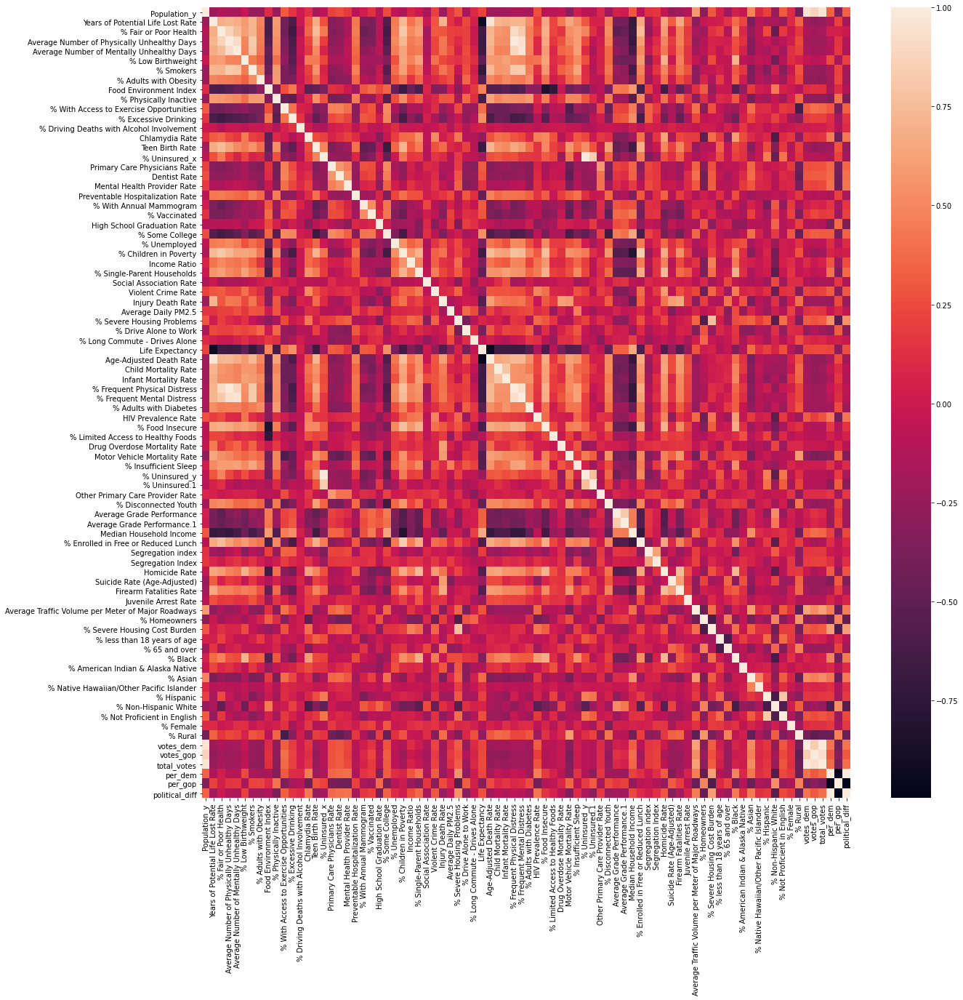

In [ ]:
plt.figure(figsize=(20,20))
sns.heatmap(df_independent_variables.corr())

We can see there are like 90 variables and the heatmap is too cluttered to see interesting things. Let's filter out the cells that have less than 0.5 correlation in absolute value. Then the cells left are the ones that have really strong correlation.

In [ ]:
# put correlation numbers into a matrix
independent_variables_matrix = df_independent_variables.corr()

In [ ]:
# zero out the correlations that are < 0.5 in absolute value
independent_variables_matrix[np.abs(independent_variables_matrix) <.5] = 0

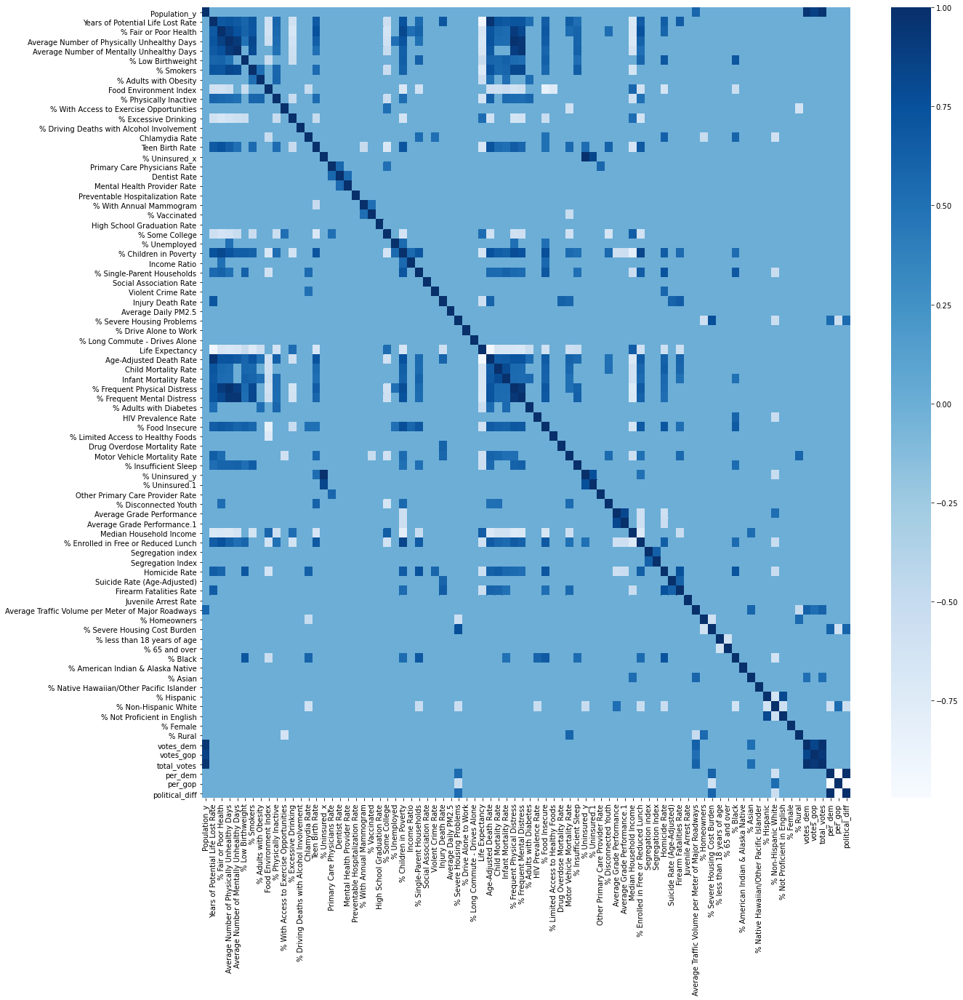

In [ ]:
# plot correlation in seaborn heatmap
plt.figure(figsize = (20,20))
sns.heatmap(independent_variables_matrix, cmap = 'Blues')

We can see from the above graph that \\
1. total population has strong positive correlation with votes of democrats and total votes, which totally makes sense.
2. % of poor health population correlates positively with homicide rate and % Enrolled in Free or Reduced Lunch, correlates negatively with Median household income.

It still is too cluttered, let's see some specific variables' correlations with other variables

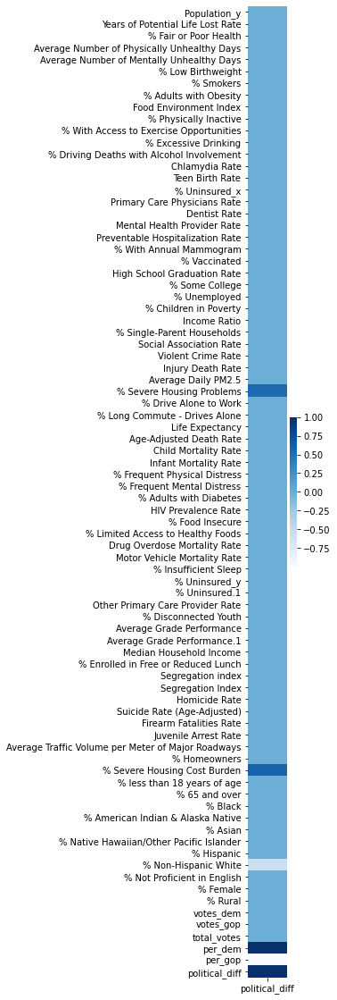

In [ ]:
# look at political difference's correlation with other variables
plt.figure(figsize = (1, 20))
sns.heatmap(independent_variables_matrix['political_diff'].to_frame(), cmap = 'Blues')

we see that political difference is positivele correlated with severe housing problem and percentage of democrats and negatively correlated with % of whites. So when there are a lot of whites in a community, there tends to be less political difference? that is interesting.

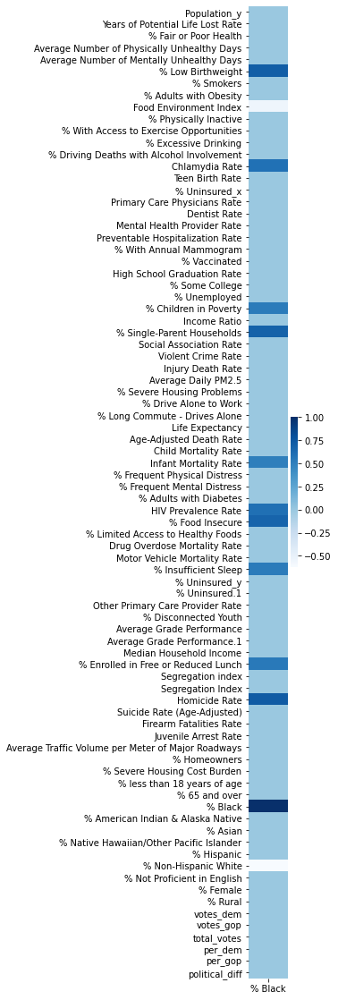

In [ ]:
# look at % blacks's correlation with other variables
plt.figure(figsize = (1, 20))
sns.heatmap(independent_variables_matrix['% Black'].to_frame(), cmap = 'Blues')

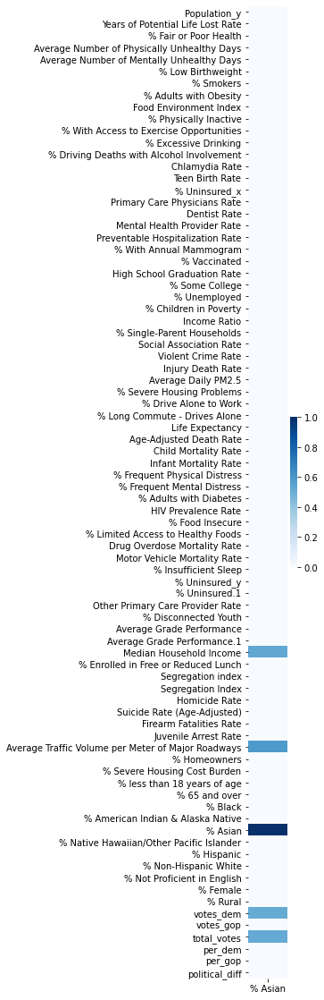

In [ ]:
# look at % asians's correlation with other variables
plt.figure(figsize = (1, 20))
sns.heatmap(independent_variables_matrix['% Asian'].to_frame(), cmap = 'Blues')

the more asian in a community, the higher the median household income, the more the democrate votes

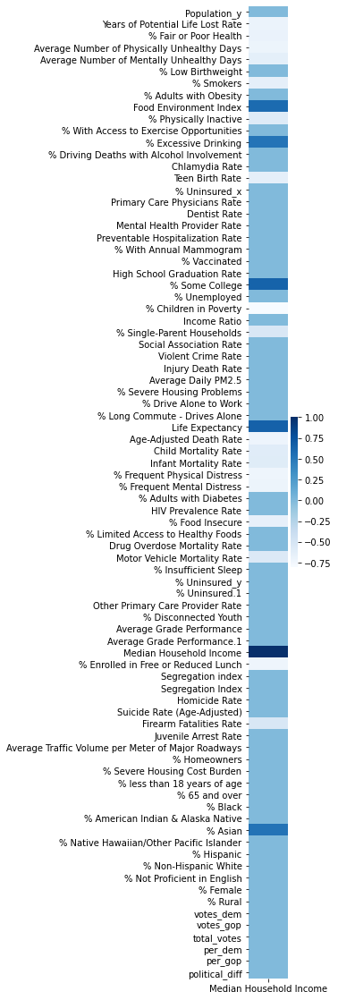

In [ ]:
# look at median household income's correlation with other variables
plt.figure(figsize = (1, 20))
sns.heatmap(independent_variables_matrix['Median Household Income'].to_frame(), cmap = 'Blues')

We can see median income is correlated with a ton of other variables like life expectancy, child mortatlity rate, % children in poverty ...

We can see from the above graph that % black in a community is positvely correlated (> 0.5 correlation) withhomicide rate, % enrolled in free lunch, % insufficient sleep, % food insecure, ... This means generally black community really is not well supported compared to white

Let's print out all the variables which have > 0.5 correlation coefficient with each other, directly from the matrix.

In [ ]:
series = independent_variables_matrix.iloc[0,:]

In [ ]:
# the vairables' names
for i in series.axes[0]:
  print(i)

Population_y
Years of Potential Life Lost Rate
% Fair or Poor Health
Average Number of Physically Unhealthy Days
Average Number of Mentally Unhealthy Days
% Low Birthweight
% Smokers
% Adults with Obesity
Food Environment Index
% Physically Inactive
% With Access to Exercise Opportunities
% Excessive Drinking
% Driving Deaths with Alcohol Involvement
Chlamydia Rate
Teen Birth Rate
% Uninsured_x
Primary Care Physicians Rate
Dentist Rate
Mental Health Provider Rate
Preventable Hospitalization Rate
% With Annual Mammogram
% Vaccinated
High School Graduation Rate
% Some College
% Unemployed
% Children in Poverty
Income Ratio
% Single-Parent Households
Social Association Rate
Violent Crime Rate
Injury Death Rate
Average Daily PM2.5
% Severe Housing Problems
% Drive Alone to Work
% Long Commute - Drives Alone
Life Expectancy
Age-Adjusted Death Rate
Child Mortality Rate
Infant Mortality Rate
% Frequent Physical Distress
% Frequent Mental Distress
% Adults with Diabetes
HIV Prevalence Rate
% F

In [ ]:
independent_variables_matrix.shape

(82, 82)

In [ ]:
# if i and j are correlated, j and i are correlated as well,
# don't want to print extraneous things 
setOfVariables = set()

for i in range(82):
  for j in range(82):
    if abs(independent_variables_matrix.iloc[i, j]) >= 0.5 and i != j and (i, j) not in setOfVariables and (j, i) not in setOfVariables:
      print(f"{series.axes[0][i]} and {series.axes[0][j]} have correlation {independent_variables_matrix.iloc[i, j]}")
      setOfVariables.add((i, j))

Population_y and Average Traffic Volume per Meter of Major Roadways have correlation 0.581376117369103
Population_y and votes_dem have correlation 0.9543421665947023
Population_y and votes_gop have correlation 0.8733813140067428
Population_y and total_votes have correlation 0.9628298929495839
Years of Potential Life Lost Rate and % Fair or Poor Health have correlation 0.685293652717815
Years of Potential Life Lost Rate and Average Number of Physically Unhealthy Days have correlation 0.711839083810156
Years of Potential Life Lost Rate and Average Number of Mentally Unhealthy Days have correlation 0.6731156755417783
Years of Potential Life Lost Rate and % Low Birthweight have correlation 0.5915234590302779
Years of Potential Life Lost Rate and % Smokers have correlation 0.7143986088636453
Years of Potential Life Lost Rate and Food Environment Index have correlation -0.5943511383102765
Years of Potential Life Lost Rate and % Physically Inactive have correlation 0.5940253031210568
Years of

# 7. linear regression with set of not highly dependent variables

From analysis above we see many variables are highly correlated. Median household income is particularly correlated with a lot of other stuff like % of whites and % of blacks. Here we are going to choose some varaibles that are not as highly correlated to do linear analysis

In [ ]:
# let's look at what variables we have again
series.axes[0]

Index(['Population_y', 'Years of Potential Life Lost Rate',
       '% Fair or Poor Health', 'Average Number of Physically Unhealthy Days',
       'Average Number of Mentally Unhealthy Days', '% Low Birthweight',
       '% Smokers', '% Adults with Obesity', 'Food Environment Index',
       '% Physically Inactive', '% With Access to Exercise Opportunities',
       '% Excessive Drinking', '% Driving Deaths with Alcohol Involvement',
       'Chlamydia Rate', 'Teen Birth Rate', '% Uninsured_x',
       'Primary Care Physicians Rate', 'Dentist Rate',
       'Mental Health Provider Rate', 'Preventable Hospitalization Rate',
       '% With Annual Mammogram', '% Vaccinated',
       'High School Graduation Rate', '% Some College', '% Unemployed',
       '% Children in Poverty', 'Income Ratio', '% Single-Parent Households',
       'Social Association Rate', 'Violent Crime Rate', 'Injury Death Rate',
       'Average Daily PM2.5', '% Severe Housing Problems',
       '% Drive Alone to Work', '% Long 

The variables we pick:
1. Political stance - per_dem (percent of democrats) - correlated with per_gop
2. Median Household Income
3. % Asian  
4. % 65 and over
5. % less than 18 years of age
6. % Rural
7. % Some College


Now let's do linear regression with these variables

In [ ]:
df_merged = pd.read_csv("merged_data.csv")

In [ ]:
df_merged.shape

(2455, 117)

In [ ]:
df_merged.isnull().values.any()

True

There are null values....

In [ ]:
df_merged = df_merged[['per_dem', 'Median Household Income', '% Asian', '% 65 and over',\
                       '% less than 18 years of age', '% Rural', '% Some College',\
                       'percent_completely_home_device_after_sip', 'diff_after_sip']]

In [ ]:
# drop any rows that have nulls
df_merged.dropna(inplace = True)

In [ ]:
df_merged.shape

(2453, 9)

So we deleted 2 rows, not a big deal

In [ ]:
X = df_merged[['per_dem', 'Median Household Income', '% Asian', '% 65 and over',\
               '% less than 18 years of age', '% Rural', '% Some College']]

In [ ]:
y = df_merged['percent_completely_home_device_after_sip']

In [ ]:
y.shape

(2453,)

In [ ]:
X.shape

(2453, 7)

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
regressor = LinearRegression()

In [ ]:
regressor.fit(X,y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
regressor.score(X, y) # how strong is r^2 of linear regression

0.6119156600973906

In [ ]:
regressor.coef_

array([ 7.64304572e-02,  1.96098478e-06,  6.72057323e-04,  3.18473762e-03,
       -2.52964344e-04, -4.92308120e-04,  4.07729268e-04])

let's look at what these coefficients correspond to again:
1. Political stance - per_dem (percent of democrats) - correlated with per_gop
2. Median Household Income
3. % Asian  
4. % 65 and over
5. % less than 18 years of age
6. % Rural
7. % Some College
- So we can see that percent of democrats has highest positive influence over % of stay at home devices after shelter in place relative to other variables. % 65 and over is the next most influencial positive factor, which makes sense. If there are more old people in a county, people stay at home more because they are most susceptible to the disease.
- % of less than 18 years of age and % rural has negative influence over stay at home %, which makes sense. Young people like to go out more. Rural areas don't have much influence from virus. 
- But these two negative influences are overpowered by the two positive influnces above. The positive influences mentioned above are 10 - 100 times overpowerring these two negative influences.
- Note that these are all linear relationships. Don't know if more complex nonlinear relations are in play here that we are not seeing in linear models

Now let's do the same linear regression model with difference in percentage of stay at home devices before and after shelter in place rather than with % after shelter in place

In [ ]:
y = df_merged['diff_after_sip']

In [ ]:
regressor.fit(X,y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
regressor.score(X, y) # how strong is r^2 of linear regression

0.4800113296437453

In [ ]:
regressor.coef_

array([ 4.10897578e-02,  1.35298016e-06,  1.23189992e-03,  8.56638564e-04,
       -6.54436896e-04, -1.56702744e-04,  5.45171439e-04])

pretty much the same result, but in this context % asian is more important positive factor than % 65 and over, interesting

Now let's try linear models with the important variables. See how that goes

In [ ]:
X = df_merged[['per_dem', '% Asian']]

In [ ]:
regressor.fit(X,y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
regressor.score(X, y)

0.24160569507603957

In [ ]:
regressor.coef_

array([0.05390642, 0.00568302])

let's try with the least important variables

In [ ]:
X = df_merged[['Median Household Income', '% 65 and over',\
               '% less than 18 years of age', '% Rural', '% Some College']]

In [ ]:
regressor.fit(X, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
regressor.score(X, y)

0.45696424899402294

In [ ]:
regressor.coef_

array([ 1.42879124e-06,  4.18052684e-04, -1.42993258e-03, -2.68478747e-04,
        6.00135708e-04])

It is interesting that linear model with a lot of least important variables makes it a good explanatory model - r^2 = 0.457! > 0.24 from linear model with 2 of most important variables

Let's just use Median household income as our single variable and see what happens

In [ ]:
X = df_merged[['Median Household Income']]

In [ ]:
regressor.fit(X, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
regressor.score(X, y)

0.3931585777584774

In [ ]:
regressor.coef_

array([1.90939755e-06])

Amazingly it has super high r^2! but it has low linear coefficient

Let's try it without median house income

In [ ]:
X = df_merged[['% 65 and over', '% less than 18 years of age', '% Rural',\
               '% Some College']]

In [ ]:
regressor.fit(X, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
regressor.score(X, y)

0.3365801647019747

It goes down from r^2 being 0.45 to r^2 of 0.34 if we delete median household income in the variables.

In [ ]:
df_merged

,per_dem,Median Household Income,% Asian,% 65 and over,% less than 18 years of age,% Rural,% Some College,percent_completely_home_device_after_sip,diff_after_sip
0,0.346140,42412.0,0.4,21.8,20.1,78.6,53,0.289275,0.037992
1,0.205872,40484.0,0.3,15.3,25.8,51.7,44,0.277490,0.080516
2,0.427610,42879.0,0.8,23.6,20.5,100.0,45,0.337730,0.086438
3,0.386917,66827.0,2.8,14.4,23.8,5.5,74,0.406879,0.152610
4,0.160792,37392.0,0.4,18.6,20.3,75.5,51,0.299196,0.064261
...,...,...,...,...,...,...,...,...,...
2450,0.377159,38912.0,0.4,15.2,27.3,100.0,47,0.307165,0.058760
2451,0.449864,44116.0,1.6,18.8,25.2,10.4,55,0.380388,0.071569
2452,0.150300,53253.0,0.5,18.5,27.0,64.9,63,0.313770,0.070334
2453,0.656031,33160.0,0.3,13.0,33.2,23.5,38,0.340662,0.109734


# 8. linear regression with all variables

In [ ]:
df_merged = pd.read_csv("merged_data.csv")

In [ ]:
df_merged = df_merged._get_numeric_data()

In [ ]:
df_merged.dropna(inplace = True)

In [ ]:
df_merged.shape

(382, 95)

we go from 2500 ish rows to 400 rows after we drop the rows that have any null values.. Although we cannot trust our following analysis that much since data size dramatically decreased, let's still see what happens if we plug it into linear regression model

In [ ]:
df_merged.iloc[:,11:]

,Population_y,Years of Potential Life Lost Rate,% Fair or Poor Health,Average Number of Physically Unhealthy Days,Average Number of Mentally Unhealthy Days,% Low Birthweight,% Smokers,% Adults with Obesity,Food Environment Index,% Physically Inactive,% With Access to Exercise Opportunities,% Excessive Drinking,% Driving Deaths with Alcohol Involvement,Chlamydia Rate,Teen Birth Rate,% Uninsured_x,Primary Care Physicians Rate,Dentist Rate,Mental Health Provider Rate,Preventable Hospitalization Rate,% With Annual Mammogram,% Vaccinated,High School Graduation Rate,% Some College,% Unemployed,% Children in Poverty,Income Ratio,% Single-Parent Households,Social Association Rate,Violent Crime Rate,Injury Death Rate,Average Daily PM2.5,% Severe Housing Problems,% Drive Alone to Work,% Long Commute - Drives Alone,Life Expectancy,Age-Adjusted Death Rate,Child Mortality Rate,Infant Mortality Rate,% Frequent Physical Distress,...,% Limited Access to Healthy Foods,Drug Overdose Mortality Rate,Motor Vehicle Mortality Rate,% Insufficient Sleep,% Uninsured_y,% Uninsured.1,Other Primary Care Provider Rate,% Disconnected Youth,Average Grade Performance,Average Grade Performance.1,Median Household Income,% Enrolled in Free or Reduced Lunch,Segregation index,Segregation Index,Homicide Rate,Suicide Rate (Age-Adjusted),Firearm Fatalities Rate,Juvenile Arrest Rate,Average Traffic Volume per Meter of Major Roadways,% Homeowners,% Severe Housing Cost Burden,% less than 18 years of age,% 65 and over,% Black,% American Indian & Alaska Native,% Asian,% Native Hawaiian/Other Pacific Islander,% Hispanic,% Non-Hispanic White,% Not Proficient in English,% Female,% Rural,Unnamed: 0,votes_dem,votes_gop,total_votes,per_dem,per_gop,combined_fips,political_diff
6,511868,6437.0,17,3.5,3.8,9.0,16,28,8.7,20,93.0,19,33.0,562.6,27.0,11.0,44.0,61.0,335.0,3120.0,35.0,46.0,77.0,57,3.5,13.0,3.7,31.0,4.9,372.0,77.0,9.2,18,78.0,47.0,79.2,319.0,44.0,5.0,11,...,6.0,21.0,10.0,31,14.0,5.0,185.0,8.0,2.9,2.8,70199.0,54.0,50.0,28.0,5.0,19.0,13.0,8.0,490,65,14.0,26.5,10.5,3.2,2.3,4.4,0.2,40.4,49.6,7,49.5,3.6,244,86471.0,73807.0,175125.0,0.493767,0.421453,8001,0.072314
8,65691,7087.0,15,3.7,4.1,8.0,15,37,8.3,28,82.0,20,29.0,410.7,27.0,5.0,89.0,75.0,262.0,6027.0,50.0,41.0,92.0,68,3.9,16.0,4.2,31.0,14.6,346.0,88.0,10.7,11,82.0,16.0,78.3,366.0,62.0,7.0,11,...,3.0,15.0,11.0,29,6.0,2.0,125.0,9.0,2.8,2.6,55174.0,54.0,52.0,42.0,3.0,18.0,10.0,9.0,99,72,10.0,22.5,20.2,3.8,0.3,1.0,0.0,1.7,91.5,0,50.8,32.6,693,7633.0,22732.0,31770.0,0.240258,0.715518,17001,-0.475260
18,269956,6824.0,18,4.1,4.5,10.0,16,27,6.6,24,87.0,19,26.0,820.8,13.0,12.0,158.0,174.0,622.0,5058.0,47.0,46.0,84.0,76,3.3,21.0,6.1,35.0,9.3,561.0,63.0,8.3,20,75.0,24.0,79.1,345.0,75.0,9.0,13,...,6.0,10.0,11.0,36,14.0,6.0,277.0,5.0,3.3,3.2,51026.0,54.0,38.0,30.0,4.0,14.0,10.0,46.0,331,55,19.0,18.0,14.0,20.0,0.4,6.3,0.1,10.3,60.8,1,51.7,21.2,320,75370.0,46584.0,127827.0,0.589625,0.364430,12001,0.225195
29,117327,6181.0,14,3.9,4.2,7.0,16,34,8.9,20,68.0,19,29.0,358.1,21.0,5.0,23.0,31.0,88.0,3553.0,43.0,43.0,87.0,58,3.3,14.0,3.8,24.0,10.4,246.0,63.0,11.0,12,86.0,34.0,79.1,318.0,42.0,5.0,11,...,1.0,12.0,14.0,32,7.0,3.0,33.0,8.0,3.2,3.1,62247.0,45.0,68.0,35.0,2.0,14.0,10.0,28.0,133,82,9.0,24.2,16.5,1.3,0.7,0.9,0.0,7.4,88.2,1,50.0,64.5,1232,17932.0,33812.0,55153.0,0.325132,0.613058,26005,-0.287926
30,70975,9202.0,17,4.2,4.7,9.0,16,37,7.2,29,82.0,16,41.0,389.6,24.0,6.0,53.0,75.0,303.0,4853.0,48.0,43.0,89.0,54,5.5,21.0,4.7,36.0,17.2,311.0,99.0,9.0,15,83.0,21.0,76.3,436.0,50.0,6.0,12,...,13.0,56.0,11.0,40,7.0,3.0,154.0,8.0,3.2,2.9,43535.0,51.0,57.0,41.0,3.0,17.0,12.0,61.0,250,69,13.0,17.4,20.3,8.1,0.2,1.2,0.1,1.9,86.8,0,47.9,27.3,1190,6665.0,20025.0,27804.0,0.239714,0.720220,24001,-0.480506
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [ ]:
X = df_merged.iloc[:,11:]

In [ ]:
y = df_merged['diff_after_sip']

In [ ]:
regressor = LinearRegression()

In [ ]:
regressor.fit(X, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
regressor.score(X, y)

0.8022477838355795

In [ ]:
regressor.coef_

array([-4.22453348e-08, -1.58670363e-06, -3.01781010e-03, -3.35210514e-03,
       -2.01710232e-03,  1.51271341e-03,  5.38948653e-04, -5.59277986e-05,
       -6.15064182e-03, -7.06157117e-04, -1.53576584e-05, -1.10039580e-03,
        1.00114670e-04, -1.17778670e-05, -7.44275141e-04, -2.73180517e-03,
       -1.93299254e-04,  2.29979549e-04, -7.38320867e-06, -9.54348743e-08,
        5.08485120e-04, -1.11339877e-03, -2.65060973e-04,  6.83860233e-04,
       -7.51737813e-04,  7.03089579e-04,  2.35364105e-03,  2.00016999e-04,
        7.64581744e-04,  2.79273755e-06, -1.45464220e-04,  4.21042207e-03,
        1.07191080e-03, -7.66150614e-04, -3.61835738e-04, -5.61224451e-03,
       -2.92713976e-05, -5.93916429e-05,  1.40750421e-04, -4.91913735e-03,
        4.49937649e-03,  8.78644324e-04, -3.03446509e-06, -1.04132778e-03,
       -1.75281067e-04,  3.02258122e-04,  8.19847725e-04,  9.75659767e-04,
       -6.97151028e-04,  5.87659092e-04, -3.47639078e-05,  8.51332792e-04,
       -3.05751289e-02,  

% democrats and % of republicans have same positive influence, that cannot be true! Let us replace the % of democrats by % of republicans in the above analysis to see if this is true

In [ ]:
df_merged = pd.read_csv("merged_data.csv")
df_merged = df_merged[['per_gop', 'Median Household Income', '% Asian', '% 65 and over',\
                       '% less than 18 years of age', '% Rural', '% Some College',\
                       'percent_completely_home_device_after_sip', 'diff_after_sip']]

In [ ]:
# drop any rows that have nulls
df_merged.dropna(inplace = True)

In [ ]:
df_merged.shape

(2453, 9)

So we deleted 2 rows, not a big deal

In [ ]:
X = df_merged[['per_gop', 'Median Household Income', '% Asian', '% 65 and over',\
               '% less than 18 years of age', '% Rural', '% Some College']]

In [ ]:
y = df_merged['percent_completely_home_device_after_sip']

In [ ]:
y.shape

(2453,)

In [ ]:
X.shape

(2453, 7)

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
regressor = LinearRegression()

In [ ]:
regressor.fit(X,y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
regressor.score(X, y) # how strong is r^2 of linear regression

0.6209853303075985

In [ ]:
regressor.coef_

array([-8.68573099e-02,  1.96228182e-06,  5.51268736e-04,  3.21588880e-03,
       -1.77836736e-04, -4.72748636e-04,  3.20830107e-04])

okay, so % of republicans have large negative influence. That is good. I guess the result of linear regression with all variables is not trustworthy since it only has a few rows.